# Status + LTD

In this file, I analyze the repeated simulations on WikiElections. 
Simulations in the range that is suspected to give the proper results were repeated 5 times and their length was extended to 2000 steps. 

Same as anal-wiki-triad-rhoinits3 but 
* we use new functions to calculate QS levels (shouldnt change the result) 
* and to group results (might change result)
* Better way to calculate error (possibly)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import lines
import pandas as pd
import scipy.special
from pathlib import Path
from statsmodels.graphics.tsaplots import plot_acf

import statsmodels.api as sm
from sklearn.linear_model import LinearRegression

from analyze_simulations_funs import *

In [2]:
outputs_dir_test = Path("../../outputs/LtdStatus/outputs/test2")
# outputs_dir = Path("../../outputs/LtdStatus/outputs/anal")
# outputs_dir_new = Path("../../outputs/LtdStatus/outputs/n100")
# outputs_dir_sepa = Path("../../outputs/LtdStatus/outputs/sepa_0_2")
outputs_dir_triads_slash = Path("../../outputs/LtdReal/outputs/slash-s400-triads")
outputs_dir_triads_wiki = Path("../../outputs/LtdReal/outputs/wiki-s400-triads")
outputs_dir_triads_wiki1000 = Path("../../outputs/LtdReal/outputs/wiki-s1000-triads")
# outputs_dir_triads_long = Path("../../outputs/LtdStatus/outputs/triads_distr_long")
# outputs_dir_triads_n100 = Path("../../outputs/LtdStatus/outputs/triads_distr_n100")
outputs_dir_triads_wiki2 = Path("../../outputs/LtdReal/outputs/wiki2-s400-triads")
outputs_dir_triads_wiki2_1000 = Path("../../outputs/LtdReal/outputs/wiki2-s1000-triads")
outputs_wiki_rhoinits_2000 = Path("../../outputs/LtdReal/outputs/wiki2-rhoinits-triads-s2000")
outputs_wiki_rhoinits = Path("../../outputs/LtdReal/outputs/wiki2-rhoinits-triads")

# Phase transition details

## Process data

In [5]:
# df, rho_inits = process_folder(outputs_dir_test)
df_wrho, df_files, last_file_processed  = process_folder(outputs_wiki_rhoinits_2000, no_triad_stats=False, max_num_rows = 20000)
print(len(df_wrho))
df_wrho_copy = df_wrho.copy(deep=True)
# df_wrho = df_wrho[df_wrho.rho_init >= 0]
# df_wrho = df_wrho.reset_index(drop=True)
df_wrho

14278


,index,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,Lplus
0,0,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9008669272012894, 0.6499952598148168]","[0.000908567509786896, 0.07524468917462614]","[0.008874973326766239, 0.09504528746029212]","[0.008924629158172612, 0.06673072716267921]","[0.0804719719672701, 0.1642735687377622]","[0.008815923148877577, 0.07054080568599531]","[0.08087324476701349, 0.07358457394625628]","[0.08029884758209652, 0.15913754531094615]","[0.7308318425400165, 0.2954428025214426]","[85522.0, 61706.0]"
1,1,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9017517617688264, 0.6499952598148168]","[0.0008669639753653394, 0.07548357398517572]","[0.008359626319737924, 0.09397567401080886]","[0.008420018547124056, 0.06630529747198136]","[0.08041560588837637, 0.16322140193174606]","[0.00827776130039228, 0.06933967138576005]","[0.07890043200573324, 0.07223313010230444]","[0.07838240089970998, 0.16187666833528155]","[0.7363771910635608, 0.297564582776942]","[85606.0, 61706.0]"
2,2,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9022363140320016, 0.6499952598148168]","[0.0009582233411932699, 0.07660552736506028]","[0.008747478624506628, 0.09569081326857497]","[0.008768951416466142, 0.06581008120741509]","[0.0801190129494356, 0.1685627589316749]","[0.00877297756495855, 0.07073406081363093]","[0.07990831117833289, 0.07374025168796275]","[0.07964124332833644, 0.1546644943358801]","[0.7330838015967704, 0.29419201238980097]","[85652.0, 61706.0]"
3,3,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9006141173248502, 0.6499952598148168]","[0.0009904325291325395, 0.07465016124724712]","[0.008661587456668576, 0.09525330513239989]","[0.009056150008924629, 0.06845123461843519]","[0.08110541933007573, 0.1659444203621118]","[0.009108489939325943, 0.07057569897292952]","[0.08147850909037227, 0.07519905949171217]","[0.08179523277177508, 0.15771765694262335]","[0.7278041788737252, 0.29220846323254096]","[85498.0, 61706.0]"
4,4,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.8997924852264229, 0.6499952598148168]","[0.001164898963803583, 0.07614252028843328]","[0.00976877829208097, 0.09622629101806533]","[0.009650677936303647, 0.06884579717069125]","[0.08700506892095194, 0.1703584211592892]","[0.009138015028270273, 0.07033949826137488]","[0.08149192958534697, 0.07310680432515712]","[0.08162345043609899, 0.15593541520998377]","[0.7201571808371436, 0.2890452525670052]","[85420.0, 61706.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14273,10,0.775,0.7,1.0,0.2,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...","[0.1994037900413976, 0.7450939083353523, 0.833...","[0.5123421582034788, 0.019165808873362868, 0.0...","[0.1267015510066042, 0.05521862657338528, 0.01...","[0.1281885418498005, 0.017680160079664057, 0.0...","[0.03160526566540827, 0.09323620473770314, 0.0...","[0.12908637296360764, 0.06460357870918995, 0.0...","[0.03184415047595785, 0.11061306163093908, 0.0...","[0.03197701337620734, 0.1058716007563791, 0.07...","[0.008254946458935299, 0.5336109586393766, 0.7...","[18930.0, 70734.0, 79083.0, 82406.0, 84097.0, ..."
14274,11,0.775,0.7,1.0,0.2,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...","[0.19997261226338575, 0.7442406750023701, 0.83...","[0.5097332139803981, 0.021148015981125416, 0.0...","[0.13013988181912126, 0.05870392911831374, 0.0...","[0.12795099908874838, 0.019706654820843102, 0....","[0.03299160279629433, 0.09800048045372009, 0.0...","[0.12688943793624996, 0.06404260201924768, 0.0...","[0.0320977978309796, 0.10892207926412742, 0.07...","[0.03197164517821746, 0.10553474633251424, 0.0...","[0.008225421369990969, 0.5239414920101083, 0.7...","[18984.0, 70653.0, 79090.0, 82246.0, 83919.0, ..."
14275,12,0.775,0.7,1.0,0.2,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...","[0.2016580114396469, 0.7489281914613464, 0.837...","[0.5064223778701407, 0.018952423003265207, 0.0...","[0.13029019136283784, 0.05669890716909421, 0.0...","[0.12903403303320632, 0.018492100025633146, 0....","[0.032601066392530686, 0.098734581528

In [9]:
# # df, rho_inits = process_folder(outputs_dir_test)
# df_w1000 = process_folder(outputs_dir_triads_wiki2_1000, no_triad_stats=False)
# print(len(df_w1000))
# df_w1000_copy = df_w1000.copy(deep=True)
# df_w1000 = df_w1000[df_w1000.rho_init >= 0]
# df_w1000 = df_w1000.reset_index(drop=True)
# df_w1000.head()

In [10]:
# frames = [df_wrho, df_w1000]

# df_joined = pd.concat(frames)
# df_joined = df_joined.reset_index()
# df_joined

(array([85460., 87551., 87974., 88197.]), 61706.450000000004, 87338.36)

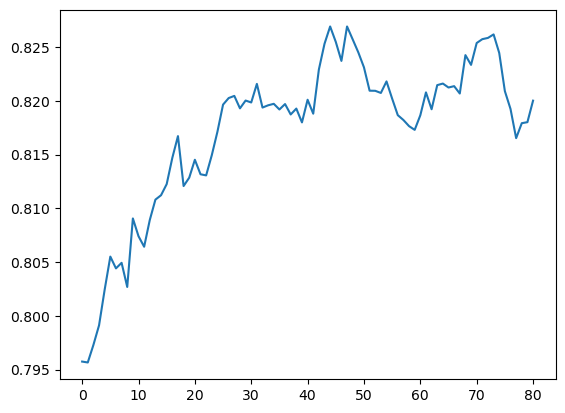

In [11]:
plt.plot(df_wrho.loc[421].rho[20:])

df_wrho.loc[418].rho[:10] * 94933, 94933*0.65, 94933*0.92

# Read real data

In [3]:
realnet_path = Path('../../../triad-statistics/results_realnet2.h5')
results_realnet = pd.read_hdf(realnet_path)
results_realnet

# wikielections

,wiki elections,slashdot,epinions,sampson,bitcoin-alpha,bitcoin-otc,Congress mentions
tr0,0.012461,1.236096e-02,7.488967e-03,0.108808,0.003380,0.004742,0.000000
tr1,0.027505,5.186732e-02,2.700950e-02,0.135579,0.010715,0.031147,0.128114
tr2,0.010724,1.451844e-02,4.778784e-03,0.128670,0.006197,0.011741,0.103203
tr3,0.072158,2.477065e-02,1.890176e-02,0.107945,0.043627,0.037097,0.021352
tr4,0.049625,2.027677e-02,2.477050e-02,0.194301,0.028078,0.034881,0.092527
tr5,0.065085,2.038621e-02,1.184566e-02,0.083765,0.032912,0.029805,0.010676
tr6,0.077725,2.977175e-02,2.997776e-02,0.081174,0.034196,0.030845,0.003559
tr7,0.684716,8.260479e-01,8.752271e-01,0.159758,0.840896,0.819742,0.640569
T,745129.000000,1.251925e+06,1.096199e+07,1158.000000,88753.000000,125886.000000,281.000000
L_plus,75446.000000,2.213970e+05,5.830880e+05,97.000000,15739.000000,22098.000000,0.000000


In [4]:
results_realnet.loc["tr0"]

wiki elections       0.012461
slashdot             0.012361
epinions             0.007489
sampson              0.108808
bitcoin-alpha        0.003380
bitcoin-otc          0.004742
Congress mentions    0.000000
Name: tr0, dtype: float64

In [5]:
results_realnet['wiki elections']

tr0            0.012461
tr1            0.027505
tr2            0.010724
tr3            0.072158
tr4            0.049625
tr5            0.065085
tr6            0.077725
tr7            0.684716
T         745129.000000
L_plus     75446.000000
L          94933.000000
rho            0.794729
Tr0         9285.000000
Tr1        20495.000000
Tr2         7991.000000
Tr3        53767.000000
Tr4        36977.000000
Tr5        48497.000000
Tr6        57915.000000
Tr7       510202.000000
Name: wiki elections, dtype: float64

In [6]:
pd.DataFrame(results_realnet['wiki elections']).transpose()

,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,T,L_plus,L,rho,Tr0,Tr1,Tr2,Tr3,Tr4,Tr5,Tr6,Tr7
wiki elections,0.012461,0.027505,0.010724,0.072158,0.049625,0.065085,0.077725,0.684716,745129.0,75446.0,94933.0,0.794729,9285.0,20495.0,7991.0,53767.0,36977.0,48497.0,57915.0,510202.0


In [7]:
# wiki = pd.DataFrame()

# d = {}

# for i in range(8):
#     lab = "tr" + str(i)
#     d[lab] = results_realnet.loc[lab]['wiki elections']
#     # print(results_realnet.loc[lab].epinions)

# wiki = wiki.append(d, ignore_index=True)
# # epinions.rho = 0.794
# wiki = wiki.assign(rho=0.7947289140762432)
# wiki
wiki = pd.DataFrame(results_realnet['wiki elections']).transpose()
wiki

,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,T,L_plus,L,rho,Tr0,Tr1,Tr2,Tr3,Tr4,Tr5,Tr6,Tr7
wiki elections,0.012461,0.027505,0.010724,0.072158,0.049625,0.065085,0.077725,0.684716,745129.0,75446.0,94933.0,0.794729,9285.0,20495.0,7991.0,53767.0,36977.0,48497.0,57915.0,510202.0


# Error functions

That are used in finding parameters closest to real network stats. 

In [8]:

n2_triads = ["tr1", "tr2", "tr4"]
n1_triads = ["tr3", "tr5", "tr6"]
deg_triads = [*n1_triads, *n2_triads]
all_triads = ["tr" + str(i) for i in range(8)]

# def normalize(data):
#     triads = ["tr" + str(i) for i in range(8)]
#     if data.shape[0] > 1:
#         if data.shape[1] > 1:
#             return data[triads].values.transpose() / np.sum(data[triads], axis=1).values
#     return ValueError("Not implemented")

def transform_data(data, triads = None, triads_groups = None):
    if triads_groups is None:
        T = len(triads)
        if data.shape[0] > 1:
            if data.shape[1] > 1:
                return data[triads].values.transpose() / np.sum(data[triads], axis=1).values - 1/T
            else:
                return data[triads] / np.sum(data[triads]) - 1/T
        else:
            return data[triads] / np.sum(data[triads], axis=1).values[0] - 1/T
    else:
        if type(data) == pd.DataFrame:
            df = data.copy(deep=True)
            for triads in triads_groups:
                nn = transform_data(data, triads)
                
                if np.where(np.array(nn.shape) == 3)[0][0] == 0:
                    nn = nn.transpose()

                new_df = pd.DataFrame(nn, index = data.index, columns=triads)
                df.update(new_df)
            df = df.drop(columns=['tr0', 'tr7'])
            return df
        else:
            ValueError("Not implemented")

def closest_to_six_triads(original_data, model_data):
    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            err = np.sum((model_data[deg_triads].transpose() - original_data[deg_triads].values)**2, axis=1)
            return err
        elif type(model_data) == pd.DataFrame:
            err = (model_data[deg_triads].subtract(original_data[deg_triads].values)**2).sum(axis=1, min_count=1)
            return err
    
    if any(np.isnan(original_data[deg_triads])):
        return np.nan
    
    err = 0
    for triad in deg_triads:
        err += (original_data[triad] - model_data[triad])**2
    return err

def closest_to_six_triads_transformed(original_data, model_data, is_data_transformed = False):
    if is_data_transformed:
        return closest_to_six_triads(original_data, model_data)
    
    
    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            raise ValueError("Not implemented")
        elif type(model_data) == pd.DataFrame:
            original_data_trans = transform_data(original_data, triads_groups=(n1_triads, n2_triads))
            model_data_trans = transform_data(model_data, triads_groups=(n1_triads, n2_triads))
    
            return closest_to_six_triads(original_data_trans, model_data_trans)
    
    # model    
    p1_r = transform_data(original_data, n1_triads)
    p1_m = transform_data(model_data, n1_triads)
    # p1_m = pd.DataFrame(p1_m.transpose(), columns = n1_triads)
    p2_r = transform_data(original_data, n2_triads)
    p2_m = transform_data(model_data, n2_triads)
    # p2_m = pd.DataFrame(p2_m.transpose(), columns = n1_triads)
    
    
    err = np.sum((p1_r - p1_m)**2, axis = 1).values[0]
    err += np.sum((p2_r - p2_m)**2, axis = 1).values[0]
    
    return err

def closest_to_four_triads(original_data, model_data):
    triads = ["tr1", "tr2", "tr5", "tr6"]
    
    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            err = np.sum((model_data[triads].transpose() - original_data[triads].values)**2, axis=1)
            return err
        elif type(model_data) == pd.DataFrame:
            err = (model_data[triads].subtract(original_data[triads].values)**2).sum(min_count=1, axis=1)
            return err
    
    if any(np.isnan(original_data[triads])):
        return np.nan
    
    err = np.sum((original_data[triads] - model_data[triads])**2, axis = 1).values[0]
    return err

def closest_to_four_triads_transformed(original_data, model_data, is_data_transformed = False):
    if is_data_transformed:
        return closest_to_four_triads(original_data, model_data)
    
    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            raise ValueError("Not implemented")
        elif type(model_data) == pd.DataFrame:
            original_data_trans = transform_data(original_data, triads_groups=(n1_triads, n2_triads))
            model_data_trans = transform_data(model_data, triads_groups=(n1_triads, n2_triads))
    
            return closest_to_four_triads(original_data_trans, model_data_trans)
    
    
    p1_r = transform_data(original_data, n1_triads)
    p1_m = transform_data(model_data, n1_triads)
    p2_r = transform_data(original_data, n2_triads)
    p2_m = transform_data(model_data, n2_triads)
    
    triads2 = ["tr1", "tr2"]
    triads1 = ["tr5", "tr6"]
    
    err = np.sum((p1_r[triads1] - p1_m[triads1])**2, axis = 1).values[0]
    err += np.sum((p2_r[triads2] - p2_m[triads2])**2, axis = 1).values[0]
    
    return err

def closest_to_high_underrepresentation(original_data, model_data):
    triads = ["tr2"]
    
    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            err = np.sum((model_data[triads].transpose() - original_data[triads].values)**2, axis=1)
            return err
        elif type(model_data) == pd.DataFrame:
            err = (model_data[triads].subtract(original_data[triads].values)**2).sum(min_count=1, axis=1)
            return err
    
    if any(np.isnan(original_data[triads])):
        return np.nan
    
    err = 0
    err += (original_data["tr2"] - model_data["tr2"])**2
    return err

def closest_to_high_underrepresentation_transformed(original_data, model_data, is_data_transformed = False):
    if is_data_transformed:
        return closest_to_high_underrepresentation(original_data, model_data)
    
    # p1_r = transform_data(original_data, n1_triads)
    # p1_m = transform_data(model_data, n1_triads)
    p2_r = transform_data(original_data, n2_triads)
    p2_m = transform_data(model_data, n2_triads)
    
    if any(np.isnan(p2_r[["tr2"]])):
        return np.nan
    
    err = 0
    err += np.sum((p2_r["tr2"] - p2_m["tr2"])**2)
    return err

def closest_to_rho(original_data, model_data):
    if type(original_data) == pd.DataFrame:
        if type(model_data) == pd.DataFrame:
            err = model_data["rho"].subtract(original_data["rho"].values[0])**2
            return err
    
    err = 0
    err += (original_data["rho"] - model_data["rho"])**2
    return err

"""New error functions"""

"""Assuming we must have proper sign of deviations. """

def closest_to_six_triads_corrdevs_transformed(original_data, model_data, is_data_transformed = False):
    if is_data_transformed:
        
        err = closest_to_four_triads(original_data, model_data)
        err += np.sum(model_data[deg_triads] * (original_data[deg_triads].values)  > 0, axis = 1) != 6
        return err
    
    raise ValueError("Not implemented")

    p1_r = transform_data(original_data, n1_triads)
    p1_m = transform_data(model_data, n1_triads)
    p2_r = transform_data(original_data, n2_triads)
    p2_m = transform_data(model_data, n2_triads)
    
    err = np.sum((p1_r - p1_m)**2, axis = 1).values[0]
    err += np.sum((p2_r - p2_m)**2, axis = 1).values[0]
    
    return err

def closest_to_four_triads_corrdevs_transformed(original_data, model_data, is_data_transformed = False):
    if is_data_transformed:
        triads = ["tr1", "tr2", "tr5", "tr6"]
        err = closest_to_four_triads(original_data, model_data)
        err += np.sum(model_data[triads] * (original_data[triads].values)  > 0, axis = 1) != 4
        return err
    
    raise ValueError("Not implemented")
    
    p1_r = transform_data(original_data, n1_triads)
    p1_m = transform_data(model_data, n1_triads)
    p2_r = transform_data(original_data, n2_triads)
    p2_m = transform_data(model_data, n2_triads)
    
    triads2 = ["tr1", "tr2"]
    triads1 = ["tr5", "tr6"]
    
    err = np.sum((p1_r[triads1] - p1_m[triads1])**2, axis = 1).values[0]
    err += np.sum((p2_r[triads2] - p2_m[triads2])**2, axis = 1).values[0]
    
    return err


"""Combination of triad densities and rho"""

def closest_to_six_triads_rho(original_data, model_data, rho_factor = 5):
    return closest_to_six_triads(original_data, model_data) + closest_to_rho(original_data, model_data) * rho_factor

def closest_to_six_triads_rho_transformed(original_data, model_data, is_data_transformed = False, rho_factor = 5):
    return closest_to_six_triads_transformed(original_data, model_data, is_data_transformed) + closest_to_rho(original_data, model_data) * rho_factor

def closest_to_four_triads_rho(original_data, model_data, rho_factor = 5):
    return closest_to_four_triads(original_data, model_data) + closest_to_rho(original_data, model_data) * rho_factor

def closest_to_four_triads_rho_transformed(original_data, model_data, is_data_transformed = False, rho_factor = 5):
    return closest_to_four_triads_transformed(original_data, model_data, is_data_transformed) + closest_to_rho(original_data, model_data) * rho_factor

"""Not MSE, but relative error. In this way differences for different triads will weight the same. """
def closest_to_six_triads_relative(original_data, model_data):
    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            err = np.sum(ap.abs((model_data[deg_triads].transpose() - original_data[deg_triads].values)/ original_data[deg_triads].values), axis=1)
            return err
        elif type(model_data) == pd.DataFrame:
            # err = np.sum(np.abs(model_data[deg_triads].subtract(original_data[deg_triads].values) / original_data[deg_triads].values), axis=1)
            err = (np.abs(model_data[deg_triads].subtract(original_data[deg_triads].values) / original_data[deg_triads].values)).sum(min_count=1, axis=1)
            return err
    
    if any(np.isnan(original_data[deg_triads])):
        return np.nan
    
    err = 0
    for triad in deg_triads:
        err += (np.abs((original_data[triad] - model_data[triad]) / original_data[triad])).values[0]
    return err

"""Not MSE, but relative error. In this way differences for different triads will weight the same. """
def closest_to_four_triads_relative(original_data, model_data):
    triads = ["tr1", "tr2", "tr5", "tr6"]

    if type(original_data) == pd.DataFrame:
        if type(model_data) == np.ndarray:
            err = np.sum(np.abs((model_data[triads].transpose() - original_data[triads].values)/ original_data[triads].values), axis=1)
            return err
        elif type(model_data) == pd.DataFrame:
            # err = np.sum(np.abs(model_data[deg_triads].subtract(original_data[deg_triads].values) / original_data[deg_triads].values), axis=1)
            err = (np.abs(model_data[triads].subtract(original_data[triads].values) / original_data[triads].values)).sum(min_count=1, axis=1)
            return err
    
    if any(np.isnan(original_data[triads])):
        return np.nan
    
    err = 0
    for triad in triads:
        err += (np.abs((original_data[triad] - model_data[triad]) / original_data[triad])).values[0]
    return err

error_functions = [closest_to_rho, closest_to_high_underrepresentation, closest_to_high_underrepresentation_transformed, 
                   closest_to_four_triads, closest_to_four_triads_transformed, closest_to_six_triads, closest_to_six_triads_transformed]
error_functions.extend([closest_to_six_triads_corrdevs_transformed, closest_to_four_triads_corrdevs_transformed, 
                        closest_to_six_triads_rho, closest_to_six_triads_rho_transformed, closest_to_four_triads_rho, closest_to_four_triads_rho_transformed,
                        closest_to_six_triads_relative, closest_to_four_triads_relative])

# error_functions = [closest_to_rho, closest_to_high_underrepresentation, closest_to_high_underrepresentation_transformed, 
#                    closest_to_four_triads, closest_to_four_triads_transformed, closest_to_six_triads, closest_to_six_triads_transformed]

In [9]:
wiki_trans = transform_data(wiki, triads_groups=(n1_triads, n2_triads))

df_wrho_trans = transform_data(df_wrho, triads_groups = (n1_triads, n2_triads))

# datasets = []
# for error_fun in error_functions:
#     if error_fun.__name__.endswith("_transformed"):
#         datasets.append((wiki_trans, df_w1000_trans, True, 2))
#     else:
#         datasets.append((wiki, df_w1000))


NameError: name 'df_wrho' is not defined

# Finding simulations closest to real-world data results

In [10]:
n1_triads = ['tr3', 'tr5', 'tr6']
n1_nohierarchical = 'tr5'
n2_triads = ['tr1', 'tr2', 'tr4']
n2_nonhierarchical = 'tr2'

triad_names_map={
    'tr7': 'BH0',
    'tr4': 'BH1',
    'tr1': 'BH2',
    'tr2': 'BN1',
    'tr0': 'UH2',
    'tr3': 'UH1',
    'tr5': 'UN1',
    'tr6': 'UH0',
}
triad_names_map.update({value: key for key, value in triad_names_map.items()})


## Finding quasi-stationary level

In [14]:
try:
    path = Path("../../outputs/LtdReal/outputs/wiki2-rhoinits-triads-s2000/qs_levels3.h5")
    df2_wrho = pd.read_hdf(path)
except FileNotFoundError:
    print("FileNotFoundError")
    df2_wrho = get_quasilevels2(df_wrho)
print(len(df2_wrho))
df2_wrho.head(5)
    

FileNotFoundError


/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pgorski/.local/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/pgorski/.local/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=18
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/pgorski/.local/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=17
  warnings.warn("kurtosistest only val

14278


,index,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,...,tr6_qs4_m,tr6_qs4_s,tr7_qs_m,tr7_qs_s,tr7_qs2_m,tr7_qs2_s,tr7_qs3_m,tr7_qs3_s,tr7_qs4_m,tr7_qs4_s
0,0,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9008669272012894, 0.6499952598148168]","[0.000908567509786896, 0.07524468917462614]","[0.008874973326766239, 0.09504528746029212]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9017517617688264, 0.6499952598148168]","[0.0008669639753653394, 0.07548357398517572]","[0.008359626319737924, 0.09397567401080886]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9022363140320016, 0.6499952598148168]","[0.0009582233411932699, 0.07660552736506028]","[0.008747478624506628, 0.09569081326857497]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9006141173248502, 0.6499952598148168]","[0.0009904325291325395, 0.07465016124724712]","[0.008661587456668576, 0.09525330513239989]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.8997924852264229, 0.6499952598148168]","[0.001164898963803583, 0.07614252028843328]","[0.00976877829208097, 0.09622629101806533]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
#In the case of new simulations

if len(df2_joined) != len(df_joined):
    new_inds = []
    old_inds = []
    ind_map = {}

    for ind, row in df_joined.iterrows():
        q = row.q
        p = row.p
        ps = row.ps
        rho_init = row.rho_init
        
        ind_t = np.where((df2_joined.q == q) & (df2_joined.p == p) & (df2_joined.ps == ps) & (df2_joined.rho_init == rho_init))[0]
        
        if len(ind_t) > 0:
            if len(ind_t) > 1:
                minds = np.copy(ind_t)
                found = False
                for ind_ in minds:
                    if np.array_equal(row.rho, df2_joined.loc[ind_].rho):
                    # if np.all(row.rho == df2_joined.loc[ind_].rho):
                        ind_t = ind_
                        found = True
                        break
                if not found:
                    print((ind, ind_t))
            else:
                ind_t = ind_t[0]
            old_inds.append(ind)
            ind_map[ind] = ind_t
        else:
            new_inds.append(ind)
    
    print(len(new_inds))
    print(len(old_inds))

NameError: name 'df2_joined' is not defined

In [26]:
if len(df2_joined) != len(df_joined):
    df_temp = df_joined.loc[new_inds].copy(deep=True)
    df_temp.index.name = "level_1"
    df_temp.reset_index(inplace=True)
    
    df2_temp = get_quasilevels(df_temp)
    
    len(df2_temp)
    df2_temp.head()

NameError: name 'df2_joined' is not defined

In [37]:
if len(df2_joined) != len(df_joined):
    df2_joined = pd.concat([df2_joined, df2_temp])
    print(len(df2_joined) )

9030


In [26]:
path = Path("../../outputs/LtdReal/outputs/wiki2-rhoinits-triads-s2000/qs_levels3.h5")
df2_wrho.to_hdf(path, key = 'df2_wrho')

/home/pgorski/.local/lib/python3.8/site-packages/pandas/core/generic.py:2703: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['cur_steps', 'rho', 'tr0', 'tr1', 'tr2', 'tr3', 'tr4', 'tr5', 'tr6',
       'tr7', 'Lplus'],
      dtype='object')]

  pytables.to_hdf(


In [11]:
try:
    path = Path(outputs_wiki_rhoinits_2000, "qs_levels3.h5")
    df2_wrho = pd.read_hdf(path, key = "df2_wrho")
    
    # df2_wrho.drop(columns = ["index"], inplace = True)
except FileNotFoundError:
    print("FileNotFoundError")
    
print(len(df2_wrho))
df2_wrho.head(5)
    


14278


,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,tr2,...,tr6_qs4_m,tr6_qs4_s,tr7_qs_m,tr7_qs_s,tr7_qs2_m,tr7_qs2_s,tr7_qs3_m,tr7_qs3_s,tr7_qs4_m,tr7_qs4_s
0,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9008669272012894, 0.6499952598148168]","[0.000908567509786896, 0.07524468917462614]","[0.008874973326766239, 0.09504528746029212]","[0.008924629158172612, 0.06673072716267921]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9017517617688264, 0.6499952598148168]","[0.0008669639753653394, 0.07548357398517572]","[0.008359626319737924, 0.09397567401080886]","[0.008420018547124056, 0.06630529747198136]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9022363140320016, 0.6499952598148168]","[0.0009582233411932699, 0.07660552736506028]","[0.008747478624506628, 0.09569081326857497]","[0.008768951416466142, 0.06581008120741509]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9006141173248502, 0.6499952598148168]","[0.0009904325291325395, 0.07465016124724712]","[0.008661587456668576, 0.09525330513239989]","[0.009056150008924629, 0.06845123461843519]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.8997924852264229, 0.6499952598148168]","[0.001164898963803583, 0.07614252028843328]","[0.00976877829208097, 0.09622629101806533]","[0.009650677936303647, 0.06884579717069125]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
chosen_cols = ['q', 'p', 'ps', 'rho_qs_m',
       'rho_qs_s', 'rho_qs_b', 'rho_qs_f', 'rho_qs2_m', 'rho_qs2_s',
       'rho_qs2_b', 'rho_qs2_f']

df2_wrho[['q', 'p', 'ps', 'rho_qs_m',
       'rho_qs_s', 'rho_qs_b', 'rho_qs_f', 'rho_qs3_m', 'rho_qs3_s',
       'rho_qs3_b', 'rho_qs3_f']]

,q,p,ps,rho_qs_m,rho_qs_s,rho_qs_b,rho_qs_f,rho_qs3_m,rho_qs3_s,rho_qs3_b,rho_qs3_f
0,0.925,0.9,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.925,0.9,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.925,0.9,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.925,0.9,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.925,0.9,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
14273,0.775,0.7,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14274,0.775,0.7,1.0,0.91605,0.000551,17.0,22.0,NaN,NaN,NaN,NaN
14275,0.775,0.7,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14276,0.775,0.7,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
df2_wrho.reset_index(inplace=True, drop=True)

len(df2_wrho.index.values), len(np.unique(df2_wrho.index.values))

(14278, 14278)

In [13]:
for ind, row in df2_wrho.iterrows():
    q = round(row.q, 5)
    psbt = round(row.p, 5)
    pst = round(row.ps, 5)
    rho_init = round(row.rho_init, 5)
    
    df2_wrho.at[ind, "q"] = q
    df2_wrho.at[ind, "p"] = psbt
    df2_wrho.at[ind, "ps"] = pst
    df2_wrho.at[ind, "rho_init"] = rho_init


In [14]:
# df2_wrho.drop(columns = ["index"], inplace = True)
df2_wrho.head(2)

,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,tr2,...,tr6_qs4_m,tr6_qs4_s,tr7_qs_m,tr7_qs_s,tr7_qs2_m,tr7_qs2_s,tr7_qs3_m,tr7_qs3_s,tr7_qs4_m,tr7_qs4_s
0,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9008669272012894, 0.6499952598148168]","[0.000908567509786896, 0.07524468917462614]","[0.008874973326766239, 0.09504528746029212]","[0.008924629158172612, 0.06673072716267921]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.925,0.9,0.1,0.9,2000,"[0, 20]","[0.9017517617688264, 0.6499952598148168]","[0.0008669639753653394, 0.07548357398517572]","[0.008359626319737924, 0.09397567401080886]","[0.008420018547124056, 0.06630529747198136]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
inds = [row.cur_steps[-1] == row.steps for ind,row in df2_wrho.iterrows()]

df2_wrho_correct = df2_wrho.iloc[inds]

In [23]:
df2_wrho_g = group_quasilevels2(df2_wrho, cols = ['q', 'p', 'ps', 'rho_init'])
df2_wrho_g

/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


q    p   ps  rho_init  repetitions   rho_lvl  \
0.75 0.0 0.0 0.9  0.75  0.0  0.0       0.9            5       NaN   
         0.1 0.9  0.75  0.0  0.1       0.9            5       NaN   
         0.2 0.9  0.75  0.0  0.2       0.9            5       NaN   
         0.3 0.9  0.75  0.0  0.3       0.9            5       NaN   
         0.4 0.9  0.75  0.0  0.4       0.9            5       NaN   
...                ...  ...  ...       ...          ...       ...   
0.95 1.0 0.9 0.2  0.95  1.0  0.9       0.2            5  0.918213   
             0.9  0.95  1.0  0.9       0.9            5  0.989440   
         1.0 0.0  0.95  1.0  1.0       0.0            5  0.887526   
             0.2  0.95  1.0  1.0       0.2            5  0.918137   
             0.9  0.95  1.0  1.0       0.9            5       NaN   

                  rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.75 0.0 0.0 0.9          NaN              0     0.000000       NaN  ...   
         0.1 0.9          NaN              0     0.000000       NaN  ...   
         0.2 0.9          NaN              0     0.000000       NaN  ...   
         0.3 0.9          NaN              0     0.000000       NaN  ...   
         0.4 0.9          NaN              0     0.000000       NaN  ...   
...                       ...            ...          ...       ...  ...   
0.95 1.0 0.9 0.2     0.000831              5     0.006253  0.918213  ...   
             0.9     0.000000              1     0.001825  0.989440  ...   
         1.0 0.0     0.002594              5     0.002865  0.887526  ...   
             0.2     0.000309              5     0.005993  0.918137  ...   
             0.9          NaN              0     0.000000       NaN  ...   

                  tr4_sim_std4  tr5_lvl4  tr5_lvl4_std  tr5_sim_std4  \
0.75 0.0 0.0 0.9       0.00000       NaN           NaN      0.000000   
         0.1 0.9       0.00000       NaN           NaN      0.000000   
         0.2 0.9       0.00000       NaN           NaN      0.000000   
         0.3 0.9       0.00000       NaN           NaN      0.000000   
         0.4 0.9       0.00000       NaN           NaN      0.000000   
...                        ...       ...           ...           ...   
0.95 1.0 0.9 0.2       0.00000       NaN           NaN      0.000000   
             0.9       0.00000       NaN           NaN      0.000000   
         1.0 0.0       0.00095  0.005127      0.000155      0.001988   
             0.2       0.00000       NaN           NaN      0.000000   
             0.9       0.00000       NaN           NaN      0.000000   

                  tr6_lvl4  tr6_lvl4_std  tr6_sim_std4  tr7_lvl4  \
0.75 0.0 0.0 0.9       NaN           NaN      0.000000       NaN   
         0.1 0.9       NaN           NaN      0.000000       NaN   
         0.2 0.9       NaN           NaN      0.000000       NaN   
         0.3 0.9       NaN           NaN      0.000000       NaN   
         0.4 0.9       NaN           NaN      0.000000       NaN   
...                    ...           ...           ...       ...   
0.95 1.0 0.9 0.2       NaN           NaN      0.000000       NaN   
             0.9       NaN           NaN      0.000000       NaN   
         1.0 0.0  0.026619      0.000303      0.001714  0.929358   
             0.2       NaN           NaN      0.000000       NaN   
             0.9       NaN           NaN      0.000000       NaN   

                  tr7_lvl4_std  tr7_sim_std4  
0.75 0.0 0.0 0.9           NaN        0.0000  
         0.1 0.9           NaN        0.0000  
         0.2 0.9           NaN        0.0000  
         0.3 0.9           NaN        0.0000  
         0.4 0.9           NaN        0.0000  
...                        ...           ...  
0.95 1.0 0.9 0.2           NaN        0.0000  
             0.9           NaN        0.0000  
         1.0 0.0      0.002371        0.0051  
             0.2           NaN        0.0000  
             0.9           NaN        0.0000  

[2759 rows x 94 columns]

In [16]:
df2_wrho_correct_g = group_quasilevels2(df2_wrho_correct, cols = ['q', 'p', 'ps', 'rho_init'])
df2_wrho_correct_g

/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/pgorski/.local/lib/python3.8/site-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pgorski/Desktop/programming/toolbox/complex-system-toolbox/experiments/phase_transit

q    p   ps  rho_init  repetitions   rho_lvl  \
0.75 0.0 0.9 0.2  0.75  0.0  0.9       0.2            5  0.671249   
             0.4  0.75  0.0  0.9       0.4            5  0.678054   
             0.6  0.75  0.0  0.9       0.6            5  0.685312   
             0.8  0.75  0.0  0.9       0.8            5  0.690937   
             0.9  0.75  0.0  0.9       0.9            5  0.694049   
...                ...  ...  ...       ...          ...       ...   
0.95 1.0 0.6 0.0  0.95  1.0  0.6       0.0            5  0.886219   
         0.7 0.0  0.95  1.0  0.7       0.0            5  0.894946   
         0.8 0.0  0.95  1.0  0.8       0.0            5  0.894108   
         0.9 0.0  0.95  1.0  0.9       0.0            5  0.889293   
         1.0 0.0  0.95  1.0  1.0       0.0            5  0.887526   

                  rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.75 0.0 0.9 0.2     0.000514              5     0.006258       NaN  ...   
             0.4     0.000382              5     0.005146       NaN  ...   
             0.6     0.000821              5     0.006751       NaN  ...   
             0.8     0.000562              5     0.006628       NaN  ...   
             0.9     0.000788              5     0.006633       NaN  ...   
...                       ...            ...          ...       ...  ...   
0.95 1.0 0.6 0.0     0.002472              5     0.003146  0.886219  ...   
         0.7 0.0     0.001542              5     0.002252  0.894946  ...   
         0.8 0.0     0.004145              5     0.000690  0.894108  ...   
         0.9 0.0     0.002409              5     0.000992  0.889293  ...   
         1.0 0.0     0.002594              5     0.000573  0.887526  ...   

                  tr4_sim_std4  tr5_lvl4  tr5_lvl4_std  tr5_sim_std4  \
0.75 0.0 0.9 0.2      0.003169  0.118849      0.000272      0.002912   
             0.4      0.002968  0.118810      0.000286      0.003128   
             0.6      0.003419  0.118887      0.000216      0.003389   
             0.8      0.003362  0.119293      0.000160      0.003465   
             0.9      0.003276  0.119320      0.000160      0.003500   
...                        ...       ...           ...           ...   
0.95 1.0 0.6 0.0      0.000604  0.024315      0.000239      0.001296   
         0.7 0.0      0.000405  0.014312      0.000358      0.000761   
         0.8 0.0      0.000353  0.009444      0.000205      0.000608   
         0.9 0.0      0.000374  0.006821      0.000093      0.000642   
         1.0 0.0      0.000190  0.005127      0.000155      0.000398   

                  tr6_lvl4  tr6_lvl4_std  tr6_sim_std4  tr7_lvl4  \
0.75 0.0 0.9 0.2  0.152652      0.000741      0.004901  0.359084   
             0.4  0.150486      0.000241      0.005493  0.362519   
             0.6  0.148697      0.000431      0.004995  0.366276   
             0.8  0.146708      0.000696      0.005398  0.368774   
             0.9  0.145705      0.000276      0.005388  0.369619   
...                    ...           ...           ...       ...   
0.95 1.0 0.6 0.0  0.046448      0.000274      0.001598  0.870685   
         0.7 0.0  0.036384      0.000432      0.001065  0.909747   
         0.8 0.0  0.031245      0.000539      0.000808  0.923139   
         0.9 0.0  0.028502      0.000146      0.000725  0.926201   
         1.0 0.0  0.026619      0.000303      0.000343  0.929358   

                  tr7_lvl4_std  tr7_sim_std4  
0.75 0.0 0.9 0.2      0.000581      0.013268  
             0.4      0.000779      0.012661  
             0.6      0.000458      0.015222  
             0.8      0.001102      0.014778  
             0.9      0.001863      0.015181  
...                        ...           ...  
0.95 1.0 0.6 0.0      0.002205      0.004963  
         0.7 0.0      0.001470      0.002945  
         0.8 0.0      0.002310      0.001688  
         0.9 0.0      0.001562      0.001828  
         1.0 0.0      0.002371      0.001020  

[1333 rows x 94 columns]

In [17]:
inds = np.isnan(df2_wrho_correct_g.rho_lvl3)
df2_wrho_correct_g.loc[inds]
# inds

q    p   ps  rho_init  repetitions   rho_lvl  \
0.95 0.1 1.0 0.0  0.95  0.1  1.0       0.0            5  0.894344   
     0.8 0.5 0.9  0.95  0.8  0.5       0.9            1  0.897737   
     1.0 0.9 0.0  0.95  1.0  0.9       0.0            5  0.889293   

                  rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.95 0.1 1.0 0.0     0.000851              5     0.000855  0.894344  ...   
     0.8 0.5 0.9     0.000000              1     0.028993  0.897737  ...   
     1.0 0.9 0.0     0.002409              5     0.000992  0.889293  ...   

                  tr4_sim_std4  tr5_lvl4  tr5_lvl4_std  tr5_sim_std4  \
0.95 0.1 1.0 0.0      0.000281  0.006648      0.000278      0.000478   
     0.8 0.5 0.9      0.002705  0.050154      0.000000      0.008273   
     1.0 0.9 0.0      0.000374  0.006821      0.000093      0.000642   

                  tr6_lvl4  tr6_lvl4_std  tr6_sim_std4  tr7_lvl4  \
0.95 0.1 1.0 0.0  0.030260      0.000404      0.000613  0.930234   
     0.8 0.5 0.9  0.067183      0.000000      0.012394  0.733101   
     1.0 0.9 0.0  0.028502      0.000146      0.000725  0.926201   

                  tr7_lvl4_std  tr7_sim_std4  
0.95 0.1 1.0 0.0      0.001189      0.001368  
     0.8 0.5 0.9      0.000000      0.039874  
     1.0 0.9 0.0      0.001562      0.001828  

[3 rows x 94 columns]

### Drawing rho(t) and tr(t)

Text(0.5, 1.0, 'q, psbt, pst = 0.95, 1.0, 0.9')

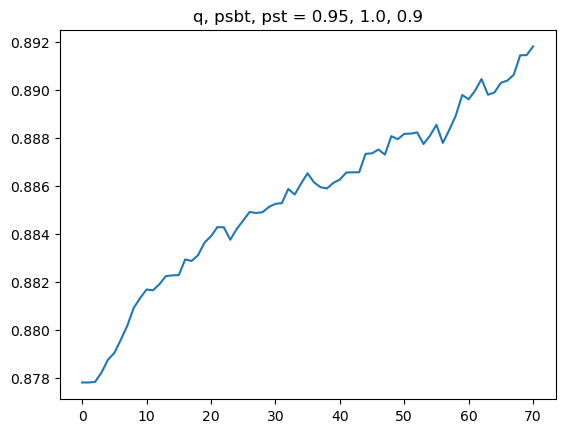

In [39]:
q = 0.95
p = 1.
ps = 0.9
rho_init = 0.0

ind_t = np.where( (np.abs(df2_wrho_correct.q - q) < 1e-5) & (np.abs(df2_wrho_correct.p - p ) < 1e-5) & (np.abs(df2_wrho_correct.rho_init - rho_init) < 1e-5) & (np.abs(df2_wrho_correct.ps - ps) < 1e-5))[0]


# df_one = df102.iloc[0].rho
df_one = df2_wrho_correct.iloc[ind_t[0]].rho
# q = df_w1000.iloc[108].q
# p = df_w1000.iloc[108].p
# ps = df_w1000.iloc[108].ps
df_one
plt.plot(df_one[30:])
plt.title('q, psbt, pst = ' + str(q) + ', ' + str(p) + ', ' + str(ps))

Text(0.5, 1.0, 'q, psbt, pst = 0.8, 1.0, 0.5')

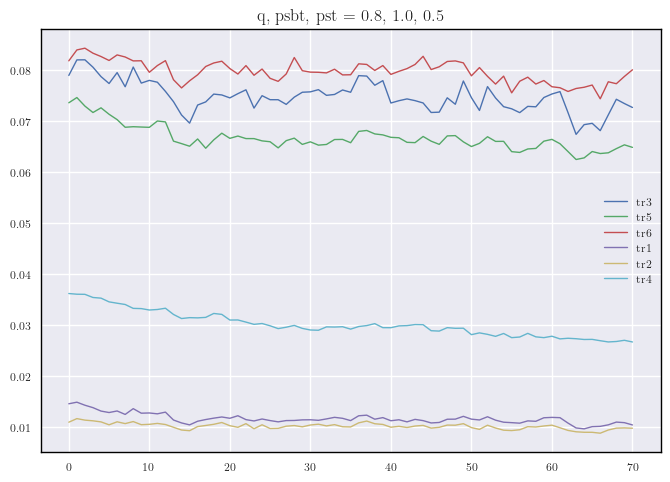

In [248]:
# df_one = df_w2.iloc[0].rho
# df_one
# plt.plot(df_one)

# plt.plot()

for triad in deg_triads:
    plt.plot(df2_joined_correct.iloc[ind_t[0]][triad][30:])
    
plt.legend(deg_triads)
# plt.xscale('log')

plt.title('q, psbt, pst = ' + str(q) + ', ' + str(p) + ', ' + str(ps))

In [312]:
rho_exp = 0.955414
m, s, b, f, tt = get_quasilevel_exp(df_one, rho_exp)

m - s, m + s, df_one[b]

(0.974799860755859, 1.0074328246640774, 0.951010101010101)

### Applying error functions to QS results

In [40]:
df2_wrho_g.columns

Index(['q', 'p', 'ps', 'rho_init', 'repetitions', 'rho_lvl', 'rho_lvl_std',
       'rho_lvl_valid', 'rho_lvl2', 'rho_lvl2_std', 'rho_lvl2_valid',
       'rho_lvl3', 'rho_lvl3_std', 'rho_lvl3_valid', 'rho_lvl_exp', 'tr_valid',
       'tr0_lvl', 'tr0_lvl_std', 'tr1_lvl', 'tr1_lvl_std', 'tr2_lvl',
       'tr2_lvl_std', 'tr3_lvl', 'tr3_lvl_std', 'tr4_lvl', 'tr4_lvl_std',
       'tr5_lvl', 'tr5_lvl_std', 'tr6_lvl', 'tr6_lvl_std', 'tr7_lvl',
       'tr7_lvl_std', 'tr0_lvl3', 'tr0_lvl3_std', 'tr1_lvl3', 'tr1_lvl3_std',
       'tr2_lvl3', 'tr2_lvl3_std', 'tr3_lvl3', 'tr3_lvl3_std', 'tr4_lvl3',
       'tr4_lvl3_std', 'tr5_lvl3', 'tr5_lvl3_std', 'tr6_lvl3', 'tr6_lvl3_std',
       'tr7_lvl3', 'tr7_lvl3_std'],
      dtype='object')

In [18]:
"""Adjusting col names"""

for col in df2_wrho_correct_g.columns:
    if col.endswith("_lvl3"):
        new_col = col.split("_lvl3")[0]
        df2_wrho_correct_g[new_col] = df2_wrho_correct_g[col]


In [19]:
path = Path(outputs_wiki_rhoinits_2000, "qs_grouped_corr.h5")
df2_wrho_correct_g.to_hdf(path, key = 'df2_wrho_correct_g')

In [20]:
df2_wrho_correct_g[["rho_lvl", "rho_lvl2", "rho_lvl3", "rho_lvl4", "rho"]]

rho_lvl  rho_lvl2  rho_lvl3  rho_lvl4       rho
0.75 0.0 0.9 0.2  0.671249       NaN  0.671149  0.671277  0.671149
             0.4  0.678054       NaN  0.677964  0.678022  0.677964
             0.6  0.685312       NaN  0.685361  0.685322  0.685361
             0.8  0.690937       NaN  0.690910  0.690910  0.690910
             0.9  0.694049       NaN  0.694022  0.694022  0.694022
...                    ...       ...       ...       ...       ...
0.95 1.0 0.6 0.0  0.886219  0.886219  0.889994  0.886502  0.889994
         0.7 0.0  0.894946  0.894946  0.896667  0.895688  0.896667
         0.8 0.0  0.894108  0.894108  0.895917  0.894209  0.895917
         0.9 0.0  0.889293  0.889293       NaN  0.889074       NaN
         1.0 0.0  0.887526  0.887526  0.890680  0.887559  0.890680

[1333 rows x 5 columns]

In [21]:
"""Adjusting col names"""

for col in df2_wrho_correct.columns:
    if col.endswith("_qs3_m"):
        new_col = col.split("_qs3_m")[0]
        df2_wrho_correct[new_col] = df2_wrho_correct[col]


/tmp/ipykernel_143443/3382291978.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_wrho_correct[new_col] = df2_wrho_correct[col]


In [22]:
df2_wrho_correct.head(5)

,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,tr2,...,tr6_qs4_m,tr6_qs4_s,tr7_qs_m,tr7_qs_s,tr7_qs2_m,tr7_qs2_s,tr7_qs3_m,tr7_qs3_s,tr7_qs4_m,tr7_qs4_s
10,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.861974,0.001093,0.007165,0.002310,...,0.062465,0.001211,0.855304,0.002531,0.855304,0.002531,0.854659,0.002851,0.855475,0.002412
11,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.860587,0.001056,0.007218,0.002166,...,0.063021,0.001613,0.859333,0.003244,0.859333,0.003244,0.858704,0.003379,0.858704,0.003379
12,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,0.064541,0.001496,0.854549,0.003681,0.854549,0.003681,NaN,NaN,0.854788,0.003591
13,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,0.063810,0.001031,0.854890,0.003250,0.854890,0.003250,NaN,NaN,0.854745,0.003762
14,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.861500,0.001071,0.007253,0.002145,...,0.063300,0.001663,0.855811,0.003158,0.855811,0.003158,0.857683,0.003237,0.855394,0.002774


In [23]:
df2_wrho_correct_g_trans = transform_data(df2_wrho_correct_g, triads_groups = (n1_triads, n2_triads))
df2_wrho_correct_g_trans

q    p   ps  rho_init  repetitions   rho_lvl  \
0.75 0.0 0.9 0.2  0.75  0.0  0.9       0.2            5  0.671249   
             0.4  0.75  0.0  0.9       0.4            5  0.678054   
             0.6  0.75  0.0  0.9       0.6            5  0.685312   
             0.8  0.75  0.0  0.9       0.8            5  0.690937   
             0.9  0.75  0.0  0.9       0.9            5  0.694049   
...                ...  ...  ...       ...          ...       ...   
0.95 1.0 0.6 0.0  0.95  1.0  0.6       0.0            5  0.886219   
         0.7 0.0  0.95  1.0  0.7       0.0            5  0.894946   
         0.8 0.0  0.95  1.0  0.8       0.0            5  0.894108   
         0.9 0.0  0.95  1.0  0.9       0.0            5  0.889293   
         1.0 0.0  0.95  1.0  1.0       0.0            5  0.887526   

                  rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.75 0.0 0.9 0.2     0.000514              5     0.006258       NaN  ...   
             0.4     0.000382              5     0.005146       NaN  ...   
             0.6     0.000821              5     0.006751       NaN  ...   
             0.8     0.000562              5     0.006628       NaN  ...   
             0.9     0.000788              5     0.006633       NaN  ...   
...                       ...            ...          ...       ...  ...   
0.95 1.0 0.6 0.0     0.002472              5     0.003146  0.886219  ...   
         0.7 0.0     0.001542              5     0.002252  0.894946  ...   
         0.8 0.0     0.004145              5     0.000690  0.894108  ...   
         0.9 0.0     0.002409              5     0.000992  0.889293  ...   
         1.0 0.0     0.002594              5     0.000573  0.887526  ...   

                  tr7_lvl4  tr7_lvl4_std  tr7_sim_std4       rho       tr1  \
0.75 0.0 0.9 0.2  0.359084      0.000581      0.013268  0.671149  0.015870   
             0.4  0.362519      0.000779      0.012661  0.677964  0.022961   
             0.6  0.366276      0.000458      0.015222  0.685361  0.030485   
             0.8  0.368774      0.001102      0.014778  0.690910  0.038135   
             0.9  0.369619      0.001863      0.015181  0.694022  0.042035   
...                    ...           ...           ...       ...       ...   
0.95 1.0 0.6 0.0  0.870685      0.002205      0.004963  0.889994 -0.197621   
         0.7 0.0  0.909747      0.001470      0.002945  0.896667 -0.285947   
         0.8 0.0  0.923139      0.002310      0.001688  0.895917 -0.314777   
         0.9 0.0  0.926201      0.001562      0.001828       NaN       NaN   
         1.0 0.0  0.929358      0.002371      0.001020  0.890680 -0.331601   

                       tr2       tr3       tr4       tr5       tr6  
0.75 0.0 0.9 0.2 -0.024766  0.020749  0.008896 -0.050430  0.029680  
             0.4 -0.024808  0.024508  0.001847 -0.050030  0.025522  
             0.6 -0.025732  0.027268 -0.004752 -0.049259  0.021991  
             0.8 -0.028165  0.029324 -0.009970 -0.047506  0.018181  
             0.9 -0.029169  0.030929 -0.012866 -0.047110  0.016181  
...                    ...       ...       ...       ...       ...  
0.95 1.0 0.6 0.0 -0.240604 -0.010321  0.438225 -0.103652  0.113973  
         0.7 0.0 -0.291118 -0.093482  0.577065 -0.120684  0.214166  
         0.8 0.0 -0.309526 -0.158389  0.624303 -0.142600  0.300989  
         0.9 0.0       NaN       NaN       NaN       NaN       NaN  
         1.0 0.0 -0.321784 -0.255412  0.653385 -0.181855  0.437268  

[1333 rows x 101 columns]

In [24]:
df2_wrho_correct_trans = transform_data(df2_wrho_correct, triads_groups=(n1_triads, n2_triads))

In [25]:
df2_wrho_correct_trans.head(5)

,q,p,ps,rho_init,steps,cur_steps,rho,tr1,tr2,tr3,...,tr6_qs4_m,tr6_qs4_s,tr7_qs_m,tr7_qs_s,tr7_qs2_m,tr7_qs2_s,tr7_qs3_m,tr7_qs3_s,tr7_qs4_m,tr7_qs4_s
10,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.861974,-0.044530,-0.240218,-0.051242,...,0.062465,0.001211,0.855304,0.002531,0.855304,0.002531,0.854659,0.002851,0.855475,0.002412
11,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.860587,-0.048689,-0.247894,-0.061421,...,0.063021,0.001613,0.859333,0.003244,0.859333,0.003244,0.858704,0.003379,0.858704,0.003379
12,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,0.064541,0.001496,0.854549,0.003681,0.854549,0.003681,NaN,NaN,0.854788,0.003591
13,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,0.063810,0.001031,0.854890,0.003250,0.854890,0.003250,NaN,NaN,0.854745,0.003762
14,0.95,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.861500,-0.035986,-0.245410,-0.053987,...,0.063300,0.001663,0.855811,0.003158,0.855811,0.003158,0.857683,0.003237,0.855394,0.002774


In [26]:
# wiki_trans = transform_data(wiki, triads_groups=(n1_triads, n2_triads))

# df_w1000_trans = transform_data(df_w1000, triads_groups = (n1_triads, n2_triads))

datasets = []
datasets2 = []
for error_fun in error_functions:
    if error_fun.__name__.endswith("_transformed"):
        datasets.append((wiki_trans, df2_wrho_correct_g_trans, True, 2))
        datasets2.append((wiki_trans, df2_wrho_correct_trans, True, 2))
    else:
        datasets.append((wiki, df2_wrho_correct_g))
        datasets2.append((wiki, df2_wrho_correct))


In [27]:
closest_to_four_triads_transformed(wiki_trans, df2_wrho_correct_g_trans, True)

0.75  0.0  0.9  0.2    0.036483
                0.4    0.037020
                0.6    0.037385
                0.8    0.037323
                0.9    0.037458
                         ...   
0.95  1.0  0.6  0.0    0.045013
           0.7  0.0    0.119662
           0.8  0.0    0.183347
           0.9  0.0         NaN
           1.0  0.0    0.299350
Length: 1333, dtype: float64

In [28]:

errs = {error_fun.__name__: np.zeros(len(df2_wrho_correct_g)) for error_fun in error_functions}

for ind, (dataset, error_fun) in enumerate(zip(datasets, error_functions)):
    # original_data, model_data, is_trans = dataset
    # if is_trans:
    # errs[error_fun.__name__] = error_fun(original_data, model_data)
    # print(ind)
    try:
        errs[error_fun.__name__] = error_fun(*dataset)
    except TypeError:
        errs[error_fun.__name__] = error_fun(*dataset[:3])
    
    # if len(dataset) > 2:
        

for error_fun in error_functions:
    df2_wrho_correct_g[error_fun.__name__] = errs[error_fun.__name__]

df2_wrho_correct_g

q    p   ps  rho_init  repetitions   rho_lvl  \
0.75 0.0 0.9 0.2  0.75  0.0  0.9       0.2            5  0.671249   
             0.4  0.75  0.0  0.9       0.4            5  0.678054   
             0.6  0.75  0.0  0.9       0.6            5  0.685312   
             0.8  0.75  0.0  0.9       0.8            5  0.690937   
             0.9  0.75  0.0  0.9       0.9            5  0.694049   
...                ...  ...  ...       ...          ...       ...   
0.95 1.0 0.6 0.0  0.95  1.0  0.6       0.0            5  0.886219   
         0.7 0.0  0.95  1.0  0.7       0.0            5  0.894946   
         0.8 0.0  0.95  1.0  0.8       0.0            5  0.894108   
         0.9 0.0  0.95  1.0  0.9       0.0            5  0.889293   
         1.0 0.0  0.95  1.0  1.0       0.0            5  0.887526   

                  rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.75 0.0 0.9 0.2     0.000514              5     0.006258       NaN  ...   
             0.4     0.000382              5     0.005146       NaN  ...   
             0.6     0.000821              5     0.006751       NaN  ...   
             0.8     0.000562              5     0.006628       NaN  ...   
             0.9     0.000788              5     0.006633       NaN  ...   
...                       ...            ...          ...       ...  ...   
0.95 1.0 0.6 0.0     0.002472              5     0.003146  0.886219  ...   
         0.7 0.0     0.001542              5     0.002252  0.894946  ...   
         0.8 0.0     0.004145              5     0.000690  0.894108  ...   
         0.9 0.0     0.002409              5     0.000992  0.889293  ...   
         1.0 0.0     0.002594              5     0.000573  0.887526  ...   

                  closest_to_six_triads  closest_to_six_triads_transformed  \
0.75 0.0 0.9 0.2               0.018585                           0.086384   
             0.4               0.018382                           0.090261   
             0.6               0.018163                           0.093831   
             0.8               0.017988                           0.096368   
             0.9               0.017946                           0.098000   
...                                 ...                                ...   
0.95 1.0 0.6 0.0               0.005889                           0.087900   
         0.7 0.0               0.009177                           0.248244   
         0.8 0.0               0.010752                           0.363457   
         0.9 0.0                    NaN                                NaN   
         1.0 0.0               0.012136                           0.543754   

                  closest_to_six_triads_corrdevs_transformed  \
0.75 0.0 0.9 0.2                                    1.036483   
             0.4                                    1.037020   
             0.6                                    1.037385   
             0.8                                    1.037323   
             0.9                                    1.037458   
...                                                      ...   
0.95 1.0 0.6 0.0                                    1.045013   
         0.7 0.0                                    1.119662   
         0.8 0.0                                    1.183347   
         0.9 0.0                                         NaN   
         1.0 0.0                                    1.299350   

                  closest_to_four_triads_corrdevs_transformed  \
0.75 0.0 0.9 0.2                                     1.036483   
             0.4                                     1.037020   
             0.6                                     1.037385   
             0.8                                     1.037323   
             0.9                                     1.037458   
...                                                       ...   
0.95 1.0 0.6 0.0                                     0.045013   
         0.7 0.0                                     

In [29]:

errs = {error_fun.__name__: np.zeros(len(df2_wrho_correct)) for error_fun in error_functions}

for ind, (dataset, error_fun) in enumerate(zip(datasets2, error_functions)):
    # original_data, model_data, is_trans = dataset
    # if is_trans:
    # errs[error_fun.__name__] = error_fun(original_data, model_data)
    # print(ind)
    try:
        errs[error_fun.__name__] = error_fun(*dataset)
    except TypeError:
        errs[error_fun.__name__] = error_fun(*dataset[:3])
    
    # if len(dataset) > 2:
        

for error_fun in error_functions:
    df2_wrho_correct[error_fun.__name__] = errs[error_fun.__name__]

df2_wrho_correct

/tmp/ipykernel_143443/3830207427.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_wrho_correct[error_fun.__name__] = errs[error_fun.__name__]


,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,tr2,...,closest_to_six_triads,closest_to_six_triads_transformed,closest_to_six_triads_corrdevs_transformed,closest_to_four_triads_corrdevs_transformed,closest_to_six_triads_rho,closest_to_six_triads_rho_transformed,closest_to_four_triads_rho,closest_to_four_triads_rho_transformed,closest_to_six_triads_relative,closest_to_four_triads_relative
10,0.950,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.861974,0.001093,0.007165,0.002310,...,0.005192,0.050837,1.045133,0.045133,0.027802,0.059881,0.025146,0.054177,3.590021,2.365941
11,0.950,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.860587,0.001056,0.007218,0.002166,...,0.005485,0.060608,1.052310,0.052310,0.027171,0.069282,0.024364,0.060984,3.653099,2.407880
12,0.950,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,0.950,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,0.950,0.0,0.8,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.861500,0.001071,0.007253,0.002145,...,0.005383,0.053051,1.047392,0.047392,0.027675,0.061968,0.024915,0.056308,3.645216,2.399755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14268,0.775,0.7,1.0,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.901808,0.000419,0.000878,0.002199,...,0.007911,0.183646,1.092945,0.092945,0.065241,0.206578,0.060929,0.115877,4.296809,2.826664
14269,0.775,0.7,1.0,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.900116,0.000414,0.000837,0.002120,...,0.008039,0.198654,1.097558,0.097558,0.063571,0.220867,0.059231,0.119771,4.313242,2.853502
14270,0.775,0.7,1.0,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",0.901056,0.000405,0.000832,0.002196,...,0.008006,0.190951,1.095520,0.095520,0.064533,0.213562,0.060208,0.118131,4.308175,2.843377
14271,0.775,0.7,1.0,0.0,2000,"[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 2...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
row

q               0.775
p                 0.7
ps                1.0
rho_init          0.2
steps            2000
               ...   
tr7_qs2_s    0.000126
tr7_qs3_m         NaN
tr7_qs3_s         NaN
tr7_qs4_m         NaN
tr7_qs4_s         NaN
Name: 14277, Length: 96, dtype: object

In [31]:

for error_fun in error_functions:
    error_mins = []
    error_maxs = []
    error_means = []
    error_stds = []

    for row, col in df2_wrho_correct_g.iterrows():
        inds = get_inds(df2_wrho_correct, [row], True)
        
        df_temp = df2_wrho_correct.iloc[inds]
        
        # print(df_temp)
        # print(row)
        # break
        
        error_min = np.min(df_temp[error_fun.__name__])
        error_max = np.max(df_temp[error_fun.__name__])
        error_std = np.std(df_temp[error_fun.__name__])
        error_mean = np.mean(df_temp[error_fun.__name__])
        
        error_mins.append(error_min)
        error_maxs.append(error_max)
        error_means.append(error_mean)
        error_stds.append(error_std)
        # break
    # break
    colname = error_fun.__name__ + "_min"
    df2_wrho_correct_g[colname] = error_mins
    colname = error_fun.__name__ + "_max"
    df2_wrho_correct_g[colname] = error_maxs
    colname = error_fun.__name__ + "_mean"
    df2_wrho_correct_g[colname] = error_means
    colname = error_fun.__name__ + "_std"
    df2_wrho_correct_g[colname] = error_stds
    # break
# error_means
df2_wrho_correct_g.head(5)

q    p   ps  rho_init  repetitions   rho_lvl  \
0.75 0.0 0.9 0.2  0.75  0.0  0.9       0.2            5  0.671249   
             0.4  0.75  0.0  0.9       0.4            5  0.678054   
             0.6  0.75  0.0  0.9       0.6            5  0.685312   
             0.8  0.75  0.0  0.9       0.8            5  0.690937   
             0.9  0.75  0.0  0.9       0.9            5  0.694049   

                  rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.75 0.0 0.9 0.2     0.000514              5     0.006258       NaN  ...   
             0.4     0.000382              5     0.005146       NaN  ...   
             0.6     0.000821              5     0.006751       NaN  ...   
             0.8     0.000562              5     0.006628       NaN  ...   
             0.9     0.000788              5     0.006633       NaN  ...   

                  closest_to_four_triads_rho_transformed_mean  \
0.75 0.0 0.9 0.2                                     0.067032   
             0.4                                     0.064290   
             0.6                                     0.061312   
             0.8                                     0.058887   
             0.9                                     0.057744   

                  closest_to_four_triads_rho_transformed_std  \
0.75 0.0 0.9 0.2                                    0.000221   
             0.4                                    0.000396   
             0.6                                    0.000260   
             0.8                                    0.000303   
             0.9                                    0.000350   

                  closest_to_six_triads_relative_min  \
0.75 0.0 0.9 0.2                            9.134763   
             0.4                            9.033591   
             0.6                            8.907520   
             0.8                            8.818800   
             0.9                            8.747286   

                  closest_to_six_triads_relative_max  \
0.75 0.0 0.9 0.2                            9.192226   
             0.4                            9.125177   
             0.6                            8.981550   
             0.8                            8.907723   
             0.9                            8.933680   

                  closest_to_six_triads_relative_mean  \
0.75 0.0 0.9 0.2                             9.160255   
             0.4                             9.066907   
             0.6                             8.949035   
             0.8                             8.877603   
             0.9                             8.856556   

                  closest_to_six_triads_relative_std  \
0.75 0.0 0.9 0.2                            0.025456   
             0.4                            0.031342   
             0.6                            0.025922   
             0.8                            0.034215   
             0.9                            0.063367   

                  closest_to_four_triads_relative_min  \
0.75 0.0 0.9 0.2                             7.744021   
             0.4                             7.671863   
             0.6                             7.575588   
             0.8                             7.517176   
             0.9                             7.457550   

                  closest_to_four_triads_relative_max  \
0.75 0.0 0.9 0.2                             7.800511   
             0.4                             7.749870   
             0.6                             7.639922   
             0.8                             7.586837   
             0.9                             7.609952   

                  closest_to_four_triads_relative_mean  \
0.75 0.0 0.9 0.2                              7.770594   
             0.4                              7.701734   
             0.6                              7.613699   
             0.8                              7.562236   
             0.9                           

Text(0.5, 1.0, 'closest_to_four_triads_relative')

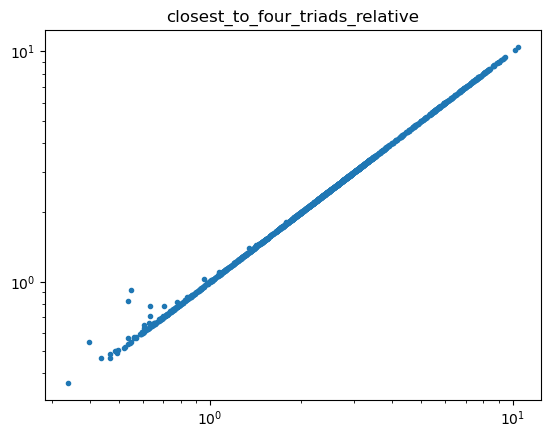

In [102]:
error_fun_name = error_functions[14].__name__
plt.loglog(df2_wrho_correct_g[error_fun_name], df2_wrho_correct_g[error_fun_name + "_mean"], '.')
plt.title(error_fun_name)

In [32]:
path = Path(outputs_wiki_rhoinits_2000, "qs_grouped_corr2.h5")
df2_wrho_correct_g.to_hdf(path, key = 'df2_wrho_correct_g')

In [33]:
path = Path(outputs_wiki_rhoinits_2000, "qs_grouped_corr2.h5")
df2_wrho_correct_g = pd.read_hdf(path, key = 'df2_wrho_correct_g')

In [35]:
kmin = 3
inds_g = []
for error_fun in error_functions:
    arr = df2_wrho_correct_g[error_fun.__name__]
    inds_p = np.argpartition(arr, kmin)[:kmin]
    inds_g.extend(inds_p)
    # print("Best for " + error_fun.__name__ + " are:")
    # for ind in inds:
    #     print(df3.iloc[ind])

df2_wrho_correct_g.iloc[inds_g]
        

q    p   ps  rho_init  repetitions   rho_lvl  \
0.925 0.1 0.7 0.0  0.925  0.1  0.7       0.0            5  0.793509   
0.750 0.2 0.9 0.4  0.750  0.2  0.9       0.4            5  0.794068   
0.825 0.2 0.8 0.2  0.825  0.2  0.8       0.2            5  0.794162   
0.875 0.7 0.6 0.0  0.875  0.7  0.6       0.0           10  0.834527   
0.750 0.3 0.9 0.4  0.750  0.3  0.9       0.4            5  0.859392   
0.775 0.8 0.6 0.0  0.775  0.8  0.6       0.0            5  0.836517   
0.825 0.9 0.8 0.0  0.825  0.9  0.8       0.0            5  0.896043   
      0.4 1.0 0.0  0.825  0.4  1.0       0.0            5  0.899281   
0.950 0.9 0.6 0.2  0.950  0.9  0.6       0.2            5  0.914463   
          0.5 0.4  0.950  0.9  0.5       0.4            5  0.856362   
0.875 1.0 0.4 0.8  0.875  1.0  0.4       0.8            5  0.880146   
0.800 0.9 0.4 0.9  0.800  0.9  0.4       0.9            1  0.884325   
0.900 0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.916989   
0.875 0.8 0.6 0.4  0.875  0.8  0.6       0.4            9  0.913110   
0.925 0.7 0.6 0.2  0.925  0.7  0.6       0.2            5  0.887701   
0.750 0.8 0.6 0.0  0.750  0.8  0.6       0.0            5  0.831777   
0.800 1.0 0.5 0.0  0.800  1.0  0.5       0.0            5  0.840489   
0.825 1.0 0.5 0.0  0.825  1.0  0.5       0.0            5  0.839106   
0.925 0.8 0.6 0.2  0.925  0.8  0.6       0.2            5  0.899715   
0.900 0.8 0.6 0.2  0.900  0.8  0.6       0.2            5  0.893451   
      0.5 0.7 0.2  0.900  0.5  0.7       0.2            5  0.895893   
      0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.916989   
0.875 0.8 0.6 0.4  0.875  0.8  0.6       0.4            9  0.913110   
0.925 0.7 0.6 0.2  0.925  0.7  0.6       0.2            5  0.887701   
              0.2  0.925  0.7  0.6       0.2            5  0.887701   
0.900 0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.916989   
0.875 0.8 0.6 0.4  0.875  0.8  0.6       0.4            9  0.913110   
0.775 0.9 0.5 0.0  0.775  0.9  0.5       0.0            5  0.806144   
0.750 0.9 0.5 0.0  0.750  0.9  0.5       0.0            5  0.807928   
0.800 0.9 0.5 0.0  0.800  0.9  0.5       0.0            5  0.804148   
0.825 1.0 0.5 0.0  0.825  1.0  0.5       0.0            5  0.839106   
0.950 0.6 0.6 0.0  0.950  0.6  0.6       0.0            5  0.855412   
0.925 0.7 0.6 0.0  0.925  0.7  0.6       0.0            5  0.858403   
0.875 0.9 0.5 0.0  0.875  0.9  0.5       0.0            5  0.795311   
0.925 0.5 0.6 0.0  0.925  0.5  0.6       0.0            5  0.798826   
0.850 0.9 0.5 0.0  0.850  0.9  0.5       0.0            5  0.797766   
0.925 1.0 0.5 0.0  0.925  1.0  0.5       0.0            5  0.828365   
0.900 1.0 0.5 0.0  0.900  1.0  0.5       0.0            5  0.833692   
0.925 0.6 0.6 0.0  0.925  0.6  0.6       0.0            5  0.836489   
0.800 1.0 0.5 0.0  0.800  1.0  0.5       0.0            5  0.840489   
0.775 0.8 0.6 0.0  0.775  0.8  0.6       0.0            5  0.836517   
0.850 1.0 0.5 0.0  0.850  1.0  0.5       0.0            5  0.838019   
0.950 0.8 0.5 0.8  0.950  0.8  0.5       0.8            5  0.881828   
      0.9 0.5 0.4  0.950  0.9  0.5       0.4            5  0.856362   
0.850 0.6 0.6 0.6  0.850  0.6  0.6       0.6            5  0.868987   

                   rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.925 0.1 0.7 0.0     0.001048              5     0.036421  0.793509  ...   
0.750 0.2 0.9 0.4     0.000700              5     0.038597  0.794068  ...   
0.825 0.2 0.8 0.2     0.001145              5     0.036872  0.794162  ...   
0.875 0.7 0.6 0.0     0.000918             10     0.055329  0.834527  ...   
0.750 0.3 0.9 0.4     0.001280              5     0.038430  0.859392  ...   
0.775 0.8 0.6 0.0     0.000742              5     0.032009  0.836517  ...   
0.825 0.9 0.8 0.0     0.000904              5     0.017105  0.896043  ...   
      0.4 1.0 0.0     0.000679              5     0.017608  0.899281  ...   
0.950 0.9 0.6 0.2     0.001547              5     0.017860  0.9

In [36]:
df2_wrho_correct_g.columns

non_nan_cols = ['rho', 'tr0', 'tr1', 'tr2', 'tr3', 'tr4',
       'tr5', 'tr6', 'tr7']

In [37]:
for ind,row in df2_wrho_correct_g.iterrows():
    if np.any(np.isnan(row[non_nan_cols].values.flatten().tolist())):
        print(ind)

(0.95, 0.1, 1.0, 0.0)
(0.95, 0.8, 0.5, 0.9)
(0.95, 1.0, 0.9, 0.0)


In [39]:
wiki

,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,T,L_plus,L,rho,Tr0,Tr1,Tr2,Tr3,Tr4,Tr5,Tr6,Tr7
wiki elections,0.012461,0.027505,0.010724,0.072158,0.049625,0.065085,0.077725,0.684716,745129.0,75446.0,94933.0,0.794729,9285.0,20495.0,7991.0,53767.0,36977.0,48497.0,57915.0,510202.0


In [38]:
"""Let us exclude rows that have nan in rho and rho in [0.65,0.92]"""
non_nan_cols = ['rho', 'tr0', 'tr1', 'tr2', 'tr3', 'tr4',
       'tr5', 'tr6', 'tr7']
kmin = 3
inds_g3 = []
for error_fun in error_functions:
    arr = [row[error_fun.__name__] if ((not np.any(np.isnan(row[non_nan_cols].values.flatten().tolist()))) & (not np.isnan(row.rho_lvl)) & (row.rho_lvl < 0.92) & (row.rho_lvl > 0.65)) else 100 for ind,row in df2_wrho_correct_g.iterrows()]
    inds_p = np.argpartition(arr, kmin)[:kmin]
    inds_g3.extend(inds_p)
    # print("Best for " + error_fun.__name__ + " are:")
    # for ind in inds:
    #     print(df3.iloc[ind])

df2_wrho_correct_g.iloc[inds_g3]
        

q    p   ps  rho_init  repetitions   rho_lvl  \
0.925 0.1 0.7 0.0  0.925  0.1  0.7       0.0            5  0.793509   
0.750 0.2 0.9 0.4  0.750  0.2  0.9       0.4            5  0.794068   
0.825 0.2 0.8 0.2  0.825  0.2  0.8       0.2            5  0.794162   
0.875 0.7 0.6 0.0  0.875  0.7  0.6       0.0           10  0.834527   
0.750 0.3 0.9 0.4  0.750  0.3  0.9       0.4            5  0.859392   
0.775 0.8 0.6 0.0  0.775  0.8  0.6       0.0            5  0.836517   
0.825 0.9 0.8 0.0  0.825  0.9  0.8       0.0            5  0.896043   
      0.4 1.0 0.0  0.825  0.4  1.0       0.0            5  0.899281   
0.950 0.9 0.6 0.2  0.950  0.9  0.6       0.2            5  0.914463   
          0.5 0.4  0.950  0.9  0.5       0.4            5  0.856362   
0.875 1.0 0.4 0.8  0.875  1.0  0.4       0.8            5  0.880146   
0.800 0.9 0.4 0.9  0.800  0.9  0.4       0.9            1  0.884325   
0.900 0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.916989   
0.925 0.7 0.6 0.2  0.925  0.7  0.6       0.2            5  0.887701   
0.875 0.8 0.6 0.4  0.875  0.8  0.6       0.4            9  0.913110   
0.750 0.8 0.6 0.0  0.750  0.8  0.6       0.0            5  0.831777   
0.800 1.0 0.5 0.0  0.800  1.0  0.5       0.0            5  0.840489   
0.825 1.0 0.5 0.0  0.825  1.0  0.5       0.0            5  0.839106   
0.925 0.8 0.6 0.2  0.925  0.8  0.6       0.2            5  0.899715   
0.900 0.8 0.6 0.2  0.900  0.8  0.6       0.2            5  0.893451   
      0.5 0.7 0.2  0.900  0.5  0.7       0.2            5  0.895893   
0.925 0.7 0.6 0.2  0.925  0.7  0.6       0.2            5  0.887701   
0.875 0.8 0.6 0.4  0.875  0.8  0.6       0.4            9  0.913110   
0.900 0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.916989   
              0.4  0.900  0.8  0.6       0.4            1  0.916989   
0.875 0.8 0.6 0.4  0.875  0.8  0.6       0.4            9  0.913110   
0.925 0.7 0.6 0.2  0.925  0.7  0.6       0.2            5  0.887701   
0.775 0.9 0.5 0.0  0.775  0.9  0.5       0.0            5  0.806144   
0.750 0.9 0.5 0.0  0.750  0.9  0.5       0.0            5  0.807928   
0.800 0.9 0.5 0.0  0.800  0.9  0.5       0.0            5  0.804148   
0.825 1.0 0.5 0.0  0.825  1.0  0.5       0.0            5  0.839106   
0.950 0.6 0.6 0.0  0.950  0.6  0.6       0.0            5  0.855412   
0.925 0.7 0.6 0.0  0.925  0.7  0.6       0.0            5  0.858403   
0.875 0.9 0.5 0.0  0.875  0.9  0.5       0.0            5  0.795311   
0.925 0.5 0.6 0.0  0.925  0.5  0.6       0.0            5  0.798826   
0.850 0.9 0.5 0.0  0.850  0.9  0.5       0.0            5  0.797766   
0.925 1.0 0.5 0.0  0.925  1.0  0.5       0.0            5  0.828365   
0.900 1.0 0.5 0.0  0.900  1.0  0.5       0.0            5  0.833692   
0.925 0.6 0.6 0.0  0.925  0.6  0.6       0.0            5  0.836489   
0.800 1.0 0.5 0.0  0.800  1.0  0.5       0.0            5  0.840489   
0.775 0.8 0.6 0.0  0.775  0.8  0.6       0.0            5  0.836517   
0.850 1.0 0.5 0.0  0.850  1.0  0.5       0.0            5  0.838019   
0.950 0.8 0.5 0.8  0.950  0.8  0.5       0.8            5  0.881828   
      0.9 0.5 0.4  0.950  0.9  0.5       0.4            5  0.856362   
0.850 0.6 0.6 0.6  0.850  0.6  0.6       0.6            5  0.868987   

                   rho_lvl_std  rho_lvl_valid  rho_sim_std  rho_lvl2  ...  \
0.925 0.1 0.7 0.0     0.001048              5     0.036421  0.793509  ...   
0.750 0.2 0.9 0.4     0.000700              5     0.038597  0.794068  ...   
0.825 0.2 0.8 0.2     0.001145              5     0.036872  0.794162  ...   
0.875 0.7 0.6 0.0     0.000918             10     0.055329  0.834527  ...   
0.750 0.3 0.9 0.4     0.001280              5     0.038430  0.859392  ...   
0.775 0.8 0.6 0.0     0.000742              5     0.032009  0.836517  ...   
0.825 0.9 0.8 0.0     0.000904              5     0.017105  0.896043  ...   
      0.4 1.0 0.0     0.000679              5     0.017608  0.899281  ...   
0.950 0.9 0.6 0.2     0.001547              5     0.017860  0.9

## Finding average best simulations

In [35]:
wiki.rho.values[0]

0.7947289140762432

In [36]:


def max_rho(real_rho, dif = 0.2, top = 0.98):
    rho = real_rho + dif
    if rho > top:
        rho = top
    return rho

def min_rho(real_rho, dif = 0.2, bot = 0.):
    rho = real_rho - dif
    if rho < bot:
        rho = bot
    return rho

In [37]:
def get_best_inds(dfs, error_functions, kmin, non_nan_cols, real_datasets_all = None, mins_rho = np.NaN, maxs_rho = np.NaN, verbose = True):
    
    if callable(mins_rho):
        mins_rho = [mins_rho(real_datasets_all[data_ind].rho.values[0]) for data_ind in range(len(dfs))]
    elif np.isnan(mins_rho):
        mins_rho = [0. for _ in range(len(dfs))]
    if callable(maxs_rho):
        maxs_rho = [maxs_rho(real_datasets_all[data_ind].rho.values[0]) for data_ind in range(len(dfs))]
    elif np.isnan(maxs_rho):
        maxs_rho = [1. for _ in range(len(dfs))]
    
    inds_smallests = []
    for data_ind, df in enumerate(dfs):
        # print(data_ind)
        inds_smallest = []
        for error_fun in error_functions:
            arr = [row[error_fun.__name__] if ((not np.any(np.isnan(row[non_nan_cols].values.flatten().tolist()))) & 
                                                (row.rho < maxs_rho[data_ind]) & (row.rho > mins_rho[data_ind])  ) else 100 
                for ind,row in df.iterrows()]
            inds_p = np.argpartition(arr, kmin)[:kmin]
            inds_smallest.extend(inds_p)
        inds_smallests.append(inds_smallest)

        if verbose:
            print(df.iloc[inds_smallest].to_markdown())
    
    return inds_smallests

def get_smallest_inds(dfs, error_functions, non_nan_cols, real_datasets_all = None, mins_rho = np.NaN, maxs_rho = np.NaN, verbose = True):
    kmin = 1
    return get_best_inds(dfs, error_functions, kmin, non_nan_cols, real_datasets_all,mins_rho, maxs_rho, verbose)

def get_closest_to_best_inds(dfs, error_functions, accepted_dif, non_nan_cols, real_datasets_all = None, mins_rho = np.NaN, maxs_rho = np.NaN, verbose = True, inds_smallests = []):
    # if np.isempty(inds_smallests):
    #     inds_smallests = get_smallest_inds(df2_rho_correct_gs, error_functions, non_nan_cols, min_rho, max_rho, verbose = False)
    
    if callable(mins_rho):
        mins_rho = [mins_rho(real_datasets_all[data_ind].rho.values[0]) for data_ind in range(len(dfs))]
    elif np.isnan(mins_rho):
        mins_rho = [0. for _ in range(len(dfs))]
    if callable(maxs_rho):
        maxs_rho = [maxs_rho(real_datasets_all[data_ind].rho.values[0]) for data_ind in range(len(dfs))]
    elif np.isnan(maxs_rho):
        maxs_rho = [1. for _ in range(len(dfs))]
    
    inds_closests = []
    inds_closests2 = []
    for data_ind, df in enumerate(dfs):
        # print(data_ind)
        inds_closest = []
        inds_closest2 = []
        for error_fun in error_functions:
            arr = [row[error_fun.__name__] if ((not np.any(np.isnan(row[non_nan_cols].values.flatten().tolist()))) & 
                                                (row.rho < maxs_rho[data_ind]) & (row.rho > mins_rho[data_ind])  ) else 100 
                for ind,row in df.iterrows()]
            
            inds_p = np.where(arr < np.min(arr) * accepted_dif)[0]

            inds_closest.extend(inds_p)
            inds_closest2.append(inds_p)
        inds_closests.append(inds_closest)
        inds_closests2.append(inds_closest2)

        if verbose:
            print(list(map(len, inds_closest2)))
            print(df.iloc[inds_closest].to_markdown())
            # print(df2_rho_correct_gs[data_ind].iloc[np.where(inds)[0]].to_markdown())
    
    return inds_closests, inds_closests2

def get_closest_to_best_inds2(dfs, error_functions, k, non_nan_cols, real_datasets_all = None, mins_rho = np.NaN, 
                              maxs_rho = np.NaN, verbose = True, inds_smallests = [], error_mean_ensemble = True):
    """Difference with the above is such that closest is defined using std of error function. 

    Args:
        dfs (_type_): _description_
        error_functions (_type_): _description_
        k (_type_): number of standard deviations
        non_nan_cols (_type_): _description_
        real_datasets_all (_type_, optional): _description_. Defaults to None.
        mins_rho (_type_, optional): _description_. Defaults to np.NaN.
        maxs_rho (_type_, optional): _description_. Defaults to np.NaN.
        verbose (bool, optional): _description_. Defaults to True.
        inds_smallests (list, optional): _description_. Defaults to [].
        error_mean_ensemble (bool, optional): if True error_fun.__name__ rows are used. 
            If False, error_fun.__name__ + "_mean" are used. 

    Returns:
        _type_: _description_
    """
    # if np.isempty(inds_smallests):
    #     inds_smallests = get_smallest_inds(df2_rho_correct_gs, error_functions, non_nan_cols, min_rho, max_rho, verbose = False)
    
    if callable(mins_rho):
        mins_rho = [mins_rho(real_datasets_all[data_ind].rho.values[0]) for data_ind in range(len(dfs))]
    elif np.isnan(mins_rho):
        mins_rho = [0. for _ in range(len(dfs))]
    if callable(maxs_rho):
        maxs_rho = [maxs_rho(real_datasets_all[data_ind].rho.values[0]) for data_ind in range(len(dfs))]
    elif np.isnan(maxs_rho):
        maxs_rho = [1. for _ in range(len(dfs))]
    
    inds_closests = []
    inds_closests2 = []
    for data_ind, df in enumerate(dfs):
        # print(data_ind)
        inds_closest = []
        inds_closest2 = []
        for error_fun in error_functions:
            colname = error_fun.__name__ if error_mean_ensemble else error_fun.__name__ + "_mean"
            arr = [row[colname] if ((not np.any(np.isnan(row[non_nan_cols].values.flatten().tolist()))) & 
                                                (row.rho < maxs_rho[data_ind]) & (row.rho > mins_rho[data_ind])  ) else 100 
                for ind,row in df.iterrows()]
            
            inds_min = np.where(arr == np.min(arr))[0]
            val = df.iloc[inds_min][colname].values
            val_std = df.iloc[inds_min][error_fun.__name__ + "_std"].values
            
            # print(arr)
            # print(val + k*val_std)
            inds_p = np.where(arr < val + k*val_std)[0]

            inds_closest.extend(inds_p)
            inds_closest2.append(inds_p)
        inds_closests.append(inds_closest)
        inds_closests2.append(inds_closest2)

        if verbose:
            print(list(map(len, inds_closest2)))
            print(df.iloc[inds_closest].to_markdown())
            # print(df2_rho_correct_gs[data_ind].iloc[np.where(inds)[0]].to_markdown())
    
    return inds_closests, inds_closests2

In [38]:
error_functions[6], error_functions[13]

(<function __main__.closest_to_six_triads_transformed(original_data, model_data, is_data_transformed=False)>,
 <function __main__.closest_to_six_triads_relative(original_data, model_data)>)

In [39]:
non_nan_cols = ['rho']

inds_closests10, inds_closests10_2 = get_closest_to_best_inds([df2_wrho_correct_g], [error_functions[6], error_functions[13]], 1.5, non_nan_cols, [wiki,], lambda x: min_rho(x, 0.1), lambda x: max_rho(x, 0.1), verbose = True)



[17, 161]
|                        |     q |   p |   ps |   rho_init |   repetitions |   rho_lvl |   rho_lvl_std |   rho_lvl_valid |   rho_sim_std |   rho_lvl2 |   rho_lvl2_std |   rho_lvl2_valid |   rho_sim_std2 |   rho_lvl3 |   rho_lvl3_std |   rho_lvl3_valid |   rho_sim_std3 |   rho_lvl_exp |   rho_lvl4 |   rho_lvl4_std |   rho_lvl4_valid |   rho_sim_std4 |     tr0_lvl |   tr0_lvl_std |   tr0_sim_std |    tr1_lvl |   tr1_lvl_std |   tr1_sim_std |    tr2_lvl |   tr2_lvl_std |   tr2_sim_std |   tr3_lvl |   tr3_lvl_std |   tr3_sim_std |    tr4_lvl |   tr4_lvl_std |   tr4_sim_std |   tr5_lvl |   tr5_lvl_std |   tr5_sim_std |   tr6_lvl |   tr6_lvl_std |   tr6_sim_std |   tr7_lvl |   tr7_lvl_std |   tr7_sim_std |    tr0_lvl3 |   tr0_lvl3_std |   tr0_sim_std3 |   tr1_lvl3 |   tr1_lvl3_std |   tr1_sim_std3 |   tr2_lvl3 |   tr2_lvl3_std |   tr2_sim_std3 |   tr3_lvl3 |   tr3_lvl3_std |   tr3_sim_std3 |   tr4_lvl3 |   tr4_lvl3_std |   tr4_sim_std3 |   tr5_lvl3 |   tr5_lvl3_std |   tr5_sim_std3

In [125]:
get_smallest_inds([df2_wrho_correct_g], [error_functions[6], error_functions[13]], non_nan_cols, [wiki,], lambda x: min_rho(x, 0.1), lambda x: max_rho(x, 0.1), verbose = True)

|                      |   q |   p |   ps |   rho_init |   repetitions |   rho_lvl |   rho_lvl_std |   rho_lvl_valid |   rho_sim_std |   rho_lvl2 |   rho_lvl2_std |   rho_lvl2_valid |   rho_sim_std2 |   rho_lvl3 |   rho_lvl3_std |   rho_lvl3_valid |   rho_sim_std3 |   rho_lvl_exp |   rho_lvl4 |   rho_lvl4_std |   rho_lvl4_valid |   rho_sim_std4 |    tr0_lvl |   tr0_lvl_std |   tr0_sim_std |    tr1_lvl |   tr1_lvl_std |   tr1_sim_std |    tr2_lvl |   tr2_lvl_std |   tr2_sim_std |   tr3_lvl |   tr3_lvl_std |   tr3_sim_std |   tr4_lvl |   tr4_lvl_std |   tr4_sim_std |   tr5_lvl |   tr5_lvl_std |   tr5_sim_std |   tr6_lvl |   tr6_lvl_std |   tr6_sim_std |   tr7_lvl |   tr7_lvl_std |   tr7_sim_std |   tr0_lvl3 |   tr0_lvl3_std |   tr0_sim_std3 |   tr1_lvl3 |   tr1_lvl3_std |   tr1_sim_std3 |   tr2_lvl3 |   tr2_lvl3_std |   tr2_sim_std3 |   tr3_lvl3 |   tr3_lvl3_std |   tr3_sim_std3 |   tr4_lvl3 |   tr4_lvl3_std |   tr4_sim_std3 |   tr5_lvl3 |   tr5_lvl3_std |   tr5_sim_std3 |   tr6_lvl3 |  

[[1053, 483]]

In [40]:
inds_closests10, inds_closests10_2 = get_closest_to_best_inds2([df2_wrho_correct_g], [error_functions[6], error_functions[13]], 2, non_nan_cols, [wiki,], lambda x: min_rho(x, 0.1), lambda x: max_rho(x, 0.1), verbose = True, error_mean_ensemble=False)


[1, 4]
|                        |     q |   p |   ps |   rho_init |   repetitions |   rho_lvl |   rho_lvl_std |   rho_lvl_valid |   rho_sim_std |   rho_lvl2 |   rho_lvl2_std |   rho_lvl2_valid |   rho_sim_std2 |   rho_lvl3 |   rho_lvl3_std |   rho_lvl3_valid |   rho_sim_std3 |   rho_lvl_exp |   rho_lvl4 |   rho_lvl4_std |   rho_lvl4_valid |   rho_sim_std4 |    tr0_lvl |   tr0_lvl_std |   tr0_sim_std |    tr1_lvl |   tr1_lvl_std |   tr1_sim_std |    tr2_lvl |   tr2_lvl_std |   tr2_sim_std |   tr3_lvl |   tr3_lvl_std |   tr3_sim_std |   tr4_lvl |   tr4_lvl_std |   tr4_sim_std |   tr5_lvl |   tr5_lvl_std |   tr5_sim_std |   tr6_lvl |   tr6_lvl_std |   tr6_sim_std |   tr7_lvl |   tr7_lvl_std |   tr7_sim_std |   tr0_lvl3 |   tr0_lvl3_std |   tr0_sim_std3 |   tr1_lvl3 |   tr1_lvl3_std |   tr1_sim_std3 |   tr2_lvl3 |   tr2_lvl3_std |   tr2_sim_std3 |   tr3_lvl3 |   tr3_lvl3_std |   tr3_sim_std3 |   tr4_lvl3 |   tr4_lvl3_std |   tr4_sim_std3 |   tr5_lvl3 |   tr5_lvl3_std |   tr5_sim_std3 |   t

In [37]:
df2_wrho_correct_g.iloc[inds_closests10_2[0][0]][[error_functions[6].__name__, error_functions[6].__name__ + "_mean", error_functions[6].__name__ + "_std", error_functions[6].__name__ + "_max"]]
# [inds_closests10_2[0][0]]

,,,,closest_to_six_triads_transformed,closest_to_six_triads_transformed_mean,closest_to_six_triads_transformed_std,closest_to_six_triads_transformed_max
0.9,0.8,0.6,0.2,0.0087,0.008871,0.000461,0.009446


In [41]:
def add_method_err(err, met_err):
    return np.sqrt(err**2 / 3 + met_err**2)

def ave_std(series):
    """When we have a series of std. And for another series we take the mean, 
    then we would like to know what is the std dev of the new result. 
    And std dev will include std devs of partial results. This
    function will calculate this. 

    Args:
        series (_type_): _description_
    """
    return np.sqrt(np.sum(series ** 2)) / len(series)

def average_best_results(df2, inds_closest10, dataname, q_grid = 0.025, p_grid = 0.5, ps_grid = 0.5, which_rho = 4):
   columns = ['q', 'p', 'ps', 'rho',
       'tr0', 'tr1', 'tr2', 'tr3', 'tr4', 'tr5', 'tr6', 'tr7',]

   df_temp = df2.iloc[inds_closest10]
   df_temp_mean = df_temp.aggregate(['mean'])[columns]
   df_temp_mean["school"] = dataname
   df_temp_mean.set_index("school", inplace = True, drop=True)
   
#    df_temp_mean.columns = [col + "_mean" for col in df_temp_mean]

   df_temp_std = df_temp.aggregate(['std'])[columns]
   df_temp_std["school"] = dataname
   df_temp_std.set_index("school", inplace = True, drop=True)

   df_temp_std.columns = [col + "_std" for col in df_temp_std]
   
   part_cols = [col + "_sim_std" + str(which_rho) for col in columns[3:]]
   df_temp_std_partials = df_temp.aggregate([ave_std])[part_cols]

   # print(df_temp_std.q_std)
   df_temp_std.q_std = add_method_err(q_grid / 2, df_temp_std.q_std) if not any(np.isnan(df_temp_std.q_std) ) else add_method_err(q_grid / 2, 0)
   df_temp_std.p_std = add_method_err(p_grid / 2, df_temp_std.p_std) if not any(np.isnan(df_temp_std.p_std) ) else add_method_err(p_grid / 2, 0)
   df_temp_std.ps_std = add_method_err(ps_grid / 2, df_temp_std.ps_std) if not any(np.isnan(df_temp_std.ps_std) ) else add_method_err(ps_grid / 2, 0)
   
   for col, pcol in zip(columns[3:], part_cols):
       df_temp_std[col + "_std"] = df_temp_std_partials[pcol].values
    

   df_temp_sum = df_temp.aggregate(['sum'])[['repetitions']]
   df_temp_sum["school"] = dataname
   df_temp_sum.set_index("school", inplace = True, drop=True)

   return pd.concat([df_temp_mean, df_temp_std, df_temp_sum], axis = 1)
      

In [42]:
ave_best = average_best_results(df2_wrho_correct_g, inds_closests10_2[0][0], "WikiElections", q_grid = 0.025, p_grid = 0.1, ps_grid = 0.1, which_rho = 3)
print(ave_best[["q_std", "p_std", "ps_std"]])
ave_best

                  q_std     p_std    ps_std
school                                     
WikiElections  0.007217  0.028868  0.028868


,q,p,ps,rho,tr0,tr1,tr2,tr3,tr4,tr5,...,rho_std,tr0_std,tr1_std,tr2_std,tr3_std,tr4_std,tr5_std,tr6_std,tr7_std,repetitions
school,,,,,,,,,,,,,,,,,,,,,
WikiElections,0.9,0.8,0.6,0.894264,0.001283,0.005689,0.0039,0.05068,0.011534,0.037577,...,0.003548,0.000213,0.000863,0.000625,0.00548,0.000739,0.002952,0.003898,0.012294,5


In [43]:
path = Path(outputs_wiki_rhoinits_2000, "ave_best.df5")
ave_best.to_hdf(path, key = "ave_best")

# Plots

In [40]:


n1_triads = ['tr3', 'tr5', 'tr6']
n1_nonhierarchical = 'tr5'
n2_triads = ['tr1', 'tr2', 'tr4']
n2_nonhierarchical = 'tr2'

triad_names_map={
    'tr7': 'BH0',
    'tr4': 'BH1',
    'tr1': 'BH2',
    'tr2': 'BN1',
    'tr0': 'UH2',
    'tr3': 'UH1',
    'tr5': 'UN1',
    'tr6': 'UH0',
}
triad_names_map.update({value: key for key, value in triad_names_map.items()})


### Heatmaps

In [52]:
df2_wrho_correct_g

q    p   ps  rho_init  repetitions   rho_lvl  \
0.75 0.0 0.9 0.2  0.75  0.0  0.9       0.2            5  0.671249   
             0.4  0.75  0.0  0.9       0.4            5  0.678054   
             0.6  0.75  0.0  0.9       0.6            5  0.685312   
             0.8  0.75  0.0  0.9       0.8            5  0.690937   
             0.9  0.75  0.0  0.9       0.9            5  0.694057   
...                ...  ...  ...       ...          ...       ...   
0.95 1.0 0.6 0.0  0.95  1.0  0.6       0.0            5  0.886219   
         0.7 0.0  0.95  1.0  0.7       0.0            5  0.894946   
         0.8 0.0  0.95  1.0  0.8       0.0            5  0.894108   
         0.9 0.0  0.95  1.0  0.9       0.0            5  0.889293   
         1.0 0.0  0.95  1.0  1.0       0.0            5  0.887526   

                  rho_lvl_std  rho_lvl_valid  rho_lvl2  rho_lvl2_std  ...  \
0.75 0.0 0.9 0.2     0.000514              5       NaN           NaN  ...   
             0.4     0.000382              5       NaN           NaN  ...   
             0.6     0.000821              5       NaN           NaN  ...   
             0.8     0.000562              5       NaN           NaN  ...   
             0.9     0.000787              5       NaN           NaN  ...   
...                       ...            ...       ...           ...  ...   
0.95 1.0 0.6 0.0     0.002472              5  0.886219      0.002472  ...   
         0.7 0.0     0.001542              5  0.894946      0.001542  ...   
         0.8 0.0     0.004145              5  0.894108      0.004145  ...   
         0.9 0.0     0.002409              5  0.889293      0.002409  ...   
         1.0 0.0     0.002594              5  0.887526      0.002594  ...   

                  closest_to_six_triads  closest_to_six_triads_transformed  \
0.75 0.0 0.9 0.2               0.018584                           0.086314   
             0.4               0.018380                           0.090184   
             0.6               0.018159                           0.093991   
             0.8               0.017998                           0.096328   
             0.9               0.017939                           0.097872   
...                                 ...                                ...   
0.95 1.0 0.6 0.0               0.005867                           0.081624   
         0.7 0.0               0.008302                           0.221381   
         0.8 0.0               0.010855                           0.363264   
         0.9 0.0               0.011189                           0.497248   
         1.0 0.0               0.012195                           0.541408   

                  closest_to_six_triads_corrdevs_transformed  \
0.75 0.0 0.9 0.2                                    1.036417   
             0.4                                    1.036989   
             0.6                                    1.037419   
             0.8                                    1.037343   
             0.9                                    1.037400   
...                                                      ...   
0.95 1.0 0.6 0.0                                    1.041780   
         0.7 0.0                                    1.211767   
         0.8 0.0                                    1.183524   
         0.9 0.0                                    1.450707   
         1.0 0.0                                    1.298750   

                  closest_to_four_triads_corrdevs_transformed  \
0.75 0.0 0.9 0.2                                     1.036417   
             0.4                                     1.036989   
             0.6                                     1.037419   
             0.8                                     1.037343   
             0.9                                     1.037400   
...                                                       ...   
0.95 1.0 0.6 0.0                                     0.041780   
         0.7 0.0                         

In [53]:
np.unique(get_index_row(df2_wrho_correct_g, 3))

NameError: name 'get_index_row' is not defined

In [54]:
np.unique(df_wrho.p)

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

In [55]:
df2_wrho_correct_g_minerrs = df2_wrho_correct_g.groupby(by=["q", "p", "ps"]).min()

In [57]:
def get_index_row(df, which):
    return [ind[which] for ind in df.index]

qs = np.unique(get_index_row(df2_wrho_correct_g_minerrs, 0))
# qs = np.unique(get_index_row(df2_joined_correct_g, 3))

i = 2


q = qs[i]
print(q)

inds2 = np.abs(get_index_row(df2_wrho_correct_g_minerrs, 0) - q) < 1e-5
df2_wrho_correct_g_minerrs[inds2]

df_temp = df2_wrho_correct_g_minerrs[inds2].copy(deep=True)
if q == 0:
    
    ps_true = np.unique(df_temp.ps)
    
    for ps in np.arange(0,1.1,0.1):
        ps = round(ps, 2)
        if ps == ps_true:
            continue
        # df_temp = df_temp.append(df2_w1000_g[inds2])
        # for i in range(len(df2_w1000_g[inds2])):
        #     df_temp['ps'][-i-1] = ps
        for ind, row in df2_wrho_correct_g_minerrs[inds2].iterrows():
            new_ind = (ind[0], ind[1], ps)
            row.ps = ps
            # df_temp[new_ind] = row
            df_temp = df_temp.append(row, ignore_index = True)
            # print(ps)
elif q == 1.:
    
    ph_true = np.unique(df_temp.p)
    
    for ph in np.arange(0,1.1,0.1):
        ph = round(ph, 2)
        if ph == ph_true:
            continue
        # df_temp = df_temp.append(df2_w1000_g[inds2])
        # for i in range(len(df2_w1000_g[inds2])):
        #     df_temp['ps'][-i-1] = ps
        for ind, row in df2_wrho_correct_g_minerrs[inds2].iterrows():
            new_ind = (ind[0], ps, ind[2])
            row.p = ph
            # df_temp[new_ind] = row
            df_temp = df_temp.append(row, ignore_index = True)
            # print(ps)

df_temp

pv = pd.pivot_table(df_temp, values = "closest_to_rho", index = "ps", columns = "p")
pv
# pv = pd.pivot_table(df2_w1000_g[inds2], values = "closest_to_rho", index = "ps", columns = "p")
# pv
# pv["0.6"] = pv["0.5"]
# pv



0.8


p,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0
ps,,,,,,,,,,,
0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001513
0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000818,0.000090
0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001476,0.000144,0.000122,0.002196
0.6,NaN,NaN,NaN,NaN,NaN,0.002387,0.000067,0.000064,0.002235,0.004461,0.006217
0.7,NaN,NaN,0.016322,0.002611,0.000031,0.000009,0.002141,0.004815,0.006655,0.008011,0.008941
0.8,0.013601,0.003018,0.000053,0.000017,0.001716,0.004916,0.006994,0.008342,0.009440,0.010098,0.010522
0.9,0.000092,0.000013,0.001094,0.004341,0.007113,0.008854,0.009934,0.010574,0.011095,0.011211,0.011556
1.0,0.000265,0.003083,0.006724,0.009025,0.010279,0.011057,0.011464,0.011738,0.012031,0.012003,0.011872


/tmp/ipykernel_69815/1355872723.py:44: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


Text(0, 0.5, '$\\sin (\\theta)$')

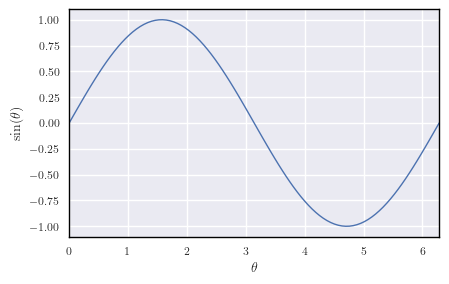

In [58]:
def set_size(width, fraction=1, subplots=(1, 1)):
    """Set figure dimensions to avoid scaling in LaTeX.

    Parameters
    ----------
    width: float or string
            Document width in points, or string of predined document type
    fraction: float, optional
            Fraction of the width which you wish the figure to occupy
    subplots: array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim: tuple
            Dimensions of figure in inches
    """
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    else:
        width_pt = width

    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    # https://disq.us/p/2940ij3
    golden_ratio = (5**.5 - 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])

    return (fig_width_in, fig_height_in)

import numpy as np
import matplotlib.pyplot as plt

# Using seaborn's style
plt.style.use('seaborn')
width = 345
# width = 1000

tex_fonts = {
    # Use LaTeX to write all text
    "text.usetex": True,
    "font.family": "serif",
    # Use 10pt font in plots, to match 10pt font in document
    "axes.labelsize": 10,
    "font.size": 10,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8
}

plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams.update(tex_fonts)
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 4

x = np.linspace(0, 2*np.pi, 100)
# Initialise figure instance
fig, ax = plt.subplots(1, 1, figsize=set_size(width))
# Plot
ax.plot(x, np.sin(x))
ax.set_xlim(0, 2 * np.pi)
ax.set_xlabel(r'$\theta$')
ax.set_ylabel(r'$\sin (\theta)$')



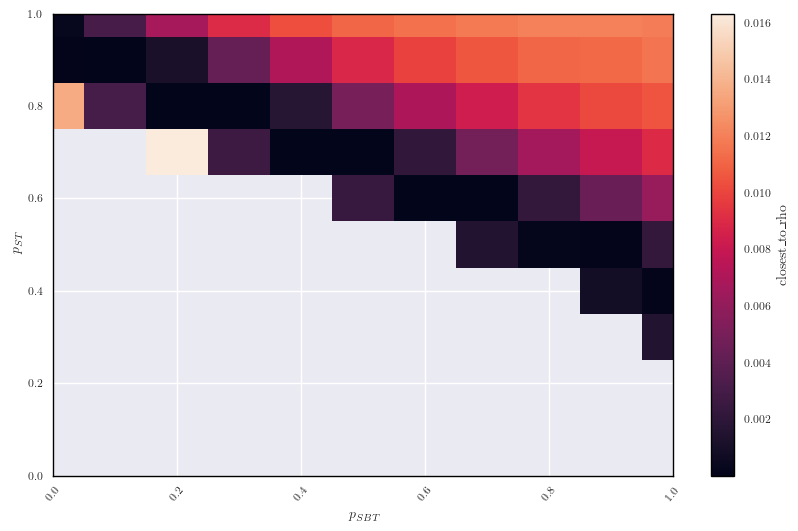

In [59]:
fig, ax = plt.subplots(figsize=(10, 6))

colormesh = ax.pcolormesh(pv.columns, pv.index, pv, cmap=sns.color_palette("rocket", as_cmap=True))

ax.tick_params(axis='x', which='major', rotation=50)
# ax.set_xticks(pv.columns)
# ax.set_yticks(pv.index)

ax.set_xlim([0, 1])
ax.set_ylim([0, 1])

cbar = fig.colorbar(colormesh,ax = ax)

# ax.plot(pbs, rho_crits, color='black')

ax.set_xlabel(r'$p_{SBT}$')
ax.set_ylabel(r'$p_{ST}$')
# ax.set_xlabel('p_SB')

cbar.set_label("closest_to_rho")

Text(0.5, 0.98, ' closest_to_rho ')

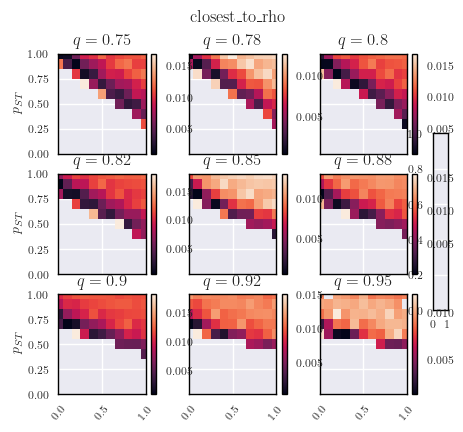

In [64]:

save_ = False

figsize = set_size(width)
figsize = (figsize[0], figsize[1]*1.5)

fig, axs = plt.subplots(3, 3, figsize=figsize, sharey=True, sharex = True)

cbar_ax = fig.add_axes([.91, .3, .03, .4])

qs = np.unique(get_index_row(df2_wrho_correct_g, 0))

minval = df2_wrho_correct_g.describe().closest_to_rho["min"]
maxval = df2_wrho_correct_g.describe().closest_to_rho["max"]

for i, (ax, q) in enumerate(zip(axs.flat, qs)):
    # if i == 11:
    #     continue
    inds2 = np.abs(get_index_row(df2_wrho_correct_g, 0) - q) < 1e-5
    
    df_temp = df2_wrho_correct_g[inds2].copy(deep=True)
    if q == 0:
        
        ps_true = np.unique(df_temp.ps)
        
        for ps in np.arange(0,1.1,0.1):
            ps = round(ps, 2)
            if ps == ps_true:
                continue
            # df_temp = df_temp.append(df2_w1000_g[inds2])
            # for i in range(len(df2_w1000_g[inds2])):
            #     df_temp['ps'][-i-1] = ps
            for ind, row in df2_wrho_correct_g[inds2].iterrows():
                new_ind = (ind[0], ind[1], ps)
                row.ps = ps
                # df_temp[new_ind] = row
                df_temp = df_temp.append(row, ignore_index = True)
                # print(ps)
    elif q == 1.:
        
        ph_true = np.unique(df_temp.p)
        
        for ph in np.arange(0,1.1,0.1):
            ph = round(ph, 2)
            if ph == ph_true:
                continue
            # df_temp = df_temp.append(df2_w1000_g[inds2])
            # for i in range(len(df2_w1000_g[inds2])):
            #     df_temp['ps'][-i-1] = ps
            for ind, row in df2_wrho_correct_g[inds2].iterrows():
                new_ind = (ind[0], ps, ind[2])
                row.p = ph
                # df_temp[new_ind] = row
                df_temp = df_temp.append(row, ignore_index = True)
                # print(ps)

    # df_temp
    
    pv = pd.pivot_table(df_temp, values = "closest_to_rho", index = "ps", columns = "p")
    # print(pv)
    colormesh = ax.pcolormesh(pv.columns, pv.index, pv, cmap=sns.color_palette("rocket", as_cmap=True))

    ax.tick_params(axis='x', which='major', rotation=50)
    # ax.set_xticks(pv.columns)
    # ax.set_yticks(pv.index)
    
    ax.set_xlim([0,1])
    ax.set_ylim([0,1])

    cbar = fig.colorbar(colormesh,ax = ax)

    # ax.set_xlabel(r'$p_{SBT}$')
    # ax.set_ylabel(r'$p_{ST}$')
    # # ax.set_xlabel('p_SB')

    # cbar.set_label("closest_to_rho")

    ax.set_title(r'$q={q}$'.format(q=round(q, 2)))
    
    # fmt = '{:0.1f}'
    # xticklabels = []
    # for item in ax.get_xticklabels():
    #     item.set_text(fmt.format(float(item.get_text())))
    #     xticklabels += [item]
        
    # if len(ax.get_yticklabels()) > 0:
    #     # print(q)
    #     yticklabels = []
        
    #     for item in ax.get_yticklabels():
    #         item.set_text(fmt.format(float(item.get_text())))
    #         yticklabels += [item]
    # else:
    #     yticklabels2 = []
    #     for item in yticklabels:
    #         item.set_text(fmt.format(float(item.get_text())))
    #         yticklabels2 += [item]
    #     ax.set_yticklabels(yticklabels2)
    
    
    if i%3 == 0:
        # print(yticklabels)
        # ax.set_yticklabels(yticklabels)
        # print(ax.get_yticklabels())
        ax.set_ylabel(r'$p_{ST}$')
    else:
        # print(ax.get_yticklabels())
        ax.set_ylabel('')
        ax.tick_params(left=False)
        # print(yticklabels)
    if i == 10:
        ax.set_xlabel(r'$p_{SBT}$')
    else:
        ax.set_xlabel('')
    if i < 9:
        ax.tick_params(bottom=False)
    # else:
        # ax.set_xticklabels(xticklabels)
    # else: break

# axs.fla

fig.suptitle(' closest_to_rho ')

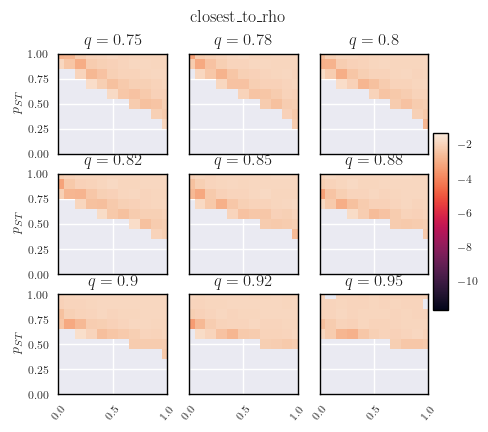

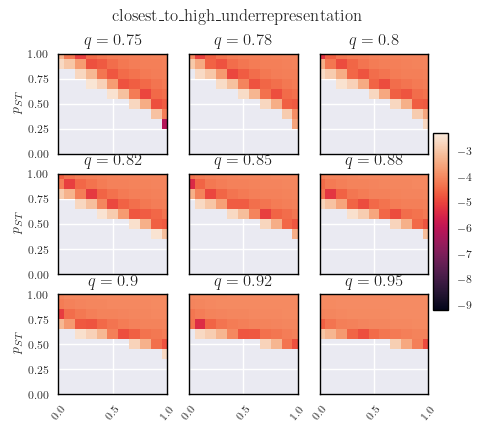

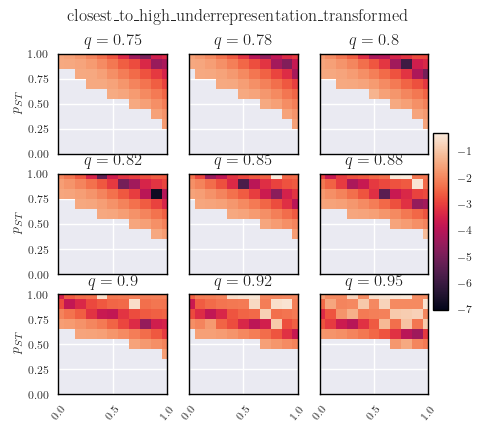

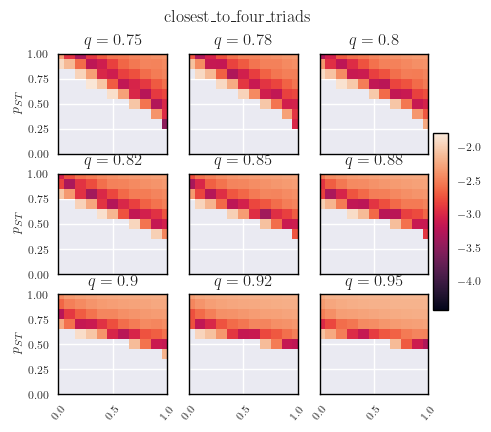

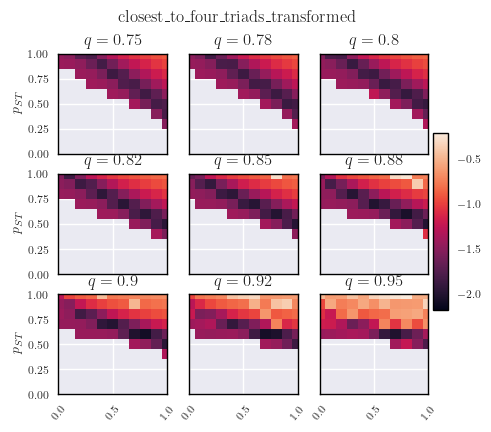

...

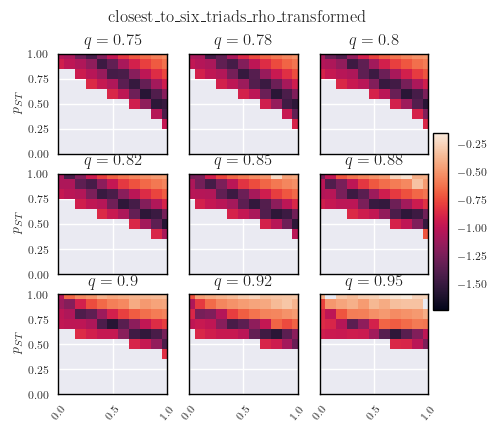

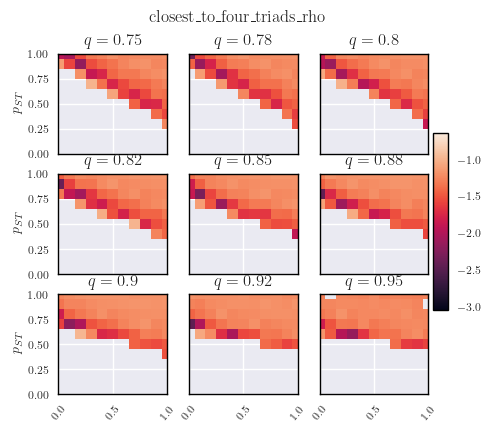

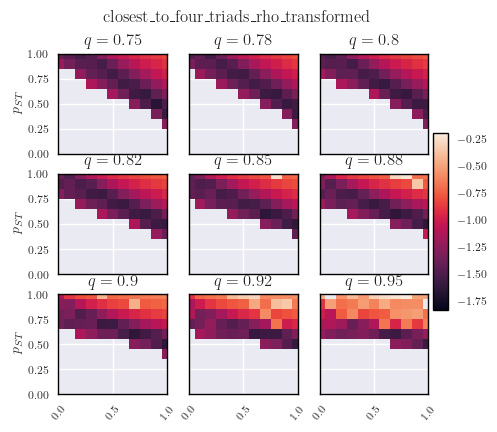

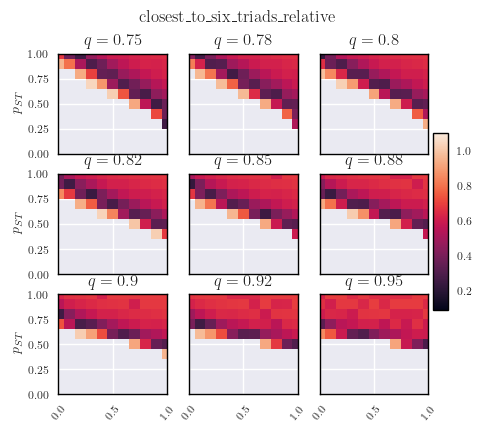

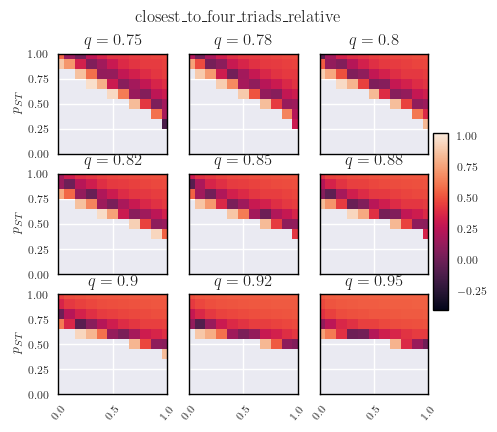

In [65]:

save_ = False
log = True

for error_fun in error_functions:
    error_fun_name = error_fun.__name__

    figsize = set_size(width)
    figsize = (figsize[0], figsize[1]*1.5)

    fig, axs = plt.subplots(3, 3, figsize=figsize, sharey=True, sharex = True)

    cbar_ax = fig.add_axes([.91, .3, .03, .4])

    qs = np.unique(get_index_row(df2_wrho_correct_g, 0))

    minval = df2_wrho_correct_g.describe()[error_fun_name]["min"]
    maxval = df2_wrho_correct_g.describe()[error_fun_name]["max"]
    if log:
        minval = np.log10(minval)
        maxval = np.log10(maxval)
    
    for i, (ax, q) in enumerate(zip(axs.flat, qs)):
        # if i == 11:
        #     continue

        inds2 = np.abs(get_index_row(df2_wrho_correct_g, 0) - q) < 1e-5
    
        df_temp = df2_wrho_correct_g[inds2].copy(deep=True)
        if q == 0:
            
            ps_true = np.unique(df_temp.ps)
            
            for ps in np.arange(0,1.1,0.1):
                ps = round(ps, 2)
                if ps == ps_true:
                    continue
                # df_temp = df_temp.append(df2_w1000_g[inds2])
                # for i in range(len(df2_w1000_g[inds2])):
                #     df_temp['ps'][-i-1] = ps
                for ind, row in df2_wrho_correct_g[inds2].iterrows():
                    new_ind = (ind[0], ind[1], ps)
                    row.ps = ps
                    # df_temp[new_ind] = row
                    df_temp = df_temp.append(row, ignore_index = True)
                    # print(ps)
        elif q == 1.:
            
            ph_true = np.unique(df_temp.p)
            
            for ph in np.arange(0,1.1,0.1):
                ph = round(ph, 2)
                if ph == ph_true:
                    continue
                # df_temp = df_temp.append(df2_w1000_g[inds2])
                # for i in range(len(df2_w1000_g[inds2])):
                #     df_temp['ps'][-i-1] = ps
                for ind, row in df2_wrho_correct_g[inds2].iterrows():
                    new_ind = (ind[0], ps, ind[2])
                    row.p = ph
                    # df_temp[new_ind] = row
                    df_temp = df_temp.append(row, ignore_index = True)
                    # print(ps)

        # df_temp
        
        pv = pd.pivot_table(df_temp, values = error_fun_name, index = "ps", columns = "p")
        if log == True:
            pv = np.log10(pv)
        colormesh = ax.pcolormesh(pv.columns, pv.index, pv, cmap=sns.color_palette("rocket", as_cmap=True),
                                  vmin = minval, vmax = maxval)

        ax.tick_params(axis='x', which='major', rotation=50)
        # ax.set_xticks(pv.columns)
        # ax.set_yticks(pv.index)
        
        ax.set_xlim([0,1])
        ax.set_ylim([0,1])

        if i == 0:
            cbar = fig.colorbar(colormesh,cax = cbar_ax)#, fraction=0.046, pad=0.04)#,vmin = minval, vmax = maxval)
        
        
        # sns.heatmap(pv, square = True, ax = ax, cbar_ax = cbar_ax, cbar = i == 0, vmin = minval, vmax = maxval)
        
        ax.set_title(r'$q={q}$'.format(q=round(q, 2)))
        
        # fmt = '{:0.1f}'
        # xticklabels = []
        # for item in ax.get_xticklabels():
        #     item.set_text(fmt.format(float(item.get_text())))
        #     xticklabels += [item]
            
        # if len(ax.get_yticklabels()) > 0:
        #     # print(q)
        #     yticklabels = []
            
        #     for item in ax.get_yticklabels():
        #         item.set_text(fmt.format(float(item.get_text())))
        #         yticklabels += [item]
        # else:
        #     yticklabels2 = []
        #     for item in yticklabels:
        #         item.set_text(fmt.format(float(item.get_text())))
        #         yticklabels2 += [item]
        #     ax.set_yticklabels(yticklabels2)
        
        if i%3 == 0:
            # print(yticklabels)
            # ax.set_yticklabels(yticklabels)
            # print(ax.get_yticklabels())
            ax.set_ylabel(r'$p_{ST}$')
        else:
            # print(ax.get_yticklabels())
            ax.set_ylabel('')
            ax.tick_params(left=False)
            # print(yticklabels)
        if i == 10:
            ax.set_xlabel(r'$p_{SBT}$')
        else:
            ax.set_xlabel('')
        if i < 9:
            ax.tick_params(bottom=False)
        # else:
            # ax.set_xticklabels(xticklabels)
    
    fig.suptitle(error_fun_name)
    
    if save_:
        fname = "maps/map_long2_" + error_fun_name
        # fname = fname + filename_addon
        if log:
            fname = fname + "_log"
        fname = fname + ".pdf"
        
        fig.savefig(fname, format='pdf', bbox_inches='tight') 

## Barplots

In [41]:
real_net_additional_label_data = 0.32432
label = "wiki"
label += r": $\rho={rho}$".format(rho = round(real_net_additional_label_data, 2))
label

'wiki: $\\rho=0.32$'

In [42]:

def plot_bar_nets(ax, ydata, yerr, triads_set, title, labels, 
                  line_level = 1/3, linewidth = 2, colors=None, 
                  width = 0.15, smallest_edge = False, m = 1,
                  legend_elem = 3, real_net_data = None, additional_label_data = None, real_net_additional_label_data = None):
    n_simulated = ydata.copy()
    if yerr is not None:
        n_err = yerr.copy()
    else:
        n_err = None   
    if real_net_data is not None:
        data_name = real_net_data.columns[0]
        real_data = [val[0] for val in real_net_data.values]
        n_simulated[data_name] = real_data
        if yerr is not None:
            real_data_std = np.full(len(n_simulated.index), np.nan)
            n_err[data_name] = real_data_std
#     width = 0.15
    multiplier = 0
    x = np.arange(len(n_simulated.index))*3-1.5
    for i, col in enumerate(n_simulated.columns):
        offset = multiplier*width*4
        if labels is not None:
            label = labels[i]
        else:
            # label = col
            # print(col)
            if len(col) == 3:
                q, p, ps = col
            elif len(col) == 4:
                _, q, p, ps = col
            elif len(col) == 5:
                _, q, p, ps, step = col
            # elif len(col) == 1:
            #     if real_net_data is not None:
            #     else:
            #         raise ValueError("column contains array with only one value")
            else:
                q, p, ps = col[:3]
            if (i + 1 == len(n_simulated.columns)) and (real_net_data is not None):
                label = col[0]
                if real_net_additional_label_data is not None:
                    # print(real_net_additional_label_data)
                    label += r": $\rho={rho}$".format(rho = round(real_net_additional_label_data, 2))
            elif legend_elem == 3:
                label = r"$q={q},p_{{SBT}}={p},p_{{ST}}={ps}$".format(q=round(q,2),p=round(p,2),ps=round(ps,2))
                if additional_label_data is not None:
                    label += r"$,\rho={rho}$".format(rho = round(additional_label_data[i], 2))
            elif legend_elem == 4:
                rho_init = col[3]
                label = r"$q={q},p_{{SBT}}={p},p_{{ST}}={ps},\rho_{{0}}={rho_init}$".format(q=round(q,2),p=round(p,2),ps=round(ps,2), rho_init=round(rho_init,2))
                if additional_label_data is not None:
                    label += r"$,\rho={rho}$".format(rho = round(additional_label_data[i], 2))
            # print(lab)
        if n_err is not None:
            # print(n_err)
            # print(n_err[i])
            err = n_err[col[:4]]
            if np.any(np.isnan(err)):
                err = None
        else:
            err = None
        
        # print("H")
        if smallest_edge:
            edgecolor = [colors[i] if val else 'none' for ind, val in enumerate(n_simulated[col] < 0.01)]
        else:
            edgecolor = ['none' for ind, val in enumerate(n_simulated[col])]
        # print(n_simulated[col].values)
        # print(colors[i])
        rects = ax.bar(x=x+offset, height=n_simulated[col].values,
                       width=width, label=label, color=colors[i],
                       yerr=err,
                       edgecolor=edgecolor, linewidth=2)
        # ax.bar_label(rects, padding=3)
        # print("D")
        multiplier += m

    # print("F")
    ax.set_ylabel('Relative density')
    ax.set_title(title)
    if linewidth is not None:
        ax.hlines(y=line_level, xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], color='black', linewidth=linewidth, ls='--')
    # ax.legend(loc='best')
    ax.set_xticks(x + width*m+1., triads_set)

def prepare_data4(df_g, triads_set, std_data = None, addon = "_lvl"):
    col_names = triads_set
    if not triads_set[0].endswith(addon):
        if triads_set[0] + addon in df_g.columns:
            col_names = [triad + addon for triad in triads_set]
    # if not triads_set[0].endswith("_lvl"):
    #     col_names = [triad + "_lvl" for triad in triads_set]
    # else:
    #     col_names = triads_set
    ydata = df_g[col_names].copy()
    n_sum = ydata.sum(axis=1)
    
    if std_data is not None:
        if not isinstance(std_data, pd.DataFrame):
            yerr = std_data.loc[triads_set].copy().div(n_sum)
            Warning("Possible error in calculating std.")
        else:
            col_names = [triad + addon + "_std" for triad in triads_set]
            # print(col_names)
            yerr = std_data[col_names].copy()
            # print(n_sum.values  )
            for errcol, datacol in zip(yerr.columns, ydata.columns):
                # yerr[col] = yerr[col] / n_sum.values  
                # sqrt((b+c)^2(delta(a))^2 + 2*a^2*((delta(b))^2 + (delta(c))^2))/(a+b+c)^2
                # a is current triad, b and c are other triads
                a = ydata[datacol]
                b_c = n_sum.values - a
                sum_of_deltas_b_c = np.sum(yerr ** 2, axis = 1) - yerr[errcol]**2
                yerr[errcol] = np.sqrt(b_c**2 * yerr[errcol]**2 + 2*a**2 * sum_of_deltas_b_c) / n_sum.values
            yerr = yerr.transpose()
    else:
        yerr = None
    
    for col in ydata.columns:
        ydata[col] = ydata[col] / n_sum.values
    index = [ydata.index]
    if "q" in df_g:
        index.extend([df_g.q, df_g.p, df_g.ps])
    if "step" in df_g:
        index.append(df_g.step)
    ydata = ydata.set_index(index)
    ydata = ydata.transpose()
    
    return ydata, yerr

def prepare_data5(df_g, triads_set, std_data = None, addon = "_lvl"):
    col_names = triads_set
    if not triads_set[0].endswith(addon):
        if triads_set[0] + addon in df_g.columns:
            col_names = [triad + addon for triad in triads_set]
    
    ydata = df_g[col_names].copy()
    n_sum = ydata.sum(axis=1)
    
    if std_data is not None:
        if not isinstance(std_data, pd.DataFrame):
            yerr = std_data.loc[triads_set].copy().div(n_sum)
            Warning("Possible error in calculating std.")
        else:
            col_names = [triad + addon + "_std" for triad in triads_set]
            # print(col_names)
            yerr = std_data[col_names].copy()
            # print(n_sum.values  )
            for errcol, datacol in zip(yerr.columns, ydata.columns):
                # yerr[col] = yerr[col] / n_sum.values  
                # sqrt((b+c)^2(delta(a))^2 + 2*a^2*((delta(b))^2 + (delta(c))^2))/(a+b+c)^2
                # a is current triad, b and c are other triads
                a = ydata[datacol]
                b_c = n_sum.values - a
                sum_of_deltas_b_c = np.sum(yerr ** 2, axis = 1) - yerr[errcol]**2
                yerr[errcol] = np.sqrt(b_c**2 * yerr[errcol]**2 + 2*a**2 * sum_of_deltas_b_c) / n_sum.values
            yerr = yerr.transpose()
    else:
        yerr = None
    
    for col in ydata.columns:
        ydata[col] = ydata[col] / n_sum.values - 1/3
    index = [ydata.index]
    if "q" in df_g:
        index.extend([df_g.q, df_g.p, df_g.ps])
    if "step" in df_g:
        index.append(df_g.step)
    ydata = ydata.set_index(index)
    ydata = ydata.transpose()
    
    return ydata, yerr

def prepare_data3(data, triads_sets_average, triads_set_final, std_data = None, norm_fun = prepare_data4):
    n_datas = [norm_fun(data, triads_set, std_data)[0] for triads_set in triads_sets_average]
    n_data = n_datas[0].append(n_datas[1])
    
    ydata = n_data.loc[triads_set_final]
    ydata = ydata.transpose()
    
    if std_data is not None:
        n_stds = [norm_fun(data, triads_set, std_data)[1] for triads_set in triads_sets_average]
        yerr = n_stds[0].append(n_stds[1])
        
        yerr = yerr.loc[triads_set_final]
        yerr = yerr.transpose()
    else:
        yerr = None
    return ydata, yerr

In [43]:
inds_g3[:5]

[1100, 31, 532, 902, 49]

In [44]:

df2_wrho_correct_g.iloc[inds_g3[-1]]

q                                         0.850000
p                                         0.600000
ps                                        0.600000
rho_init                                  0.600000
repetitions                               5.000000
                                            ...   
closest_to_six_triads_rho_transformed     0.096017
closest_to_four_triads_rho                0.028258
closest_to_four_triads_rho_transformed    0.040259
closest_to_six_triads_relative            1.490611
closest_to_four_triads_relative           0.436758
Name: (0.85, 0.6, 0.6, 0.6), Length: 118, dtype: float64

In [45]:
prepare_data5(df2_wrho_correct_g.iloc[[inds_g3[-1]]], n1_triads, addon = "_lvl3")

(              0.85
                0.6
                0.6
                0.6
 q             0.85
 p              0.6
 ps             0.6
 tr3_lvl3  0.072146
 tr5_lvl3 -0.068131
 tr6_lvl3 -0.004014,
 None)

In [46]:
ydata, yerr = prepare_data5(df2_wrho_correct_g.iloc[inds_g3], n1_triads)
ydata

0.925     0.750     0.825     0.875     0.750     0.775     0.825  \
              0.1       0.2       0.2       0.7       0.3       0.8       0.9   
              0.7       0.9       0.8       0.6       0.9       0.6       0.8   
              0.0       0.4       0.2       0.0       0.4       0.0       0.0   
q           0.925     0.750     0.825     0.875     0.750     0.775     0.825   
p             0.1       0.2       0.2       0.7       0.3       0.8       0.9   
ps            0.7       0.9       0.8       0.6       0.9       0.6       0.8   
tr3_lvl  0.040882  0.028242  0.031642  0.034247  0.019287  0.001406 -0.109022   
tr5_lvl -0.108884 -0.050145 -0.064862 -0.062202 -0.046120 -0.034414 -0.045968   
tr6_lvl  0.068002  0.021902  0.033221  0.027955  0.026833  0.033008  0.154990   

                      0.950            ...     0.850     0.925     0.900  \
              0.4       0.9            ...       0.9       1.0       1.0   
              1.0       0.6       0.5  ...       0.5       0.5       0.5   
              0.0       0.2       0.4  ...       0.0       0.0       0.0   
q           0.825     0.950     0.950  ...     0.850     0.925     0.900   
p             0.4       0.9       0.9  ...       0.9       1.0       1.0   
ps            1.0       0.6       0.5  ...       0.5       0.5       0.5   
tr3_lvl -0.107552  0.005833  0.119857  ...  0.051307  0.074717  0.057576   
tr5_lvl -0.057601 -0.104226 -0.099645  ... -0.053864 -0.078396 -0.066958   
tr6_lvl  0.165153  0.098393 -0.020212  ...  0.002556  0.003679  0.009383   

            0.925     0.800     0.775     0.850     0.950               0.850  
              0.6       1.0       0.8       1.0       0.8       0.9       0.6  
              0.6       0.5       0.6       0.5       0.5       0.5       0.6  
              0.0       0.0       0.0       0.0       0.8       0.4       0.6  
q           0.925     0.800     0.775     0.850     0.950     0.950     0.850  
p             0.6       1.0       0.8       1.0       0.8       0.9       0.6  
ps            0.6       0.5       0.6       0.5       0.5       0.5       0.6  
tr3_lvl  0.050706  0.005388  0.001406  0.028627  0.142212  0.119857  0.071643  
tr5_lvl -0.086793 -0.034757 -0.034414 -0.048674 -0.110409 -0.099645 -0.067843  
tr6_lvl  0.036086  0.029369  0.033008  0.020047 -0.031803 -0.020212 -0.003800  

[3 rows x 45 columns]

In [47]:
ydata, yerr = prepare_data5(wiki, n1_triads)
ydata

,wiki elections
tr3,0.002335
tr5,-0.030566
tr6,0.028231


/tmp/ipykernel_11329/1355872723.py:44: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


Text(0, 0.5, '$\\sin (\\theta)$')

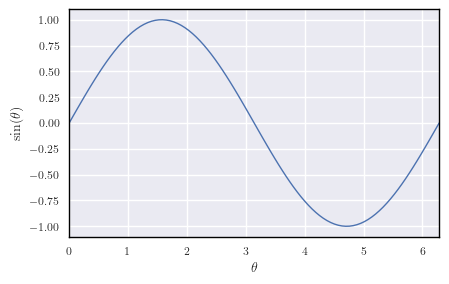

In [48]:
def set_size(width, fraction=1, subplots=(1, 1)):
    """Set figure dimensions to avoid scaling in LaTeX.

    Parameters
    ----------
    width: float or string
            Document width in points, or string of predined document type
    fraction: float, optional
            Fraction of the width which you wish the figure to occupy
    subplots: array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim: tuple
            Dimensions of figure in inches
    """
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    else:
        width_pt = width

    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    # https://disq.us/p/2940ij3
    golden_ratio = (5**.5 - 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])

    return (fig_width_in, fig_height_in)

import numpy as np
import matplotlib.pyplot as plt

# Using seaborn's style
plt.style.use('seaborn')
width = 345
# width = 1000

tex_fonts = {
    # Use LaTeX to write all text
    "text.usetex": True,
    "font.family": "serif",
    # Use 10pt font in plots, to match 10pt font in document
    "axes.labelsize": 10,
    "font.size": 10,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8
}

plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams.update(tex_fonts)
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 4

x = np.linspace(0, 2*np.pi, 100)
# Initialise figure instance
fig, ax = plt.subplots(1, 1, figsize=set_size(width))
# Plot
ax.plot(x, np.sin(x))
ax.set_xlim(0, 2 * np.pi)
ax.set_xlabel(r'$\theta$')
ax.set_ylabel(r'$\sin (\theta)$')



[-0.15 -0.1  -0.05  0.    0.05  0.1   0.15  0.2   0.25]


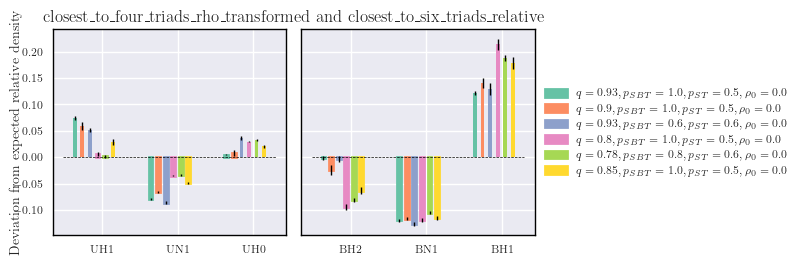

In [51]:
"""Many points
"""


save_ = False
fun_prepare_data = prepare_data5
linewidth = 0.5
orientation = 'h' # 'v' or 'h'
which_ticks = 'zero' #'zero', 'normal'
addon = "_lvl3"
which_group = 6 #there can be `group_size` bars (8 at max). If data has more, which to show
group_size = 6

# reverse = True

width = 345
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])

# sim_data = mean_data.copy()
# sim_data_std = std_data.copy()
# real_data = results_realnet.copy()
# if reverse:
#     order = results_realnet.columns.tolist()
#     order.reverse()
#     real_data = results_realnet[order]
    
#     order = mean_data.columns.tolist()
#     order.reverse()
#     sim_data = sim_data[order]
#     std_data_std = std_data[order]

# triads = ['tr2', 'tr6', 'tr5', 'tr1']
all_sets = [n1_triads, n2_triads]

if orientation == 'v':
    figsize = (figsize[0] , figsize[1] * 1.5)
elif orientation == 'h':
    figsize = (figsize[0]*1.8 , figsize[1])

if fun_prepare_data == prepare_data5:
    line_level = 0
else:
    line_level = 1/3


if orientation == 'v':
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
elif orientation == 'h':
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)
# fig, axes = plt.subplots(1, 1, figsize=figsize, sharey=True)

# Simulated nets
colors = sns.color_palette("Set2").as_hex()[:20]
# sim_labels = [r'$q={q:.2f}$'.format(q=q) for q in sim_data.columns.values]
# print(sim_labels)

triads_set = n1_triads
ydata, yerr = fun_prepare_data(df2_wrho_correct_g.iloc[inds_g3],  triads_set, 
                               std_data = df2_wrho_correct_g.iloc[inds_g3], addon = addon)

ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]
yerr = yerr.loc[:,~ydata.columns.duplicated()].copy() 
ydata = ydata.loc[:,~ydata.columns.duplicated()].copy() 

title = r'$\Delta_1$'
plot_bar_nets(axes[0], ydata, yerr, triads_set, None, labels = None, 
              line_level = line_level, linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5, legend_elem = 4)
# plot_bar_simulatednets(ax=axes[sim_pos, 1], triads_set=n2_triads, title='n2', labels=sim_labels, colors=colors)
triads_set = n2_triads
ydata, yerr = fun_prepare_data(df2_wrho_correct_g.iloc[inds_g3],  triads_set, 
                               std_data = df2_wrho_correct_g.iloc[inds_g3], addon = addon)

ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]
yerr = yerr.loc[:,~ydata.columns.duplicated()].copy() 
ydata = ydata.loc[:,~ydata.columns.duplicated()].copy()

title = r'$\Delta_2$'

plot_bar_nets(axes[1], ydata, yerr, triads_set, None, 
              labels = None, line_level = line_level, 
              linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5, legend_elem = 4)


# fix tick rotations
for ax in axes.flatten():
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)
# fix tick labels
for ax in axes.flatten():
    ax.set_xticklabels([triad_names_map[tick.get_text()] for tick in ax.get_xticklabels()])
# drop double legend
for i in range(2):
#     axes[i, 1].get_legend().remove()
#     axes[i,1].set_ylabel('')
    # set legend to left top corner
    if i==1:
        axes[i].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axes[i].set_ylabel('')
    
ticks = axes[i].get_yticklabels()
ticks = axes[i].get_yticks()
print(ticks)
if which_ticks == "normal":
    ticks2 = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]) - 1/3
    axes[1].set_yticks(ticks2)
    # axes[i,0].set_yticks(ticks - 0.1)
    axes[i].set_yticklabels([r'{tick:.1f}'.format(tick=tick+1/3) for tick in ticks2])
# else:
#     axes[1].set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
    
    
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
# plt.xlabel("common X")
plt.ylabel("Deviation from expected relative density")

try:
    plt.title(error_functions[0 + which_group*2].__name__ + " and " + error_functions[1 + which_group*2].__name__)
except IndexError:
    plt.title(error_functions[0 + which_group*2].__name__)

fname = 'barplots_sim'
fname = fname + "_down"

fname = fname + "_" + orientation
fname = fname + "_" + which_ticks

fname = fname + "_" + str(which_group)

# if reverse is True:
#     fname = fname + "_rev"

if linewidth is None:
    fname = fname + "_noline"

fig.tight_layout()
plt.show()
if save_:
    fname = fname + ".pdf"
    fig.savefig(fname, format='pdf', bbox_inches='tight') 

In [104]:
ydata, yerr = fun_prepare_data(df2_wrho_correct_g.iloc[inds_g3],  triads_set, std_data = df2_wrho_correct_g.iloc[inds_g3])

ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
ydata
# yerr

0.900     0.925     0.875     0.800                         0.850  \
              1.0       1.0       1.0       1.0                           1.0   
              0.5       0.5       0.5       0.5                           0.5   
              0.0       0.0       0.0       0.0                           0.0   
q           0.900     0.925     0.875     0.800                         0.850   
p             1.0       1.0       1.0       1.0                           1.0   
ps            0.5       0.5       0.5       0.5       0.5       0.5       0.5   
tr1_lvl  0.307135  0.332802  0.287354  0.237949  0.237949  0.237949  0.269813   
tr2_lvl  0.215939  0.213286  0.216924  0.213155  0.213155  0.213155  0.217135   
tr4_lvl  0.476927  0.453911  0.495722  0.548896  0.548896  0.548896  0.513052   

            0.775  
              0.8  
              0.6  
              0.0  
q           0.775  
p             0.8  
ps            0.6  
tr1_lvl  0.250627  
tr2_lvl  0.227172  
tr4_lvl  0.522201

In [64]:
yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]
yerr

0.900     0.925     0.875     0.800                      \
                  1.0       1.0       1.0       1.0                       
                  0.5       0.5       0.5       0.5                       
                  0.0       0.0       0.0       0.0       0.0       0.0   
tr3_lvl_std  0.003584  0.004250  0.001843  0.002027  0.002027  0.002027   
tr5_lvl_std  0.000717  0.002119  0.000967  0.000565  0.000565  0.000565   
tr6_lvl_std  0.002135  0.002559  0.002284  0.000991  0.000991  0.000991   

                0.850     0.775  
                  1.0       0.8  
                  0.5       0.6  
                  0.0       0.0  
tr3_lvl_std  0.004538  0.002373  
tr5_lvl_std  0.002079  0.001381  
tr6_lvl_std  0.002429  0.002429

In [120]:
wiki.transpose()
df2_wrho_correct_g.iloc[inds_g3]
wiki_prep, _ = fun_prepare_data(wiki, triads_set)
wiki_prep.values, wiki_prep.columns[0]

n_simulated = ydata.copy()
real_net_data = wiki_prep.copy()

data_name = real_net_data.columns[0]
real_data = [val[0] for val in real_net_data.values]
n_simulated[data_name] = real_data
n_simulated

0.9                                            0.85  \
                        0.5                0.8                          1.0   
         0.7000000000000001 0.6000000000000001                          0.5   
                        0.2                0.4                0.2       0.0   
q                       0.9                0.9                0.9      0.85   
p                       0.5                0.8                0.8       1.0   
ps       0.7000000000000001 0.6000000000000001 0.6000000000000001       0.5   
tr3_lvl3           0.337887           0.358533           0.353313  0.361760   
tr5_lvl3           0.254788           0.261201           0.262254  0.284487   
tr6_lvl3           0.407324           0.380266           0.384433  0.353753   

                      0.775       0.8     0.775 wiki elections  
                        0.8       1.0       0.9                 
         0.6000000000000001       0.5       0.5                 
                        0.0       0.0       0.0                 
q                     0.775       0.8     0.775                 
p                       0.8       1.0       0.9                 
ps       0.6000000000000001       0.5       0.5                 
tr3_lvl3           0.334780  0.338856  0.355402       0.335668  
tr5_lvl3           0.298916  0.298569  0.297918       0.302768  
tr6_lvl3           0.366304  0.362575  0.346680       0.361564

In [122]:
len(n_simulated.index)
len(n_simulated.columns)
real_net_data
n_simulated.columns[-1][0]

'wiki elections'

In [252]:
inds_g[group_size*which_group:group_size*(which_group+1)]

[1865, 1831, 1845, 1610, 1865, 1626]

### Notes (new, based on rho_init results with reps)

* I like $q=0.9$, $p_{SBT} = 0.8$, $p_{ST} = 0.6$, $\rho_0=0.4$ (good discrepancies 
for Delta2, slightly too big, but good for Delta1;  best in closestto 4 triads trans, best in closest to 6 triads corrdev trans, closest to 4 triads corrdev trans)
* I like $q=0.875$, $p_{SBT} = 0.8$, $p_{ST} = 0.6$, $\rho_0=0.4$ (good discrepancies 
for Delta2, slightly too big, but good for Delta1;  best in closestto 4 triads trans, best in closest to 6 triads corrdev trans, closest to 4 triads corrdev trans)
* I like $q=0.9$, $p_{SBT} = 0.8$, $p_{ST} = 0.6$, $\rho_0=0.2$ (similar as above; 
best in closest to 6 triads trans)
* I like $q=0.925$, $p_{SBT} = 0.8$, $p_{ST} = 0.6$, $\rho_0=0.2$ (similar as above; 
best in closest to 6 triads trans)
* I like $q=0.9$, $p_{SBT} = 0.5$, $p_{ST} = 0.7$, $\rho_0=0.2$ (similar as above; 
best in closest to 6 triads trans)
* I like $q=0.85$, $p_{SBT} = 1.0$, $p_{ST} = 0.5$, $\rho_0=0.0$ (perfect discrepancies for Delta1, good for Delta2, bad for BH2 (there is big discrepancy, but there shoudlnt be); best in closest to 6 triads relative)
* I like $q=0.775$, $p_{SBT} = 1.0$, $p_{ST} = 0.5$, $\rho_0=0.0$ (very good Delta1 densities, good over and under for Delta2, poor discrepancy where there shouldnt be; best in closest to 6 triads=)
* I like $q=0.775$, $p_{SBT} = 0.8$, $p_{ST} = 0.6$, $\rho_0=0.0$ (perfect Delta1 densities, good over and under for Delta2, poor discrepancy where there shouldnt be; best in closest to 6 triads relative)
* I like $q=0.8$, $p_{SBT} = 1.0$, $p_{ST} = 0.5$, $\rho_0=0.0$ (very good Delta1 densities, good over and under for Delta2, poor discrepancy where there shouldnt be; best in closest to 6 triads, best in closest to 6 triads rho trans, best in closest to 6 triads relative)
* I like $q=0.825$, $p_{SBT} = 1.0$, $p_{ST} = 0.5$, $\rho_0=0.0$ (very good Delta1 densities, good over and under for Delta2, poor discrepancy where there shouldnt be; best in closest to 6 triads rho trans)
* I like $q=0.75$, $p_{SBT} = 0.8$, $p_{ST} = 0.6$, $\rho_0=0.0$ (very good Delta1 densities, good over and under for Delta2, poor discrepancy where there shouldnt be; best in closest to 6 triads)
* I like $q=0.775$, $p_{SBT} = 0.9$, $p_{ST} = 0.5$, $\rho_0=0.0$ (good Delta1 densities, over-representation where there shouldn't be, good but too small over and under for Delta2; best in closest to 6 triads rho)
* I like $q=0.75$, $p_{SBT} = 0.9$, $p_{ST} = 0.5$, $\rho_0=0.0$ (good Delta1 densities, over-representation where there shouldn't be, good but too small over and under for Delta2; best in closest to 6 triads rho)
* I like $q=0.8$, $p_{SBT} = 0.9$, $p_{ST} = 0.5$, $\rho_0=0.0$ (good Delta1 densities, over-representation where there shouldn't be, good but too small over and under for Delta2; best in closest to 6 triads rho)

### Grouping above results

* (0.9, 0.5, 0.7, 0.2)

* (0.75-775, 0.8, 0.6, 0.0),  
* (0.9-0.925, 0.8, 0.6, 0.2)
* (0.875-0.9, 0.8, 0.6, 0.4)

* (0.75-0.8, 0.9, 0.5, 0.0), 
* (0.775-0.85, 1.0, 0.5, 0.0)


In [69]:
def get_inds(df, sets, multipleOK = False):
    """Finds inds looking for indexes but not exact values
    """
    inds = []
    for set_ in sets:
        q, p, ps, rho_init = set_
        ind_p = np.where((np.abs(df.q - q) < 1e-8) & (np.abs(df.p - p) < 1e-8) & 
                         (np.abs(df.ps - ps) < 1e-8) & (np.abs(df.rho_init - rho_init) < 1e-8) )
        if len(ind_p[0]) == 0:
            print("No index for " + set_)
        else:
            if len(ind_p[0]) > 1:
                if not multipleOK:
                    print("Multiple points for " + str(set_))
            inds.extend(ind_p[0])
    return inds

In [108]:
sets = [(0.9, 0.5, 0.7, 0.2), (0.925, 0.8, 0.6, 0.2),
        (0.9, 0.8, 0.6, 0.4), (0.875, 0.8, 0.6, 0.4), (0.9, 0.8, 0.6, 0.2), 
        (0.85, 1.0, 0.5, 0.0), (0.775, 1.0, 0.5, 0.0), (0.775, 0.8, 0.6, 0.0), 
        (0.8, 1.0, 0.5, 0.0), (0.825, 1.0, 0.5, 0.0), (0.75, 0.8, 0.6, 0.0), 
        (0.775, 0.9, 0.5, 0.0), (0.75, 0.9, 0.5, 0.0), (0.8, 0.9, 0.5, 0.0)]

sets = [(0.9, 0.5, 0.7, 0.2), 
        (0.9, 0.8, 0.6, 0.4), (0.9, 0.8, 0.6, 0.2), 
        (0.85, 1.0, 0.5, 0.0), (0.775, 1.0, 0.5, 0.0), (0.775, 0.8, 0.6, 0.0), 
        (0.8, 1.0, 0.5, 0.0), (0.825, 1.0, 0.5, 0.0), 
        (0.775, 0.9, 0.5, 0.0)]

sets = [(0.9, 0.5, 0.7, 0.2), 
        (0.9, 0.8, 0.6, 0.4), (0.9, 0.8, 0.6, 0.2), 
        (0.85, 1.0, 0.5, 0.0), (0.775, 0.8, 0.6, 0.0), 
        (0.8, 1.0, 0.5, 0.0),
        (0.775, 0.9, 0.5, 0.0)]

inds = get_inds(df2_wrho_correct_g, sets)
df2_wrho_correct_g.iloc[inds]

q    p   ps  rho_init  repetitions   rho_lvl  \
0.900 0.5 0.7 0.2  0.900  0.5  0.7       0.2            5  0.895893   
      0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.916989   
              0.2  0.900  0.8  0.6       0.2            5  0.893451   
0.850 1.0 0.5 0.0  0.850  1.0  0.5       0.0            5  0.838019   
0.775 0.8 0.6 0.0  0.775  0.8  0.6       0.0            5  0.836517   
0.800 1.0 0.5 0.0  0.800  1.0  0.5       0.0            5  0.840489   
0.775 0.9 0.5 0.0  0.775  0.9  0.5       0.0            5  0.806144   

                   rho_lvl_std  rho_lvl_valid  rho_lvl2  rho_lvl2_std  ...  \
0.900 0.5 0.7 0.2     0.002051              5  0.895893      0.002051  ...   
      0.8 0.6 0.4     0.000000              1  0.916989      0.000000  ...   
              0.2     0.001058              5  0.893451      0.001058  ...   
0.850 1.0 0.5 0.0     0.000942              5  0.838019      0.000942  ...   
0.775 0.8 0.6 0.0     0.000742              5  0.836517      0.000742  ...   
0.800 1.0 0.5 0.0     0.000725              5  0.840489      0.000725  ...   
0.775 0.9 0.5 0.0     0.000794              5  0.806144      0.000794  ...   

                   closest_to_six_triads  closest_to_six_triads_transformed  \
0.900 0.5 0.7 0.2               0.004356                           0.009082   
      0.8 0.6 0.4               0.005097                           0.009926   
              0.2               0.003663                           0.008830   
0.850 1.0 0.5 0.0               0.000964                           0.014975   
0.775 0.8 0.6 0.0               0.000932                           0.017137   
0.800 1.0 0.5 0.0               0.000884                           0.014360   
0.775 0.9 0.5 0.0               0.001772                           0.025275   

                   closest_to_six_triads_corrdevs_transformed  \
0.900 0.5 0.7 0.2                                    0.008526   
      0.8 0.6 0.4                                    0.006487   
              0.2                                    0.008004   
0.850 1.0 0.5 0.0                                    0.011398   
0.775 0.8 0.6 0.0                                    0.015031   
0.800 1.0 0.5 0.0                                    0.013980   
0.775 0.9 0.5 0.0                                    0.016047   

                   closest_to_four_triads_corrdevs_transformed  \
0.900 0.5 0.7 0.2                                     0.008526   
      0.8 0.6 0.4                                     0.006487   
              0.2                                     0.008004   
0.850 1.0 0.5 0.0                                     0.011398   
0.775 0.8 0.6 0.0                                     0.015031   
0.800 1.0 0.5 0.0                                     0.013980   
0.775 0.9 0.5 0.0                                     0.016047   

                   closest_to_six_triads_rho  \
0.900 0.5 0.7 0.2                   0.055926   
      0.8 0.6 0.4                   0.079835   
              0.2                   0.053199   
0.850 1.0 0.5 0.0                   0.010745   
0.775 0.8 0.6 0.0                   0.010006   
0.800 1.0 0.5 0.0                   0.011863   
0.775 0.9 0.5 0.0                   0.002517   

                   closest_to_six_triads_rho_transformed  \
0.900 0.5 0.7 0.2                               0.029710   
      0.8 0.6 0.4                               0.039821   
              0.2                               0.028644   
0.850 1.0 0.5 0.0                               0.018887   
0.775 0.8 0.6 0.0                               0.020767   
0.800 1.0 0.5 0.0                               0.018751   
0.775 0.9 0.5 0.0                               0.025573   

                   closest_to_four_triads_rho  \
0.900 0.5 0.7 0.2                    0.053641   
      0.8 0.6 0.4                    0.077323   
              0.2                    0.051294   
0.850 1.0 0.5 0.0                    0.010001   
0.775 0.8 0.6 0.0                  

In [161]:
df2_wrho_correct_g.iloc[inds].rho.values
wiki_rho.values[0]

0.7947289140762432

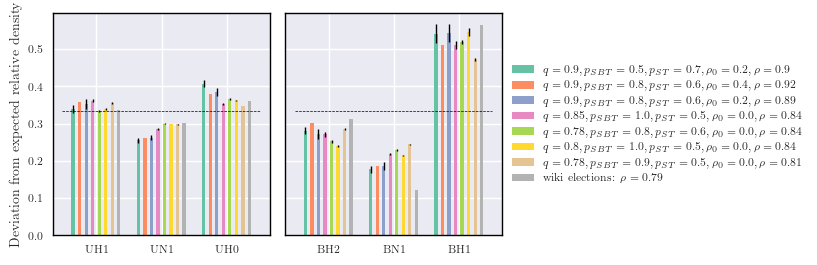

In [167]:
"""Many points
"""


save_ = False
fun_prepare_data = prepare_data4
linewidth = 0.5
addon = "_lvl3"
orientation = 'h' # 'v' or 'h'
which_ticks = 'zero' #'zero', 'normal'
which_group = 0 #there can be `group_size` bars (8 at max). If data has more, which to show. If `add_real_data == True`, then there should be 7 at max. 
group_size = 7
add_real_data = True
show_error = True
show_rho = True

# reverse = True

width = 345
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])

# sim_data = mean_data.copy()
# sim_data_std = std_data.copy()
# real_data = results_realnet.copy()
# if reverse:
#     order = results_realnet.columns.tolist()
#     order.reverse()
#     real_data = results_realnet[order]
    
#     order = mean_data.columns.tolist()
#     order.reverse()
#     sim_data = sim_data[order]
#     std_data_std = std_data[order]

# triads = ['tr2', 'tr6', 'tr5', 'tr1']
all_sets = [n1_triads, n2_triads]

if orientation == 'v':
    figsize = (figsize[0] , figsize[1] * 1.5)
elif orientation == 'h':
    figsize = (figsize[0]*1.8 , figsize[1])

if fun_prepare_data == prepare_data5:
    line_level = 0
else:
    line_level = 1/3


if orientation == 'v':
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
elif orientation == 'h':
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)
# fig, axes = plt.subplots(1, 1, figsize=figsize, sharey=True)

# Simulated nets
colors = sns.color_palette("Set2").as_hex()[:20]
# sim_labels = [r'$q={q:.2f}$'.format(q=q) for q in sim_data.columns.values]
# print(sim_labels)

triads_set = n1_triads
ydata, yerr = fun_prepare_data(df2_wrho_correct_g.iloc[inds],  triads_set, 
                               std_data = df2_wrho_correct_g.iloc[inds], addon = addon)

ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
if show_error:
    yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]
    yerr = yerr.loc[:,~ydata.columns.duplicated()].copy() 
else:
    yerr = None
ydata = ydata.loc[:,~ydata.columns.duplicated()].copy() 
# yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]

if add_real_data:
    real_net_data, _ = fun_prepare_data(wiki,  triads_set)
else:
    real_net_data = None

if show_rho:
    rhos = df2_wrho_correct_g.iloc[inds].rho.values
    wiki_rho = wiki.rho.values[0]
else:
    rhos = None
    wiki_rho = None

title = r'$\Delta_1$'
plot_bar_nets(axes[0], ydata, yerr, triads_set, None, labels = None, 
              line_level = line_level, linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5, legend_elem = 4, 
              real_net_data = real_net_data, additional_label_data = rhos, real_net_additional_label_data = wiki_rho)
# plot_bar_simulatednets(ax=axes[sim_pos, 1], triads_set=n2_triads, title='n2', labels=sim_labels, colors=colors)
triads_set = n2_triads
ydata, yerr = fun_prepare_data(df2_wrho_correct_g.iloc[inds],  triads_set, 
                               std_data = df2_wrho_correct_g.iloc[inds], addon = addon)

ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
if show_error:
    yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]
    yerr = yerr.loc[:,~ydata.columns.duplicated()].copy() 
else:
    yerr = None
ydata = ydata.loc[:,~ydata.columns.duplicated()].copy()
# yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]

if add_real_data:
    real_net_data, _ = fun_prepare_data(wiki,  triads_set)
else:
    real_net_data = None

title = r'$\Delta_2$'

plot_bar_nets(axes[1], ydata, yerr, triads_set, None, 
              labels = None, line_level = line_level, 
              linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5, legend_elem = 4, 
              real_net_data = real_net_data, additional_label_data = rhos, real_net_additional_label_data = wiki_rho)


# fix tick rotations
for ax in axes.flatten():
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)
# fix tick labels
for ax in axes.flatten():
    ax.set_xticklabels([triad_names_map[tick.get_text()] for tick in ax.get_xticklabels()])
# drop double legend
for i in range(2):
#     axes[i, 1].get_legend().remove()
#     axes[i,1].set_ylabel('')
    # set legend to left top corner
    if i==1:
        axes[i].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axes[i].set_ylabel('')
    
ticks = axes[i].get_yticklabels()
ticks = axes[i].get_yticks()
# print(ticks)
if which_ticks == "normal":
    ticks2 = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]) - 1/3
    axes[1].set_yticks(ticks2)
    # axes[i,0].set_yticks(ticks - 0.1)
    axes[i].set_yticklabels([r'{tick:.1f}'.format(tick=tick+1/3) for tick in ticks2])
# else:
#     axes[1].set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
    
    
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
# plt.xlabel("common X")
plt.ylabel("Deviation from expected relative density")

fname = 'barplots_wiki_rhoinit_s2000_repeat5'
# fname = fname + "_down"

fname = fname + "_" + orientation
fname = fname + "_" + which_ticks

fname = fname + "_" + str(which_group)

if show_error:
    fname = fname + "_err"
if add_real_data:
    fname = fname + "_real"
if show_rho:
    fname = fname + "_rho"

# if reverse is True:
#     fname = fname + "_rev"

if linewidth is None:
    fname = fname + "_noline"

fig.tight_layout()
plt.show()
if save_:
    fname = fname + ".pdf"
    fig.savefig(fname, format='pdf', bbox_inches='tight') 

In [137]:
real_data

[0.3356682211775576, 0.30276752882712465, 0.3615642499953177]

In [254]:
sets = [(0.9, 0.0, 0.8, 0.0), (0.9, 0.8, 0.6, 0.4), (0.9, 0.8, 0.6, 0.2), 
        (0.925, 0.7, 0.6, 0.2), (0.925, 0.7, 0.6, 0.0)]

sets = [(0.9, 0.8, 0.6, 0.4), (0.9, 0.8, 0.6, 0.2), 
        (0.925, 0.7, 0.6, 0.2), (0.925, 0.7, 0.6, 0.0), (0.85, 0.6, 0.7, 0.4), 
        (0.85, 1.0, 0.5, 0.0), (0.9, 0.4, 0.7, 0.0), (0.925, 0.3, 0.7, 0.0)] 
        # (0.775, 1.0, 0.5, 0.0)]

sets = [(0.9, 0.8, 0.6, 0.4), (0.9, 0.8, 0.6, 0.2), 
        (0.925, 0.7, 0.6, 0.0), (0.85, 0.6, 0.7, 0.4), 
        (0.85, 1.0, 0.5, 0.0), (0.9, 0.4, 0.7, 0.0), (0.925, 0.3, 0.7, 0.0), 
        (0.775, 1.0, 0.5, 0.0)]

inds = get_inds(df2_joined_correct_g, sets)
df2_joined_correct_g.iloc[inds]

q    p   ps  rho_init  repetitions   rho_lvl  \
0.900 0.8 0.6 0.4  0.900  0.8  0.6       0.4            1  0.915134   
              0.2  0.900  0.8  0.6       0.2            1  0.891006   
0.925 0.7 0.6 0.0  0.925  0.7  0.6       0.0            1  0.851985   
0.850 0.6 0.7 0.4  0.850  0.6  0.7       0.4            1  0.913060   
      1.0 0.5 0.0  0.850  1.0  0.5       0.0            1  0.830820   
0.900 0.4 0.7 0.0  0.900  0.4  0.7       0.0            1  0.840841   
0.925 0.3 0.7 0.0  0.925  0.3  0.7       0.0            1  0.842721   
0.775 1.0 0.5 0.0  0.775  1.0  0.5       0.0            1  0.835193   

                   rho_lvl_std  rho_lvl_valid  rho_lvl2  rho_lvl2_std  ...  \
0.900 0.8 0.6 0.4          0.0              1  0.915134           0.0  ...   
              0.2          0.0              1  0.891006           0.0  ...   
0.925 0.7 0.6 0.0          0.0              1  0.851985           0.0  ...   
0.850 0.6 0.7 0.4          0.0              1  0.913060           0.0  ...   
      1.0 0.5 0.0          0.0              1  0.830820           0.0  ...   
0.900 0.4 0.7 0.0          0.0              1  0.840841           0.0  ...   
0.925 0.3 0.7 0.0          0.0              1  0.842721           0.0  ...   
0.775 1.0 0.5 0.0          0.0              1  0.835193           0.0  ...   

                   closest_to_six_triads  closest_to_six_triads_transformed  \
0.900 0.8 0.6 0.4               0.005310                           0.010699   
              0.2               0.003697                           0.008505   
0.925 0.7 0.6 0.0               0.001727                           0.008609   
0.850 0.6 0.7 0.4               0.005056                           0.008823   
      1.0 0.5 0.0               0.000820                           0.011800   
0.900 0.4 0.7 0.0               0.001503                           0.009449   
0.925 0.3 0.7 0.0               0.001845                           0.010226   
0.775 1.0 0.5 0.0               0.000774                           0.015972   

                   closest_to_six_triads_corrdevs_transformed  \
0.900 0.8 0.6 0.4                                    0.006890   
              0.2                                    0.008062   
0.925 0.7 0.6 0.0                                    0.007318   
0.850 0.6 0.7 0.4                                    0.007262   
      1.0 0.5 0.0                                    0.010422   
0.900 0.4 0.7 0.0                                    0.008631   
0.925 0.3 0.7 0.0                                    0.009665   
0.775 1.0 0.5 0.0                                    1.015712   

                   closest_to_four_triads_corrdevs_transformed  \
0.900 0.8 0.6 0.4                                     0.006890   
              0.2                                     0.008062   
0.925 0.7 0.6 0.0                                     0.007318   
0.850 0.6 0.7 0.4                                     0.007262   
      1.0 0.5 0.0                                     0.010422   
0.900 0.4 0.7 0.0                                     0.008631   
0.925 0.3 0.7 0.0                                     0.009665   
0.775 1.0 0.5 0.0                                     0.015712   

                   closest_to_six_triads_rho  \
0.900 0.8 0.6 0.4                   0.079833   
              0.2                   0.050445   
0.925 0.7 0.6 0.0                   0.018938   
0.850 0.6 0.7 0.4                   0.075343   
      1.0 0.5 0.0                   0.007907   
0.900 0.4 0.7 0.0                   0.015064   
0.925 0.3 0.7 0.0                   0.014670   
0.775 1.0 0.5 0.0                   0.009260   

                   closest_to_six_triads_rho_transformed  \
0.900 0.8 0.6 0.4                               0.040508   
              0.2                               0.027204   
0.925 0.7 0.6 0.0                               0.015493   
0.850 0.6 0.7 0.4                               0.036937   
      1.0 0.5 0.0                               0.0146

[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7]


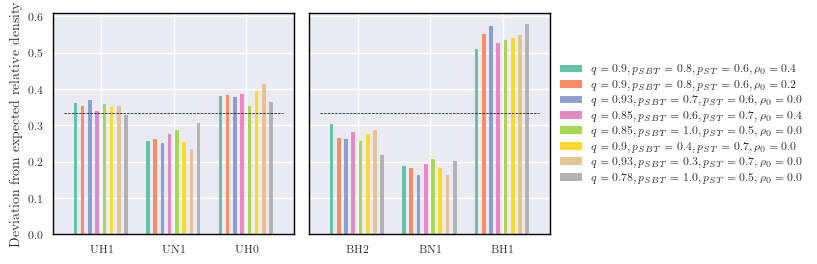

In [256]:
"""Many points
"""


save_ = True
fun_prepare_data = prepare_data4
linewidth = 0.5
addon = "_lvl3"
orientation = 'h' # 'v' or 'h'
which_ticks = 'zero' #'zero', 'normal'
# which_group = 6 #there can be `group_size` bars (8 at max). If data has more, which to show
# group_size = 6

# reverse = True

width = 345
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])

# sim_data = mean_data.copy()
# sim_data_std = std_data.copy()
# real_data = results_realnet.copy()
# if reverse:
#     order = results_realnet.columns.tolist()
#     order.reverse()
#     real_data = results_realnet[order]
    
#     order = mean_data.columns.tolist()
#     order.reverse()
#     sim_data = sim_data[order]
#     std_data_std = std_data[order]

# triads = ['tr2', 'tr6', 'tr5', 'tr1']
all_sets = [n1_triads, n2_triads]

if orientation == 'v':
    figsize = (figsize[0] , figsize[1] * 1.5)
elif orientation == 'h':
    figsize = (figsize[0]*1.8 , figsize[1])

if fun_prepare_data == prepare_data5:
    line_level = 0
else:
    line_level = 1/3


if orientation == 'v':
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
elif orientation == 'h':
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)
# fig, axes = plt.subplots(1, 1, figsize=figsize, sharey=True)

# Simulated nets
colors = sns.color_palette("Set2").as_hex()[:20]
# sim_labels = [r'$q={q:.2f}$'.format(q=q) for q in sim_data.columns.values]
# print(sim_labels)

triads_set = n1_triads
ydata, yerr = fun_prepare_data(df2_joined_correct_g.iloc[inds],  triads_set, 
                               std_data = None, addon = addon)

# ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
# ydata = ydata.loc[:,~ydata.columns.duplicated()].copy() 
# yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]

title = r'$\Delta_1$'
plot_bar_nets(axes[0], ydata, None, triads_set, None, labels = None, 
              line_level = line_level, linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5, legend_elem = 4)
# plot_bar_simulatednets(ax=axes[sim_pos, 1], triads_set=n2_triads, title='n2', labels=sim_labels, colors=colors)
triads_set = n2_triads
ydata, yerr = fun_prepare_data(df2_joined_correct_g.iloc[inds],  triads_set, 
                               std_data = None, addon = addon)

# ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
# ydata = ydata.loc[:,~ydata.columns.duplicated()].copy()
# yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]

title = r'$\Delta_2$'

plot_bar_nets(axes[1], ydata, None, triads_set, None, 
              labels = None, line_level = line_level, 
              linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5, legend_elem = 4)


# fix tick rotations
for ax in axes.flatten():
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)
# fix tick labels
for ax in axes.flatten():
    ax.set_xticklabels([triad_names_map[tick.get_text()] for tick in ax.get_xticklabels()])
# drop double legend
for i in range(2):
#     axes[i, 1].get_legend().remove()
#     axes[i,1].set_ylabel('')
    # set legend to left top corner
    if i==1:
        axes[i].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axes[i].set_ylabel('')
    
ticks = axes[i].get_yticklabels()
ticks = axes[i].get_yticks()
print(ticks)
if which_ticks == "normal":
    ticks2 = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]) - 1/3
    axes[1].set_yticks(ticks2)
    # axes[i,0].set_yticks(ticks - 0.1)
    axes[i].set_yticklabels([r'{tick:.1f}'.format(tick=tick+1/3) for tick in ticks2])
# else:
#     axes[1].set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
    
    
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
# plt.xlabel("common X")
plt.ylabel("Deviation from expected relative density")

fname = 'barplots_wiki_rhoinit_new'
# fname = fname + "_down"

fname = fname + "_" + orientation
fname = fname + "_" + which_ticks

fname = fname + "_" + str(which_group)

# if reverse is True:
#     fname = fname + "_rev"

if linewidth is None:
    fname = fname + "_noline"

fig.tight_layout()
plt.show()
if save_:
    fname = fname + ".pdf"
    fig.savefig(fname, format='pdf', bbox_inches='tight') 

In [222]:
# 0.8, 0.4, 0.9 (looking good overall, best in closest to 4 triads transformed, 6 triads trans, 4 triads corrdev trans, )
# 0.8, 0.7, 0.7 (slightly worse than above, best in closest to 4 triads trans, 6 triads trans, 6 triads corrdev trans, 4 triads corrdev trans, )

sets_g = [(0.8, 0.4, 0.9), (0.8, 0.7, 0.7)]
df2_w1000_g.loc[sets_g]

q    p   ps  repetitions   rho_lvl  rho_lvl_std  rho_lvl_valid  \
0.8 0.4 0.9  0.8  0.4  0.9            1  0.965761          0.0              1   
    0.7 0.7  0.8  0.7  0.7            1  0.963461          0.0              1   

             rho_lvl2  rho_lvl2_std  rho_lvl2_valid  ...  \
0.8 0.4 0.9  0.965761           0.0               1  ...   
    0.7 0.7  0.963461           0.0               1  ...   

             closest_to_four_triads  closest_to_four_triads_transformed  \
0.8 0.4 0.9                0.007137                            0.002214   
    0.7 0.7                0.006283                            0.003106   

             closest_to_six_triads  closest_to_six_triads_transformed  \
0.8 0.4 0.9               0.012661                           0.003949   
    0.7 0.7               0.011340                           0.004401   

             closest_to_six_triads_corrdevs_transformed  \
0.8 0.4 0.9                                    1.002214   
    0.7 0.7                                    1.003106   

             closest_to_four_triads_corrdevs_transformed  \
0.8 0.4 0.9                                     0.002214   
    0.7 0.7                                     0.003106   

             closest_to_six_triads_rho  closest_to_six_triads_rho_transformed  \
0.8 0.4 0.9                   0.158921                               0.062453   
    0.7 0.7                   0.153692                               0.061342   

             closest_to_four_triads_rho  \
0.8 0.4 0.9                    0.153397   
    0.7 0.7                    0.148635   

             closest_to_four_triads_rho_transformed  
0.8 0.4 0.9                                0.060718  
    0.7 0.7                                0.060046  

[2 rows x 50 columns]

[0.  0.1 0.2 0.3 0.4 0.5 0.6]


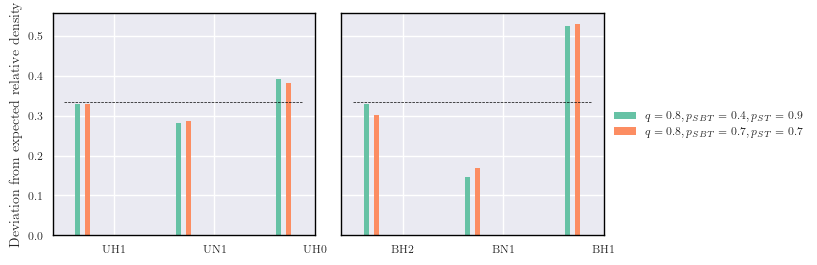

In [257]:
"""Many points
"""


save_ = True
fun_prepare_data = prepare_data4
linewidth = 0.5
orientation = 'h' # 'v' or 'h'
which_ticks = 'zero' #'zero', 'normal'
# which_group = 6 #there can be `group_size` bars (8 at max). If data has more, which to show
# group_size = 6

# reverse = True

width = 345
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])

# sim_data = mean_data.copy()
# sim_data_std = std_data.copy()
# real_data = results_realnet.copy()
# if reverse:
#     order = results_realnet.columns.tolist()
#     order.reverse()
#     real_data = results_realnet[order]
    
#     order = mean_data.columns.tolist()
#     order.reverse()
#     sim_data = sim_data[order]
#     std_data_std = std_data[order]

# triads = ['tr2', 'tr6', 'tr5', 'tr1']
all_sets = [n1_triads, n2_triads]

if orientation == 'v':
    figsize = (figsize[0] , figsize[1] * 1.5)
elif orientation == 'h':
    figsize = (figsize[0]*1.8 , figsize[1])

if fun_prepare_data == prepare_data5:
    line_level = 0
else:
    line_level = 1/3


if orientation == 'v':
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
elif orientation == 'h':
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)
# fig, axes = plt.subplots(1, 1, figsize=figsize, sharey=True)

# Simulated nets
colors = sns.color_palette("Set2").as_hex()[:20]
# sim_labels = [r'$q={q:.2f}$'.format(q=q) for q in sim_data.columns.values]
# print(sim_labels)

triads_set = n1_triads
ydata, yerr = fun_prepare_data(df2_w1000_g.loc[sets_g],  triads_set, std_data = None)

# ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
# ydata = ydata.loc[:,~ydata.columns.duplicated()].copy() 
# yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]

title = r'$\Delta_1$'
plot_bar_nets(axes[0], ydata, None, triads_set, None, labels = None, 
              line_level = line_level, linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5)
# plot_bar_simulatednets(ax=axes[sim_pos, 1], triads_set=n2_triads, title='n2', labels=sim_labels, colors=colors)
triads_set = n2_triads
ydata, yerr = fun_prepare_data(df2_w1000_g.loc[sets_g],  triads_set, std_data = None)

# ydata = ydata[ydata.columns[group_size*which_group:group_size*(which_group+1)]]
# ydata = ydata.loc[:,~ydata.columns.duplicated()].copy()
# yerr = yerr[yerr.columns[group_size*which_group:group_size*(which_group+1)]]

title = r'$\Delta_2$'

plot_bar_nets(axes[1], ydata, None, triads_set, None, 
              labels = None, line_level = line_level, 
              linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5)


# fix tick rotations
for ax in axes.flatten():
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)
# fix tick labels
for ax in axes.flatten():
    ax.set_xticklabels([triad_names_map[tick.get_text()] for tick in ax.get_xticklabels()])
# drop double legend
for i in range(2):
#     axes[i, 1].get_legend().remove()
#     axes[i,1].set_ylabel('')
    # set legend to left top corner
    if i==1:
        axes[i].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axes[i].set_ylabel('')
    
ticks = axes[i].get_yticklabels()
ticks = axes[i].get_yticks()
print(ticks)
if which_ticks == "normal":
    ticks2 = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]) - 1/3
    axes[1].set_yticks(ticks2)
    # axes[i,0].set_yticks(ticks - 0.1)
    axes[i].set_yticklabels([r'{tick:.1f}'.format(tick=tick+1/3) for tick in ticks2])
# else:
#     axes[1].set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
    
    
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
# plt.xlabel("common X")
plt.ylabel("Deviation from expected relative density")

fname = 'barplots_wiki2_s1000_sim_best_grouped'
fname = fname + "_down"

fname = fname + "_" + orientation
fname = fname + "_" + which_ticks

fname = fname + "_" + str(which_group)

# if reverse is True:
#     fname = fname + "_rev"

if linewidth is None:
    fname = fname + "_noline"

fig.tight_layout()
plt.show()
if save_:
    fname = fname + ".pdf"
    fig.savefig(fname, format='pdf', bbox_inches='tight') 

In [226]:
df2_w1000_g.loc[sets_g]

q    p   ps  repetitions   rho_lvl  rho_lvl_std  rho_lvl_valid  \
0.8 0.4 0.9  0.8  0.4  0.9            1  0.965761          0.0              1   
    0.7 0.7  0.8  0.7  0.7            1  0.963461          0.0              1   

             rho_lvl2  rho_lvl2_std  rho_lvl2_valid  ...  \
0.8 0.4 0.9  0.965761           0.0               1  ...   
    0.7 0.7  0.963461           0.0               1  ...   

             closest_to_four_triads  closest_to_four_triads_transformed  \
0.8 0.4 0.9                0.007137                            0.002214   
    0.7 0.7                0.006283                            0.003106   

             closest_to_six_triads  closest_to_six_triads_transformed  \
0.8 0.4 0.9               0.012661                           0.003949   
    0.7 0.7               0.011340                           0.004401   

             closest_to_six_triads_corrdevs_transformed  \
0.8 0.4 0.9                                    1.002214   
    0.7 0.7                                    1.003106   

             closest_to_four_triads_corrdevs_transformed  \
0.8 0.4 0.9                                     0.002214   
    0.7 0.7                                     0.003106   

             closest_to_six_triads_rho  closest_to_six_triads_rho_transformed  \
0.8 0.4 0.9                   0.158921                               0.062453   
    0.7 0.7                   0.153692                               0.061342   

             closest_to_four_triads_rho  \
0.8 0.4 0.9                    0.153397   
    0.7 0.7                    0.148635   

             closest_to_four_triads_rho_transformed  
0.8 0.4 0.9                                0.060718  
    0.7 0.7                                0.060046  

[2 rows x 50 columns]

In [239]:
i_l = (df_w1000.q == sets_g[0][0]) & (df_w1000.p == sets_g[0][1]) & (df_w1000.ps == sets_g[0][2])

np.where(i_l)[0]

df_w1000[i_l]

,index,q,p,ps,rho_init,steps,cur_steps,rho,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,Lplus
754,0,0.8,0.4,0.9,0.794729,1000,"[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 1...","[0.7966249881495371, 0.887615476177936, 0.9146...","[0.008919260960182734, 0.001646694733395157, 0...","[0.0342410508784385, 0.014763886521662693, 0.0...","[0.03411355617617889, 0.009264167681032411, 0....","[0.13266561897335896, 0.08812568025133903, 0.0...","[0.03354184309025685, 0.011954976923458892, 0....","[0.12960977226762077, 0.0777113761509752, 0.05...","[0.12780739979251915, 0.07661223761254762, 0.0...","[0.49910149786144414, 0.719920980125589, 0.792...","[75626.0, 84264.0, 86831.0, 88252.0, 89266.0, ..."


In [251]:
a[0]

array([0.13266562, 0.08812568, 0.06833716, 0.05635668, 0.04968536,
       0.04329988, 0.03780553, 0.032181  , 0.03035179, 0.02830248,
       0.02518893, 0.02233036, 0.02092255, 0.02009451, 0.01952145,
       0.01741309, 0.01753656, 0.01662665, 0.01672462, 0.01599186,
       0.01677293, 0.01703732, 0.01477328, 0.01574358, 0.01669107,
       0.01536512, 0.01297493, 0.01307559, 0.01250388, 0.01132421,
       0.01295615, 0.01316953, 0.01302996, 0.01434651, 0.01351712,
       0.01472765, 0.01487393, 0.01584155, 0.01537989, 0.01635287,
       0.01474912, 0.01534097, 0.01630993, 0.01562011, 0.01390229,
       0.01542015, 0.01491822, 0.01685077, 0.01673267, 0.01464579,
       0.0147357 , 0.01527655, 0.01355067, 0.01475986, 0.01464847,
       0.01552751, 0.01646292, 0.01546309, 0.0150323 , 0.01457063,
       0.01488736, 0.01461358, 0.0166186 , 0.01568856, 0.01562146,
       0.01542015, 0.01596905, 0.01471423, 0.01519737, 0.01608715,
       0.01583753, 0.01442301, 0.01335608, 0.01455184, 0.01302

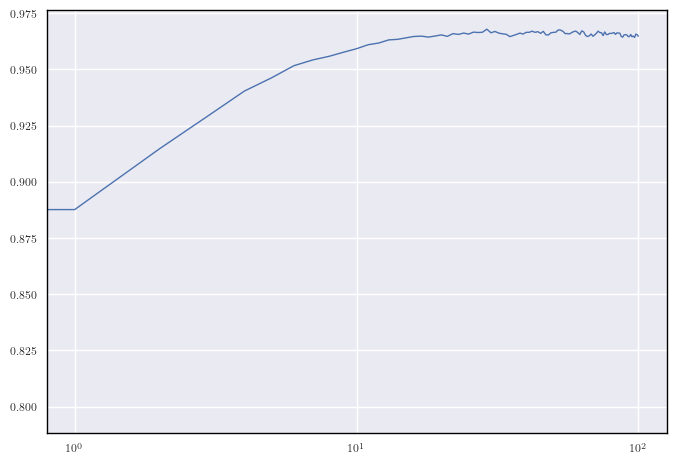

In [255]:
a = df_w1000[i_l]["rho"].values[0]
plt.plot(a)
    
# plt.legend(deg_triads)
plt.xscale('log')

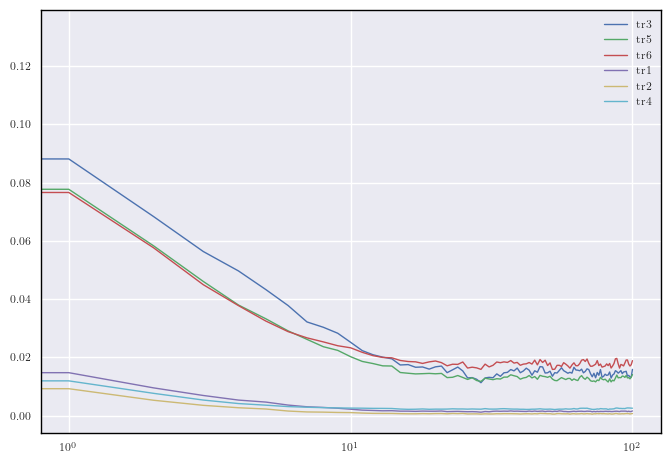

In [253]:
# inds = np.where(df_w1000.rho_init > 0)[0]
# inds2 = np.where(df_w1000.rho_init < 0)[0]

for triad in deg_triads:
    # print(triad)
    a = df_w1000[i_l][triad].values[0]
    plt.plot(a)
    
plt.legend(deg_triads)
plt.xscale('log')

[-0.3 -0.2 -0.1  0.   0.1  0.2  0.3  0.4]


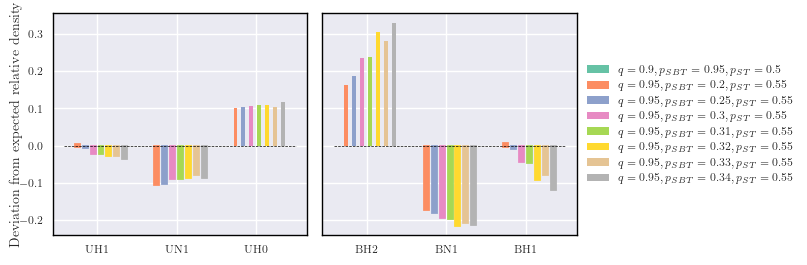

In [68]:
"""Many points
"""


save_ = False
fun_prepare_data = prepare_data5
linewidth = 0.5
orientation = 'h' # 'v' or 'h'
which_ticks = 'zero' #'zero', 'normal'
which_eight = 0 #there can be 8 bars at max. If data has more, which to show

df_data = df32long_g

# reverse = True

width = 345
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])

# sim_data = mean_data.copy()
# sim_data_std = std_data.copy()
# real_data = results_realnet.copy()
# if reverse:
#     order = results_realnet.columns.tolist()
#     order.reverse()
#     real_data = results_realnet[order]
    
#     order = mean_data.columns.tolist()
#     order.reverse()
#     sim_data = sim_data[order]
#     std_data_std = std_data[order]

triads = ['tr2', 'tr6', 'tr5', 'tr1']
all_sets = [n1_triads, n2_triads]

if orientation == 'v':
    figsize = (figsize[0] , figsize[1] * 1.5)
elif orientation == 'h':
    figsize = (figsize[0]*1.8 , figsize[1])

if fun_prepare_data == prepare_data5:
    line_level = 0
else:
    line_level = 1/3


if orientation == 'v':
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
elif orientation == 'h':
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)
# fig, axes = plt.subplots(1, 1, figsize=figsize, sharey=True)

# Simulated nets
colors = sns.color_palette("Set2").as_hex()[:20]
# sim_labels = [r'$q={q:.2f}$'.format(q=q) for q in sim_data.columns.values]
# print(sim_labels)

triads_set = n1_triads
ydata, yerr = fun_prepare_data(df32long_g,  triads_set, std_data = df32long_g)

ydata = ydata[ydata.columns[8*which_eight:8*(which_eight+1)]]
yerr = yerr[yerr.columns[8*which_eight:8*(which_eight+1)]]

title = r'$\Delta_1$'
plot_bar_nets(axes[0], ydata, None, triads_set, None, labels = None, 
              line_level = line_level, linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5)
# plot_bar_simulatednets(ax=axes[sim_pos, 1], triads_set=n2_triads, title='n2', labels=sim_labels, colors=colors)
triads_set = n2_triads
ydata, yerr = fun_prepare_data(df32long_g,  triads_set, std_data = df32long_g)

ydata = ydata[ydata.columns[8*which_eight:8*(which_eight+1)]]
yerr = yerr[yerr.columns[8*which_eight:8*(which_eight+1)]]

title = r'$\Delta_2$'

plot_bar_nets(axes[1], ydata, None, triads_set, None, 
              labels = None, line_level = line_level, 
              linewidth = linewidth, colors=colors, 
              width = 0.15, smallest_edge = True, m = 0.5)


# fix tick rotations
for ax in axes.flatten():
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)
# fix tick labels
for ax in axes.flatten():
    ax.set_xticklabels([triad_names_map[tick.get_text()] for tick in ax.get_xticklabels()])
# drop double legend
for i in range(2):
#     axes[i, 1].get_legend().remove()
#     axes[i,1].set_ylabel('')
    # set legend to left top corner
    if i==1:
        axes[i].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axes[i].set_ylabel('')
    
ticks = axes[i].get_yticklabels()
ticks = axes[i].get_yticks()
print(ticks)
if which_ticks == "normal":
    ticks2 = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]) - 1/3
    axes[1].set_yticks(ticks2)
    # axes[i,0].set_yticks(ticks - 0.1)
    axes[i].set_yticklabels([r'{tick:.1f}'.format(tick=tick+1/3) for tick in ticks2])
# else:
#     axes[1].set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
    
    
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
# plt.xlabel("common X")
plt.ylabel("Deviation from expected relative density")

fname = 'barplots_sim'
fname = fname + "_down"

fname = fname + "_" + orientation
fname = fname + "_" + which_ticks

fname = fname + "_" + str(which_eight)

# if reverse is True:
#     fname = fname + "_rev"

if linewidth is None:
    fname = fname + "_noline"

fig.tight_layout()
plt.show()
if save_:
    fname = fname + ".pdf"
    fig.savefig(fname, format='pdf', bbox_inches='tight') 

In [58]:
col = ydata.columns[1]

In [60]:
[val for ind, val in enumerate(ydata[col] < 0.01)]

[False, True, True]

In [119]:
# Checking if detailed balance equation works
# Let me check pi+ and pi-when ps=0.5. In such a case pi+ and pi- are dependent only on psbt

def pi_plus_minus(pb, ps, q, BN1 = None, UN1 = None, UH0 = None, UH1 = None, UH2 = None, n1 = None, n2 = None, n3 = None, rho = None):
    tr_l = [BN1 , UN1 , UH0 , UH1 , UH2 , n1, n2, n3, rho]
    if not any(tr_l):
        if not any(np.array(tr_l) == 0):
            raise ValueError("Triads densities and link densities not given. ")
    if rho:
        n1 = 3*rho**2 * (1-rho)
        n2 = 3*rho*(1-rho)**2
        n3 = (1-rho)**3
    if all([n1, n2, n3]):
        BN1 = n2/3
        UN1 = n1/3
        UH0 = n1/3
        UH1 = n1/3
        UH2 = n3
    
    plus = q*(BN1 + UN1)*(1-ps) + (1-q)*((1-pb)*(UH1 + UN1) + UH0)
    minus = q*(BN1 + UN1)*ps + (1-q)*(pb*(UH1 + UN1) + UH2)
    return (plus,minus)


q = 0.95
# q=0.15
ps = 0.5
pb = 0.7422145328719724
rho = 0.85

plus,minus = pi_plus_minus(pb, ps, q, rho = rho)

# assert(abs(plus - minus) < 1e-5)
print(plus-minus, plus)

# q=0.95
row = df2_g.loc[(q,pb,ps)]

BN1 = row[triad_names_map['BN1'] + '_lvl']
UN1 = row[triad_names_map['UN1'] + '_lvl']
UH0 = row[triad_names_map['UH0'] + '_lvl']
UH1 = row[triad_names_map['UH1'] + '_lvl']
UH2 = row[triad_names_map['UH2'] + '_lvl']

# q=0.15
plus,minus = pi_plus_minus(pb, ps, q, BN1 = BN1, UN1=UN1, UH0=UH0, UH1=UH1, UH2=UH2)

# assert(abs(plus - minus) < 1e-5)
plus-minus, plus

0.0 0.068775


(2.2188545843876417e-05, 0.07305424308175813)

In [74]:
df2.iloc[[301]].p.values[0]

0.1833910034602075

In [58]:
q = 0.1
# q=0.15
ps = 0.8
pb = 0.7226066897347174
rho = 0.85

plus,minus = pi_plus_minus(pb, ps, q, rho = rho)

# assert(abs(plus - minus) < 1e-5)
print(plus-minus, plus)

# q=0.95
row = df2_g.loc[(q,pb,ps)]

BN1 = row[triad_names_map['BN1'] + '_lvl']
UN1 = row[triad_names_map['UN1'] + '_lvl']
UH0 = row[triad_names_map['UH0'] + '_lvl']
UH1 = row[triad_names_map['UH1'] + '_lvl']
UH2 = row[triad_names_map['UH2'] + '_lvl']

# q=0.15
plus,minus = pi_plus_minus(pb, ps, q, BN1 = BN1, UN1=UN1, UH0=UH0, UH1=UH1, UH2=UH2)

# assert(abs(plus - minus) < 1e-5)
plus-minus, plus

-2.7755575615628914e-17 0.15419999999999998


(0.00032214188978632596, 0.12281695480086882)

In [75]:
q = 0.95
# q=0.15
ps = 0.55
pb = 0.1833910034602075
rho = 0.85

plus,minus = pi_plus_minus(pb, ps, q, rho = rho)

# assert(abs(plus - minus) < 1e-5)
print(plus-minus, plus)

# q=0.95
row = df2_g.loc[(q,pb,ps)]

BN1 = row[triad_names_map['BN1'] + '_lvl']
UN1 = row[triad_names_map['UN1'] + '_lvl']
UH0 = row[triad_names_map['UH0'] + '_lvl']
UH1 = row[triad_names_map['UH1'] + '_lvl']
UH2 = row[triad_names_map['UH2'] + '_lvl']

# q=0.15
plus,minus = pi_plus_minus(pb, ps, q, BN1 = BN1, UN1=UN1, UH0=UH0, UH1=UH1, UH2=UH2)

# assert(abs(plus - minus) < 1e-5)
plus-minus, plus

0.0 0.068775


(0.00011295027692963255, 0.07286826851545948)

In [ ]:
301,603

In [80]:
df2.iloc[[301]]

,index,q,p,ps,rho_init,steps,rho,bp,tr0,tr1,...,tr5_qs_b,tr5_qs_f,tr6_qs_m,tr6_qs_s,tr6_qs_b,tr6_qs_f,tr7_qs_m,tr7_qs_s,tr7_qs_b,tr7_qs_f
301,0,0.95,0.183391,0.55,0.85,4000,"[0.8366935483870968, 0.8205645161290323, 0.819...",279.0,"[0.004737903225806452, 0.00625, 0.006989247311...","[0.021740591397849462, 0.02896505376344086, 0....",...,2001.0,3999.0,0.167669,0.007611,2004.0,3971.0,0.302656,0.073614,2000.0,3971.0


In [127]:
row.p.values

array([0.72260669])

In [198]:
row = df2.iloc[[512]]
pb = row.p.values[0]
ps = row.ps.values[0]
q = row.q.values[0]

s = row.steps.values[0]

pluss = np.zeros(s)
minuss = np.zeros(s)

for i in range(s):
    BN1 = row[triad_names_map['BN1']].values[0][i]
    UN1 = row[triad_names_map['UN1']].values[0][i]
    UH0 = row[triad_names_map['UH0']].values[0][i]
    UH1 = row[triad_names_map['UH1']].values[0][i]
    UH2 = row[triad_names_map['UH2']].values[0][i]
    # print(UH2)
    # break
    
    try:
        pluss[i], minuss[i] = pi_plus_minus(pb, ps, q, BN1 = BN1, UN1=UN1, UH0=UH0, UH1=UH1, UH2=UH2)
    except ValueError:
        print(i)
        break

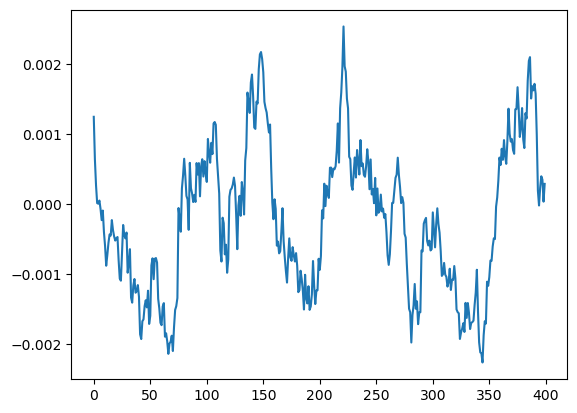

In [199]:
plt.plot(minuss - pluss)

In [130]:
beg = 200
np.mean(-pluss[beg:] + minuss[beg:])

0.0016557634083045026

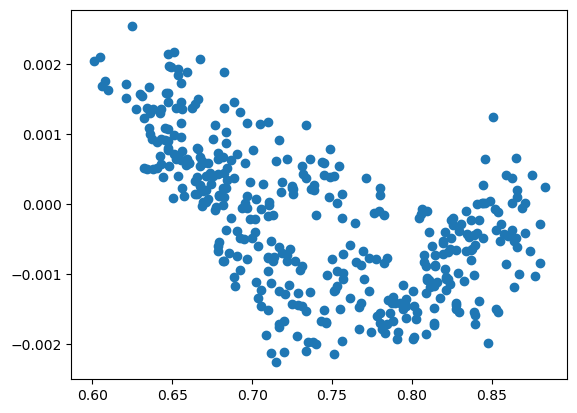

In [200]:
rho = row.rho.values[0]
# rho
# row.rho.values[0]
plt.scatter(rho, minuss - pluss)

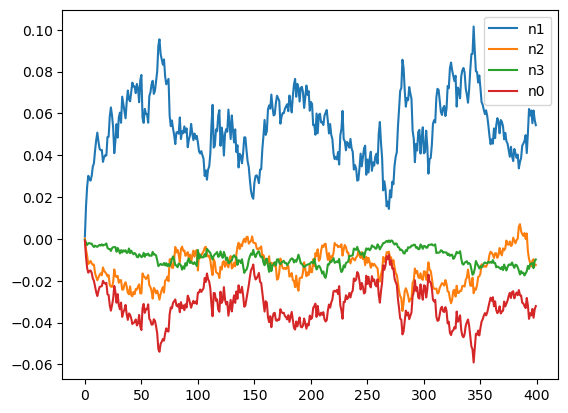

In [201]:
n1_rho = 3*rho**2*(1-rho) 
n2_rho = 3*rho*(1-rho)**2
n3_rho = (1-rho)**3 
n0_rho = rho**3

n2_true = row[triad_names_map['BN1']].values[0] + row[triad_names_map['BH1']].values[0] + row[triad_names_map['BH2']].values[0]
n1_true = row[triad_names_map['UN1']].values[0] + row[triad_names_map['UH1']].values[0] + row[triad_names_map['UH0']].values[0]
n3_true = row[triad_names_map['UH2']].values[0]
n0_true = row[triad_names_map['BH0']].values[0]

plt.plot(n1_rho - n1_true)
plt.plot(n2_rho - n2_true)
plt.plot(n3_rho - n3_true)
plt.plot(n0_rho - n0_true)

plt.legend(['n1', 'n2', 'n3', 'n0'])

/tmp/ipykernel_76370/1355872723.py:44: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


Text(0, 0.5, '$\\sin (\\theta)$')

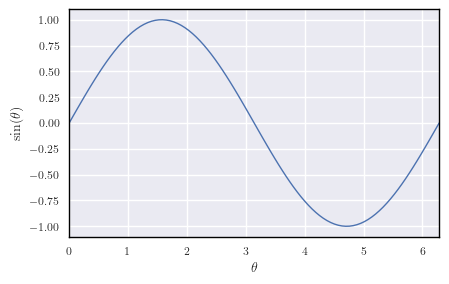

In [129]:
def set_size(width, fraction=1, subplots=(1, 1)):
    """Set figure dimensions to avoid scaling in LaTeX.

    Parameters
    ----------
    width: float or string
            Document width in points, or string of predined document type
    fraction: float, optional
            Fraction of the width which you wish the figure to occupy
    subplots: array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim: tuple
            Dimensions of figure in inches
    """
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    else:
        width_pt = width

    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    # https://disq.us/p/2940ij3
    golden_ratio = (5**.5 - 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])

    return (fig_width_in, fig_height_in)

import numpy as np
import matplotlib.pyplot as plt

# Using seaborn's style
plt.style.use('seaborn')
width = 345
# width = 1000

tex_fonts = {
    # Use LaTeX to write all text
    "text.usetex": True,
    "font.family": "serif",
    # Use 10pt font in plots, to match 10pt font in document
    "axes.labelsize": 10,
    "font.size": 10,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8
}

plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams.update(tex_fonts)
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 4

x = np.linspace(0, 2*np.pi, 100)
# Initialise figure instance
fig, ax = plt.subplots(1, 1, figsize=set_size(width))
# Plot
ax.plot(x, np.sin(x))
ax.set_xlim(0, 2 * np.pi)
ax.set_xlabel(r'$\theta$')
ax.set_ylabel(r'$\sin (\theta)$')



In [130]:
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])
figsize = (figsize[0] * 1.7, figsize[1] * 1.7)
# figsize = 

In [ ]:
"""Four triads
"""


save_ = True
fun_prepare_data = prepare_data2
linewidth = None
orientation = 'h' # 'v' or 'h'
which_ticks = 'zero' #'zero', 'normal'

reverse = True

width = 345
figsize = set_size(width)
# figsize = (figsize[0] * 1.7, figsize[1])

sim_data = mean_data.copy()
sim_data_std = std_data.copy()
real_data = results_realnet.copy()
if reverse:
    order = results_realnet.columns.tolist()
    order.reverse()
    real_data = results_realnet[order]
    
    order = mean_data.columns.tolist()
    order.reverse()
    sim_data = sim_data[order]
    std_data_std = std_data[order]

triads = ['tr2', 'tr6', 'tr5', 'tr1']
all_sets = [n1_triads, n2_triads]

if orientation == 'v':
    figsize = (figsize[0] , figsize[1] * 1.5)
elif orientation == 'h':
    figsize = (figsize[0] , figsize[1])
# figsize = 

if fun_prepare_data == prepare_data2:
    line_level = 0
else:
    line_level = 1/3


sim_pos = 0
real_pos = 1
if orientation == 'v':
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharey=True)
elif orientation == 'h':
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)


# Simulated nets
colors = sns.color_palette("Set2").as_hex()[:8]
sim_labels = [r'$q={q:.2f}$'.format(q=q) for q in sim_data.columns.values]
print(sim_labels)
# plot_bar_simulatednets(ax=axes[sim_pos, 0], triads_set=n1_triads, title='n1', labels=sim_labels, colors=colors)
triads_set = triads
ydata, yerr = prepare_data3(sim_data, all_sets, triads_set, std_data = sim_data_std)
print(ydata)
title = r'$\Delta_1$'
plot_bar_nets(axes[sim_pos], ydata, yerr, triads_set, None, labels = sim_labels, line_level = line_level, linewidth = linewidth, colors=colors[0:3][::-1], width = 0.2, smallest_edge = True)
# plot_bar_simulatednets(ax=axes[sim_pos, 1], triads_set=n2_triads, title='n2', labels=sim_labels, colors=colors)
# triads_set = n2_triads
# ydata, yerr = fun_prepare_data(mean_data, triads_set, std_data = std_data)
# title = r'$\Delta_2$'

# plot_bar_nets(axes[sim_pos, 1], ydata, yerr, triads_set, title, labels = sim_labels, line_level = line_level, colors=colors, linewidth = linewidth)

# Realnets
triads_set = triads
ydata, _ = prepare_data3(real_data, all_sets, triads_set)

plot_bar_nets(axes[real_pos], ydata, None, triads_set, None, labels = None, line_level = line_level, colors=colors[3:], linewidth = linewidth, width = 0.2)
# plot_bar_realnets(ax=axes[real_pos, 1], triads_set=n2_triads, title='')
# triads_set = n2_triads

# ydata, _ = fun_prepare_data(results_realnet, triads_set)

# plot_bar_nets(axes[real_pos, 1], ydata, None, triads_set, None, labels = None, line_level = line_level, colors=colors, linewidth = linewidth)

# fix tick rotations
for ax in axes.flatten():
    for tick in ax.get_xticklabels():
        tick.set_rotation(0)
# fix tick labels
for ax in axes.flatten():
    ax.set_xticklabels([triad_names_map[tick.get_text()] for tick in ax.get_xticklabels()])
# drop double legend
for i in (sim_pos, real_pos):
#     axes[i, 1].get_legend().remove()
#     axes[i,1].set_ylabel('')
    # set legend to left top corner
    axes[i].legend(loc='upper left')
    axes[i].set_ylabel('')
    
ticks = axes[i].get_yticklabels()
ticks = axes[i].get_yticks()
print(ticks)
if which_ticks == "normal":
    ticks2 = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6]) - 1/3
    axes[1].set_yticks(ticks2)
    # axes[i,0].set_yticks(ticks - 0.1)
    axes[i].set_yticklabels([r'{tick:.1f}'.format(tick=tick+1/3) for tick in ticks2])

fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
# plt.xlabel("common X")
plt.ylabel("Deviation from expected relative density")

fname = 'barplots_sim_real'
fname = fname + "_down"
fname = fname + "_down_nx"
fname = fname + "_v2"

fname = fname + "_" + orientation
fname = fname + "_" + which_ticks

if reverse is True:
    fname = fname + "_rev"

if linewidth is None:
    fname = fname + "_noline"

fig.tight_layout()
plt.show()
if save_:
    fname = fname + ".pdf"
    fig.savefig(save_fig_path / fname, format='pdf', bbox_inches='tight') 

### Time series of specific triad densities

In [ ]:

outputs_dir_triads_wiki2 = Path("../../outputs/LtdReal/outputs/wiki2-s400-triads")
outputs_dir_triads_wiki2_1000 = Path("../../outputs/LtdReal/outputs/wiki2-s1000-triads")

In [54]:
# df, rho_inits = process_folder(outputs_dir_test)
df_w2 = process_folder(outputs_dir_triads_wiki2, no_triad_stats=False)
# df.head(3)
df_w2_1000 = process_folder(outputs_dir_triads_wiki2_1000, no_triad_stats=False)
# df.head(3)
df_w2

,index,q,p,ps,rho_init,steps,rho,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,Lplus
0,0,0.8,1.0,1.0,0.794729,400,"[0.7905982007734993, 0.8482428115015974, 0.873...","[0.008964818904505015, 0.0041653903414844255, ...","[0.03393442118597251, 0.0231517585197214, 0.01...","[0.03433437356622422, 0.019660535401136187, 0....","[0.12985209787730959, 0.11106236180575156, 0.0...","[0.03431297143216393, 0.021628194101304326, 0....","[0.12943341862975513, 0.11174187956216584, 0.0...","[0.13076971437514462, 0.1045574506848014, 0.08...","[0.495107605917155, 0.6007418514718649, 0.6631...","[75227.0, 80712.0, 83113.0, 84673.0, 85902.0, ..."
1,1,0.8,1.0,1.0,0.794729,400,"[0.7962418025895409, 0.853371447788801, 0.8789...","[0.008188991544819413, 0.0036223111897045034, ...","[0.032602138340719296, 0.02187298100961892, 0....","[0.03272386297818721, 0.018075439847295774, 0....","[0.12632342102411886, 0.1076741364573315, 0.09...","[0.03322948839536162, 0.020282534922263437, 0....","[0.12943743152989143, 0.11000295616976707, 0.0...","[0.1288783007775663, 0.10135916927616645, 0.08...","[0.5053257872975659, 0.6138198930160824, 0.675...","[75764.0, 81200.0, 83631.0, 85276.0, 86389.0, ..."
2,0,0.8,1.0,1.0,-0.500000,400,"[0.7928997814023877, 0.8318164620817219, 0.851...","[0.012419925921863483, 0.0069623817364888995, ...","[0.02741479609785591, 0.020056474881251597, 0....","[0.01068902832973733, 0.007189779410879507, 0....","[0.07192053387623414, 0.0634921059566152, 0.05...","[0.04946166944671471, 0.03921941066548598, 0.0...","[0.0648712059701253, 0.05916084907616351, 0.05...","[0.07746903713136497, 0.06540893458839014, 0.0...","[0.6824632251143342, 0.7352194855729552, 0.771...","[75446.0, 79149.0, 80981.0, 82270.0, 83252.0, ..."
3,1,0.8,1.0,1.0,-0.500000,400,"[0.7929102909029763, 0.8312384395493526, 0.850...","[0.01241591302172718, 0.007276725580499446, 0....","[0.02741345846447714, 0.01987589437511788, 0.0...","[0.010690365963116098, 0.007045315005972533, 0...","[0.0719218715096129, 0.06312291914407515, 0.05...","[0.04946300708009348, 0.03939731590486217, 0.0...","[0.0648712059701253, 0.05971329166159481, 0.05...","[0.07747037476474374, 0.06528453468416469, 0.0...","[0.6824632251143342, 0.7349934255319434, 0.767...","[75447.0, 79094.0, 80888.0, 82113.0, 83105.0, ..."
4,2,0.8,1.0,1.0,-0.500000,400,"[0.7928997814023877, 0.8314486295611233, 0.850...","[0.012419925921863483, 0.007098820341123265, 0...","[0.02741479609785591, 0.0199467889441926, 0.01...","[0.01068902832973733, 0.007183091243985666, 0....","[0.07192053387623414, 0.061977904971849504, 0....","[0.04946166944671471, 0.038729836848856794, 0....","[0.0648712059701253, 0.059132758775209376, 0.0...","[0.07746903713136497, 0.06457291372665996, 0.0...","[0.6824632251143342, 0.7380673070363528, 0.774...","[75446.0, 79114.0, 80956.0, 82249.0, 83252.0, ..."
5,3,0.8,1.0,1.0,-0.500000,400,"[0.7928997814023877, 0.8307550025222802, 0.850...","[0.012419925921863483, 0.007375710450528298, 0...","[0.02741479609785591, 0.02028788545577851, 0.0...","[0.01068902832973733, 0.007045315005972533, 0....","[0.07192053387623414, 0.06359109082664405, 0.0...","[0.04946166944671471, 0.03900538932488306, 0.0...","[0.0648712059701253, 0.06028312348095009, 0.05...","[0.07746903713136497, 0.0657607321670062, 0.05...","[0.6824632251143342, 0.7333601751764672, 0.769...","[75446.0, 79048.0, 80937.0, 82295.0, 83321.0, ..."
6,4,0.8,1.0,1.0,-0.500000,400,"[0.7928997814023877, 0.8313330250546495, 0.851...","[0.012419925921863483, 0.0074305534190577975, ...","[0.02741479609785591, 0.02013138235046262, 0.0...","[0.01068902832973733, 0.007181753610606897, 0....","[0.07192053387623414, 0.06326069538208828, 0.0...","[0.04946166944671471, 0.03866964334681222, 0.0...","[0.0648712059701253, 0.059535386422218624, 0.0...","[0.07746903713136497, 0.06499961877448705, 0.0...","[0.6824632251143342, 0.7355003885824966, 0.769...","[75446.0, 79103.0, 81003.0, 82313.0, 83292.0, ..."
7,5,0.8,1.0,1.0,-0.500000,400,"[0.7928997814023877, 0.8319530855893728, 0.852..."

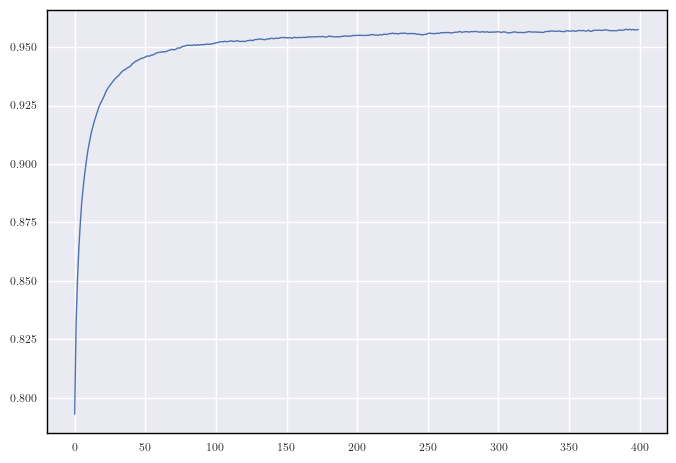

In [39]:
df_one = df_w2.iloc[0].rho
df_one
plt.plot(df_one)

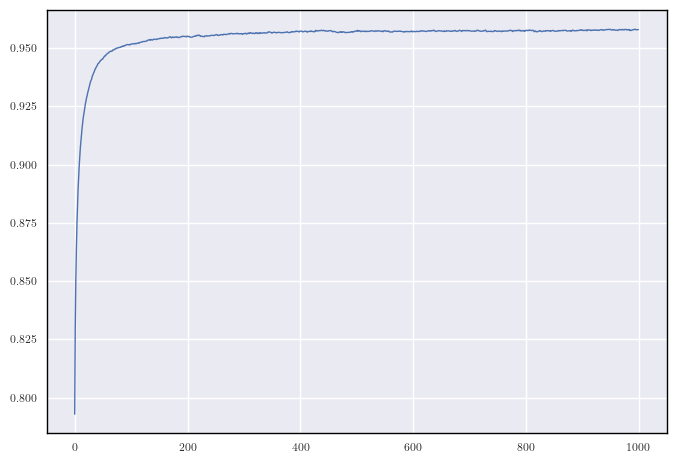

In [41]:
df_one = df_w2_1000.iloc[0].rho
df_one
plt.plot(df_one)

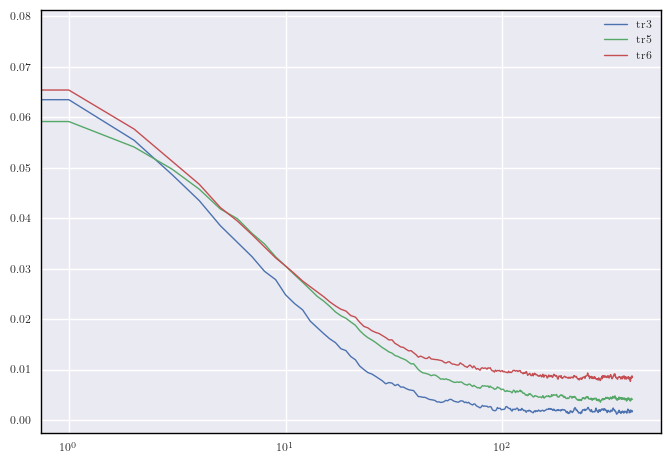

In [46]:
# df_one = df_w2.iloc[0].rho
# df_one
# plt.plot(df_one)

# plt.plot()

for triad in n1_triads:
    plt.plot(df_w2.iloc[0][triad])
    
plt.legend(n1_triads)
plt.xscale('log')

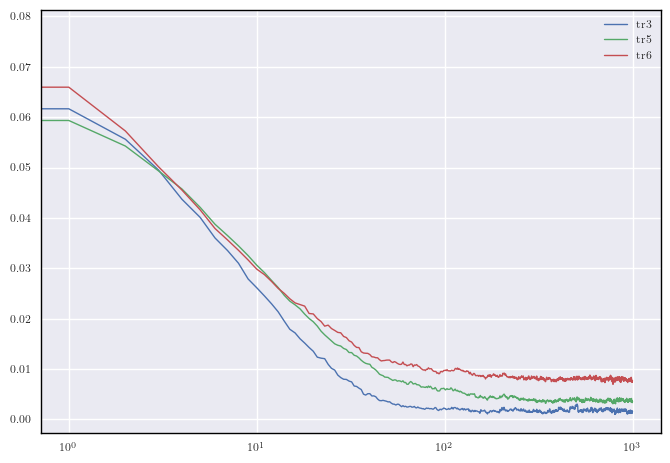

In [48]:
# df_one = df_w2.iloc[0].rho
# df_one
# plt.plot(df_one)

# plt.plot()

for triad in n1_triads:
    plt.plot(df_w2_1000.iloc[0][triad])
    
plt.legend(n1_triads)
plt.xscale('log')

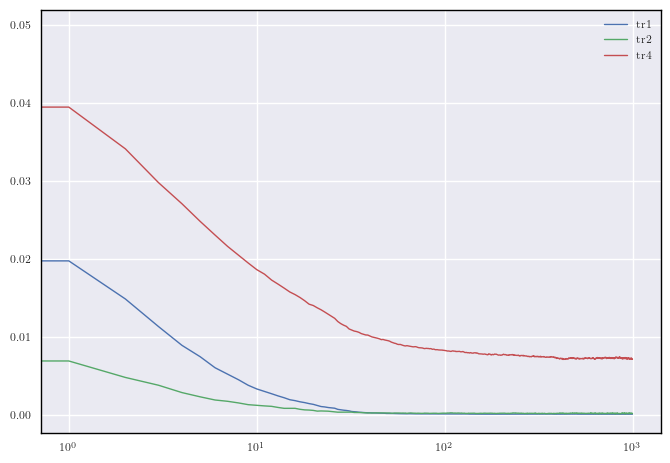

In [51]:
# df_one = df_w2.iloc[0].rho
# df_one
# plt.plot(df_one)

# plt.plot()

for triad in n2_triads:
    plt.plot(df_w2_1000.iloc[0][triad])
    
plt.legend(n2_triads)
plt.xscale('log')

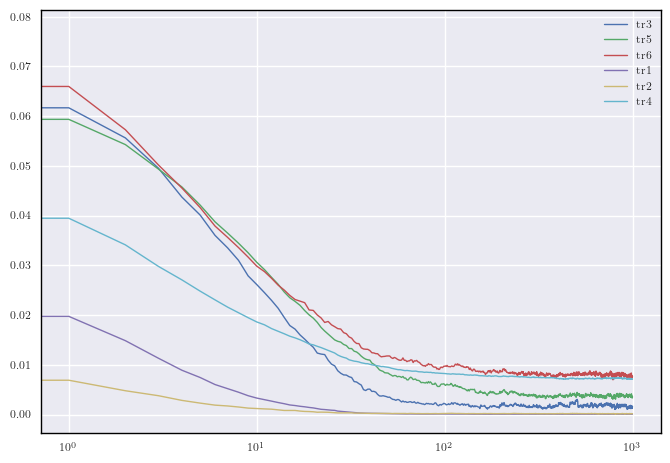

In [55]:
# df_one = df_w2.iloc[0].rho
# df_one
# plt.plot(df_one)

# plt.plot()

for triad in deg_triads:
    plt.plot(df_w2_1000.iloc[0][triad])
    
plt.legend(deg_triads)
plt.xscale('log')

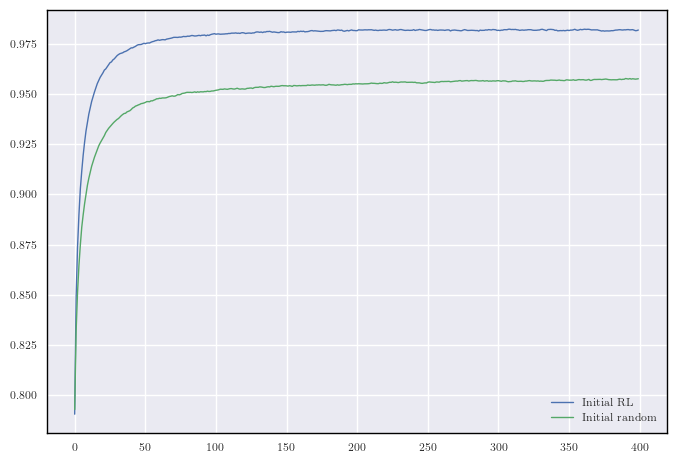

In [63]:
inds = np.where(df_w2.rho_init > 0)[0]
inds2 = np.where(df_w2.rho_init < 0)[0]

df_one = df_w2.loc[inds[0]].rho
df_one
plt.plot(df_one)
plt.plot(df_w2.loc[inds2[0]].rho)

plt.legend(["Initial RL", "Initial random"])

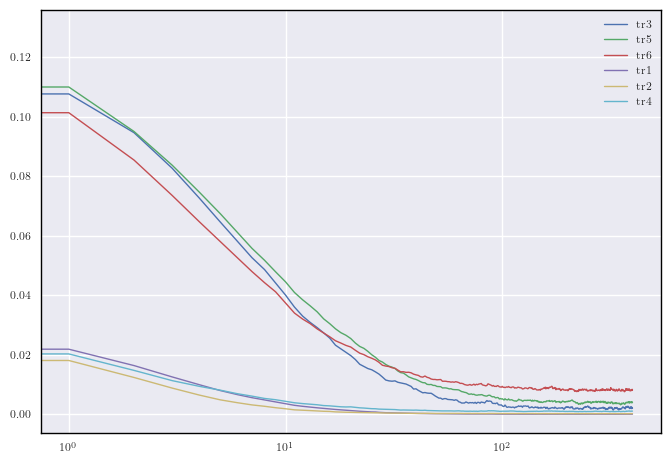

In [70]:
inds = np.where(df_w2.rho_init > 0)[0]
inds2 = np.where(df_w2.rho_init < 0)[0]

for triad in deg_triads:
    plt.plot(df_w2.loc[inds[1]][triad])
    
plt.legend(deg_triads)
plt.xscale('log')

In [51]:
wiki

,tr0,tr1,tr2,tr3,tr4,tr5,tr6,tr7,rho
0,0.012999,0.027805,0.010694,0.071937,0.049472,0.064931,0.078229,0.683932,0.794729


In [53]:
wiki_trans

,tr1,tr2,tr3,tr4,tr5,tr6,rho
0,-0.017263,-0.211768,0.001105,0.229031,-0.031463,0.030358,0.794729


# Checking strange result of transformed error functions. 

Eg when q=0 or q=1

In [89]:
df2_w1000_g.columns

Index(['q', 'p', 'ps', 'repetitions', 'rho_lvl', 'rho_lvl_std',
       'rho_lvl_valid', 'rho_lvl2', 'rho_lvl2_std', 'rho_lvl2_valid',
       'rho_lvl_exp', 'tr_valid', 'tr0_lvl', 'tr0_lvl_std', 'tr1_lvl',
       'tr1_lvl_std', 'tr2_lvl', 'tr2_lvl_std', 'tr3_lvl', 'tr3_lvl_std',
       'tr4_lvl', 'tr4_lvl_std', 'tr5_lvl', 'tr5_lvl_std', 'tr6_lvl',
       'tr6_lvl_std', 'tr7_lvl', 'tr7_lvl_std', 'rho', 'tr0', 'tr1', 'tr2',
       'tr3', 'tr4', 'tr5', 'tr6', 'tr7', 'closest_to_rho',
       'closest_to_high_underrepresentation',
       'closest_to_high_underrepresentation_transformed',
       'closest_to_four_triads', 'closest_to_four_triads_transformed',
       'closest_to_six_triads', 'closest_to_six_triads_transformed',
       'closest_to_six_triads_corrdevs_transformed',
       'closest_to_four_triads_corrdevs_transformed',
       'closest_to_six_triads_rho', 'closest_to_six_triads_rho_transformed',
       'closest_to_four_triads_rho', 'closest_to_four_triads_rho_transformed'],
      d

In [94]:
triad_lbs = []
for triad in deg_triads:
    triad_lbs.append(triad + "_lvl")

df2_w1000_g.loc[(0., 1., 0.5)][triad_lbs]

tr3_lvl    0.006883
tr5_lvl    0.013687
tr6_lvl    0.015746
tr1_lvl    0.000160
tr2_lvl    0.001274
tr4_lvl    0.006462
Name: (0.0, 1.0, 0.5), dtype: float64

In [100]:
df2_w1000_g.loc[(0., 1., 0.5)][deg_triads]

tr3    0.006883
tr5    0.013687
tr6    0.015746
tr1    0.000160
tr2    0.001274
tr4    0.006462
Name: (0.0, 1.0, 0.5), dtype: float64

In [107]:
# a = transform_data(df2_w1000_g.loc[(0., 1., 0.5)], triads_groups=(n1_triads, n2_triads))
df2_w1000_g_trans.loc[(0., 1., 0.5)][deg_triads]

tr3    0.006883
tr5    0.013687
tr6    0.015746
tr1    0.000160
tr2    0.001274
tr4    0.006462
Name: (0.0, 1.0, 0.5), dtype: float64

In [136]:
i_l = np.where(df2_w1000_g_trans['rho_lvl'] != df2_w1000_g['rho_lvl'])[0]

df2_w1000_g_trans.iloc[i_l]

q    p    ps  repetitions  rho_lvl  rho_lvl_std  \
1.0 0.5 0.40  1.0  0.5  0.40            1      NaN          NaN   
        0.45  1.0  0.5  0.45            1      NaN          NaN   
        0.55  1.0  0.5  0.55            1      NaN          NaN   
        0.70  1.0  0.5  0.70            1      NaN          NaN   

              rho_lvl_valid  rho_lvl2  rho_lvl2_std  rho_lvl2_valid  ...  \
1.0 0.5 0.40              0       NaN           NaN               0  ...   
        0.45              0       NaN           NaN               0  ...   
        0.55              0       NaN           NaN               0  ...   
        0.70              0       NaN           NaN               0  ...   

              tr6_lvl_std   tr7_lvl  tr7_lvl_std  rho       tr1           tr2  \
1.0 0.5 0.40          0.0  0.004639          0.0  NaN  0.083326  8.699612e-03   
        0.45          0.0       NaN          NaN  NaN  0.169760  3.071301e-02   
        0.55          0.0  0.943591          0.0  NaN  0.005186  3.999308e-05   
        0.70          0.0  0.984968          0.0  NaN  0.000829  1.059513e-07   

                   tr3       tr4       tr5       tr6  
1.0 0.5 0.40       NaN  0.036481  0.000348  0.024119  
        0.45       NaN  0.136467  0.007304  0.097028  
        0.55  0.019391  0.000537  0.003382  0.020188  
        0.70  0.002794  0.000162  0.000093  0.011131  

[4 rows x 35 columns]

In [143]:
df_w1000_trans.columns, df_w1000.columns

(Index(['index', 'q', 'p', 'ps', 'rho_init', 'steps', 'cur_steps', 'rho', 'tr1',
        'tr2', 'tr3', 'tr4', 'tr5', 'tr6', 'Lplus'],
       dtype='object'),
 Index(['index', 'q', 'p', 'ps', 'rho_init', 'steps', 'cur_steps', 'rho', 'tr0',
        'tr1', 'tr2', 'tr3', 'tr4', 'tr5', 'tr6', 'tr7', 'Lplus'],
       dtype='object'))

In [144]:
ch_cols = ['q', 'p', 'ps', 'repetitions', 'rho_lvl', 'rho_lvl_std',
        'rho_lvl_valid', 'rho_lvl2', 'rho_lvl2_std', 'rho_lvl2_valid',
        'rho_lvl_exp', 'tr_valid', 'tr0_lvl', 'tr0_lvl_std', 'tr1_lvl',
        'tr1_lvl_std', 'tr2_lvl', 'tr2_lvl_std', 'tr3_lvl', 'tr3_lvl_std',
        'tr4_lvl', 'tr4_lvl_std', 'tr5_lvl', 'tr5_lvl_std', 'tr6_lvl',
        'tr6_lvl_std', 'tr7_lvl', 'tr7_lvl_std', 'rho', 'tr1', 'tr2', 'tr3',
        'tr4', 'tr5', 'tr6']

ch_cols2 = [ 'q', 'p', 'ps', 'rho_init', 'steps', 'cur_steps', 'rho', 'tr1',
        'tr2', 'tr3', 'tr4', 'tr5', 'tr6', 'Lplus']

df2_w1000_g[ch_cols].equals(df2_w1000_g_trans[ch_cols]), df_w1000[ch_cols2].equals(df_w1000_trans[ch_cols2])

(True, False)

In [168]:
t_trans = transform_data(df2_w1000_g, triads_groups = (n1_triads, n2_triads))

df2_w1000_g[ch_cols].equals(t_trans[ch_cols])

# type(df2_w1000_g) == pd.DataFrame

# t_trans = df2_w1000_g.copy(deep=True)
# triads = n1_triads
# nn = transform_data(df2_w1000_g, triads)
# nn = nn.transpose()
# nn
# new_df = pd.DataFrame(nn, index = t_trans.index, columns=triads)
# new_df
# t_trans.update(new_df)

# df2_w1000_g[ch_cols].equals(t_trans[ch_cols])
# np.min(t_trans.tr3), np.min(new_df.tr3)

False

In [165]:
new_df.columns, t_trans.columns
new_df
t_trans.index

MultiIndex([( 0.0,  0.7,  0.5),
            ( 0.0, 0.75,  0.5),
            ( 0.0,  0.8,  0.5),
            ( 0.0,  0.9,  0.5),
            ( 0.0,  1.0,  0.5),
            ( 0.1,  0.7,  0.0),
            ( 0.1,  0.7,  0.1),
            ( 0.1,  0.7,  0.2),
            ( 0.1,  0.7,  0.3),
            ( 0.1,  0.7,  0.4),
            ...
            (0.95,  0.9, 0.45),
            (0.95,  1.0,  0.4),
            (0.95,  1.0, 0.45),
            ( 1.0,  0.5,  0.3),
            ( 1.0,  0.5,  0.4),
            ( 1.0,  0.5, 0.45),
            ( 1.0,  0.5,  0.5),
            ( 1.0,  0.5, 0.55),
            ( 1.0,  0.5,  0.6),
            ( 1.0,  0.5,  0.7)],
           length=615)

In [90]:
df2_w1000_g.loc[(0., 1., 0.5)][error_functions_names]

closest_to_rho                                     0.029148
closest_to_high_underrepresentation                0.000089
closest_to_high_underrepresentation_transformed    0.045173
closest_to_four_triads                             0.007320
closest_to_four_triads_transformed                 0.047704
closest_to_six_triads                              0.013444
closest_to_six_triads_transformed                  0.098376
closest_to_six_triads_corrdevs_transformed         1.047704
closest_to_four_triads_corrdevs_transformed        1.047704
closest_to_six_triads_rho                          0.159186
closest_to_six_triads_rho_transformed              0.156672
closest_to_four_triads_rho                         0.153062
closest_to_four_triads_rho_transformed             0.106000
Name: (0.0, 1.0, 0.5), dtype: float64

In [81]:
df2_w1000_g.loc[(0., 1., 0.5)]

q                                                  0.000000
p                                                  1.000000
ps                                                 0.500000
repetitions                                        1.000000
rho_lvl                                            0.965458
rho_lvl_std                                        0.000000
rho_lvl_valid                                      1.000000
rho_lvl2                                           0.965458
rho_lvl2_std                                       0.000000
rho_lvl2_valid                                     1.000000
rho_lvl_exp                                             NaN
tr_valid                                           1.000000
tr0_lvl                                            0.000076
tr0_lvl_std                                        0.000000
tr1_lvl                                            0.000160
tr1_lvl_std                                        0.000000
tr2_lvl                                 

{'whiskers': [<matplotlib.lines.Line2D at 0x7fbf4a1648b0>,
 'caps': [<matplotlib.lines.Line2D at 0x7fbf4a1693a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fbf4a164220>],
 'medians': [<matplotlib.lines.Line2D at 0x7fbf4a1697c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fbf4a169a60>],
 'means': []}

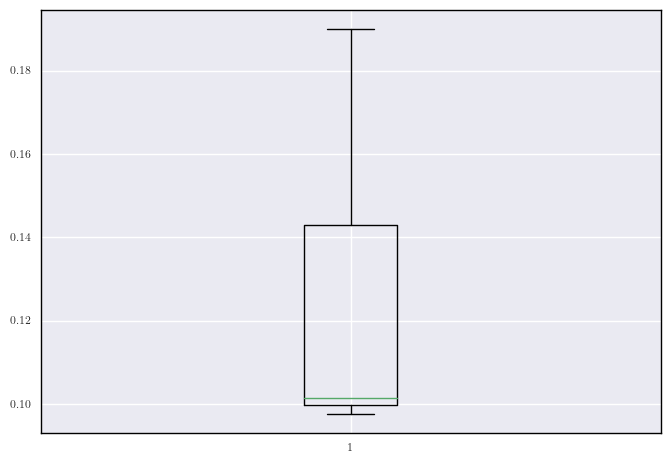

In [91]:
plt.boxplot(df2_w1000_g.closest_to_six_triads_transformed)